# Development Notebook for Error Handling 

We will use the valdiation data - the day of the earthquake - to detect anomalies by utilizing the absolute errors (or some transformation of them). This section is a **work in progress**. 

In order to estimate the model's `accuracy`, `recall`, `precision`, `F-score`, and `coverage`, we need to be able to classify specific time periods as anomalous - in this context, as ionoshperic disturbances related to tsunami waves. We will apply our developed detection approach over all of the results from the model's trained in order to arrive at at those quantitative measures. 


## Imports 

In [22]:
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from pathlib import Path
import plotly.graph_objects as go
from scipy import stats
import seaborn as sns
sns.set(style="darkgrid")
from tqdm.notebook import tqdm

## Read Data

Let's read in all the model errors.

In [16]:
# NOTE: this function is borrowed from the modeling notebook
def load_residuals(path: str) -> dict:
    """
    Loads model residuals from a specified path (Experiment save directory) 
    and returns a dictionary of pandas.DataFrames for each of the models and 
    residual values for later analysis. 
    """
    
    residual_dict = dict()

    for i in tqdm(list(os.walk(path))):

        if "residuals" in i[0]:
            
            # read in the test and validation residual dataframes 
            df_test = pd.read_csv(i[0] + "/" + i[2][0])
            df_valid = pd.read_csv(i[0] + "/" + i[2][1])
            
            # store them in a dictionary entry 
            residual_dict[i[0]] = {
                "test": df_test,
                "valid": df_valid
            }
    
    return residual_dict
        

In [17]:
residuals = load_residuals(path="../output/SatExperiment_hawaii_2012/output")

In [18]:
len(residuals)

51

In [19]:
# NOTE: this function is borrowed from the modeling notebook
def plot_predictions(dataframe: pd.DataFrame) -> None:
    """
    Plots the predicted and true values given a dataframe of values. 
    """
    
    # identify the dependent variable 
    dependent = None
    for col in dataframe.columns.values:
        split = col.split("__")
        if len(split) > 1:
            if "_" not in split[1]:
                dependent = col
                break
                    
    # ensure the data is of float type for plotting 
    dataframe[dependent + "_target"] = dataframe[dependent + "_target"].astype(float)
    dataframe["predicted"] = dataframe["predicted"].astype(float)
    
    # plot the things! 
    plt.figure(figsize=(30, 10))

    ax = sns.lineplot(x=dataframe.index, y=dependent + "_target", data=dataframe, color="gray")
    ax.lines[0].set_linestyle("--")

    ax2 = sns.scatterplot(x=dataframe.index, y=dependent + "_target",
                data=dataframe,
                color="gray")


    ax3 = sns.lineplot(x=dataframe.index, y="predicted", data=dataframe, color="blue")

    plt.show()

    
    
    

In [23]:
# NOTE: this function is borrowed from the modeling notebook
def plot_residuals(dataframe: pd.DataFrame) -> None:
    """
    Plots the absolute error (residuals) between the predicted and 
    true values given a dataframe of values. 
    """
    
    # identify the dependent variable 
    dependent = None
    for col in dataframe.columns.values:
        split = col.split("__")
        if len(split) > 1:
            if "_" not in split[1]:
                dependent = col
                break
                    
    # ensure the data is of float type for plotting 
    dataframe["absolute_error"] = dataframe["absolute_error"].astype(float)
    
    # calculate a simple moving average (3 minutes)
    dataframe["absolute_error_sma_3"] = dataframe["absolute_error"].rolling(3, min_periods=1).mean()

    # plot the things! 
    plt.figure(figsize=(30, 10))

    ax = sns.lineplot(x=dataframe.index, y="absolute_error", data=dataframe, color="gray")
    ax2 = sns.lineplot(x=dataframe.index, y="absolute_error_sma_3", data=dataframe, color="red")

    plt.show()

    
    
    


------------
../output/SatExperiment_hawaii_2012/output/ahup__G07/residuals


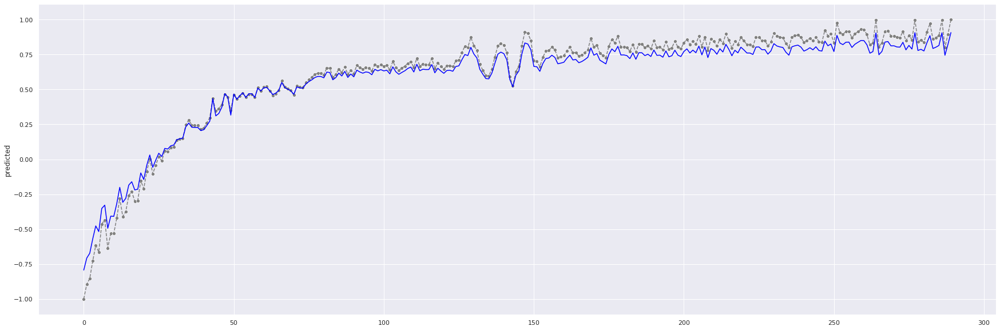

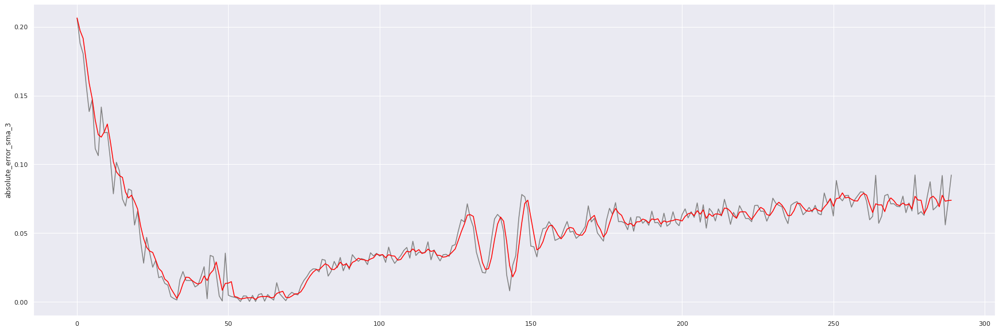


------------
../output/SatExperiment_hawaii_2012/output/ainp__G07/residuals


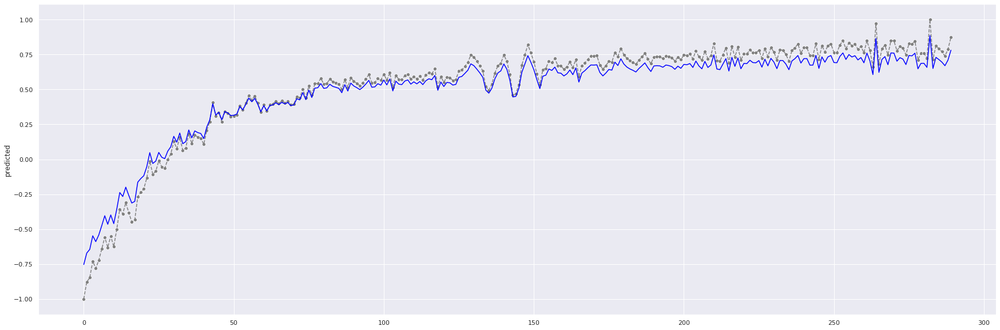

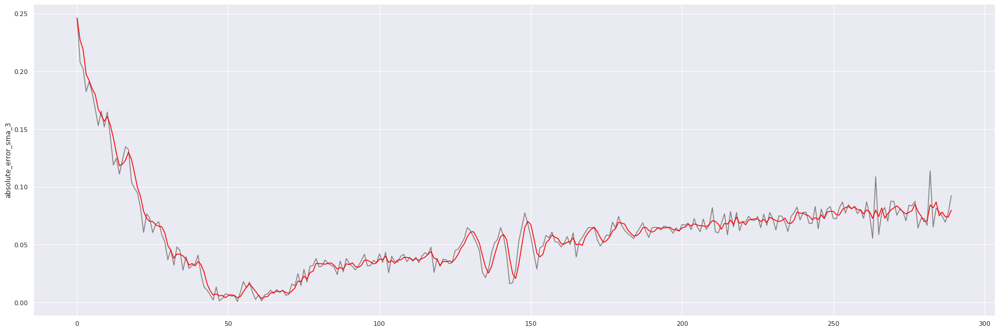


------------
../output/SatExperiment_hawaii_2012/output/alal__G07/residuals


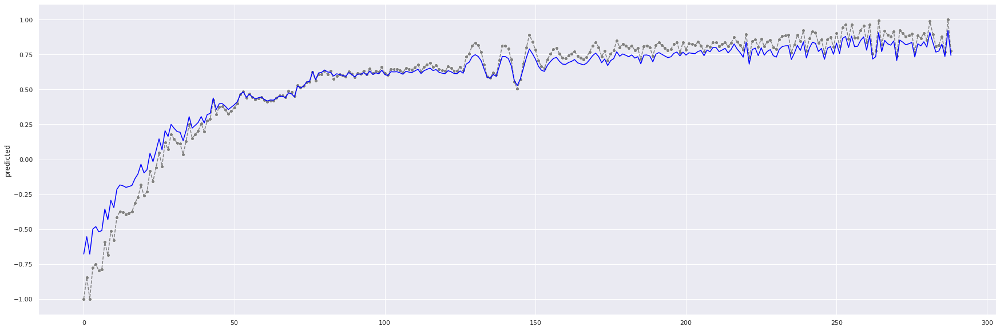

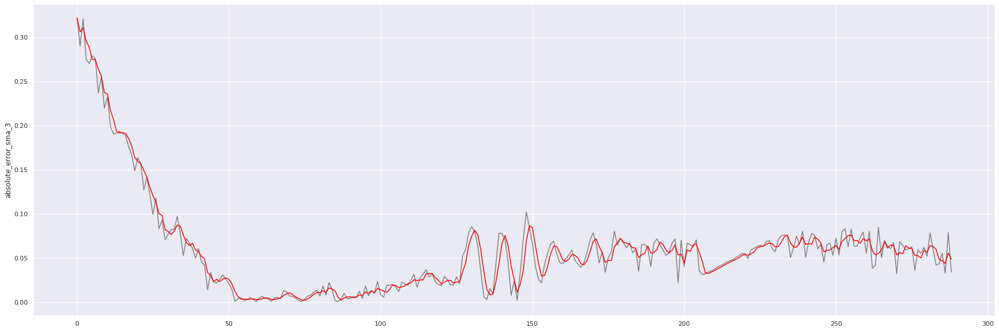


------------
../output/SatExperiment_hawaii_2012/output/alep__G07/residuals


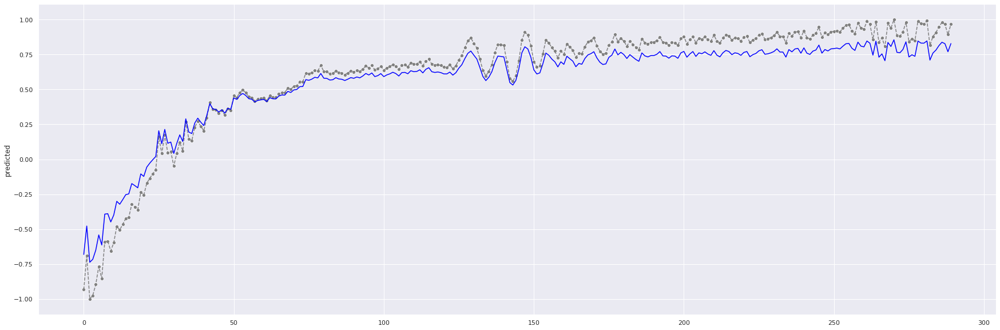

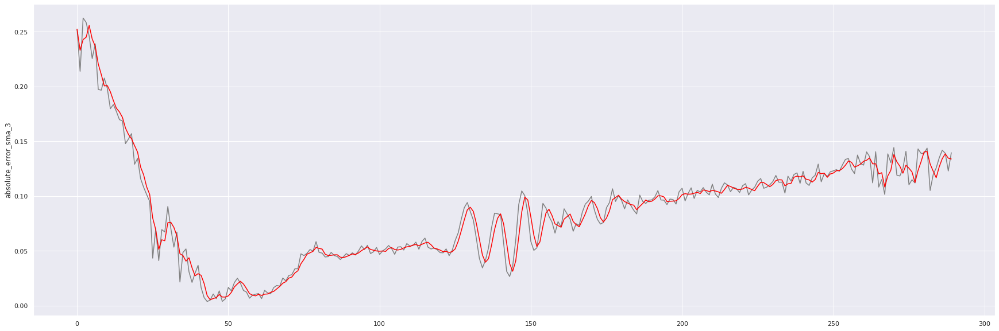


------------
../output/SatExperiment_hawaii_2012/output/blbp__G07/residuals


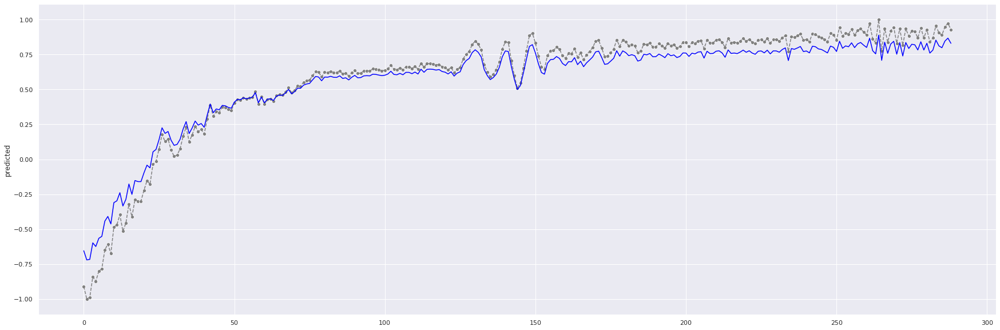

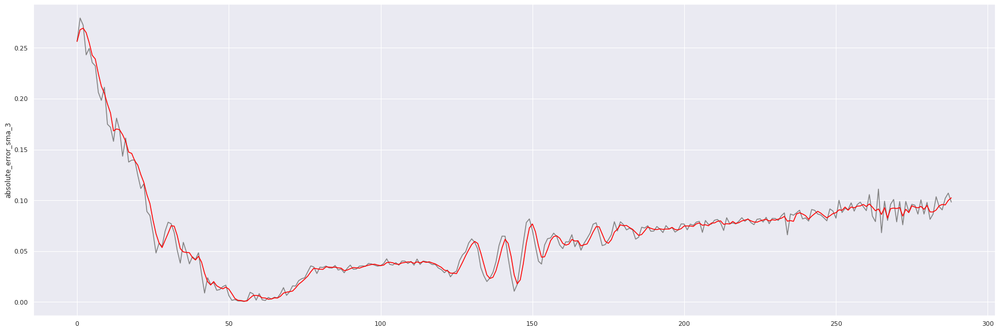


------------
../output/SatExperiment_hawaii_2012/output/byrl__G07/residuals


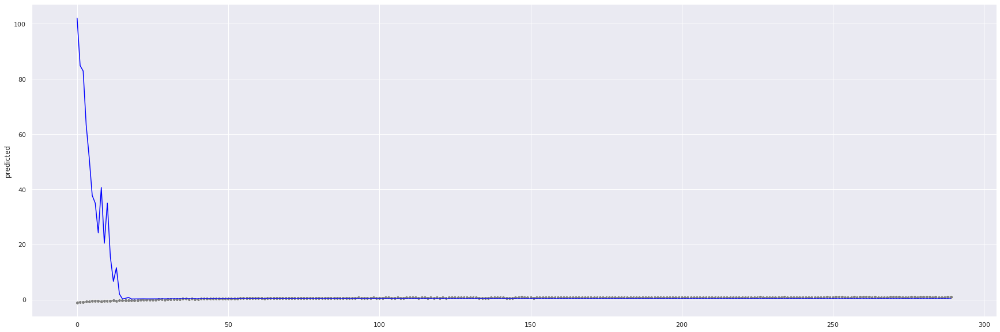

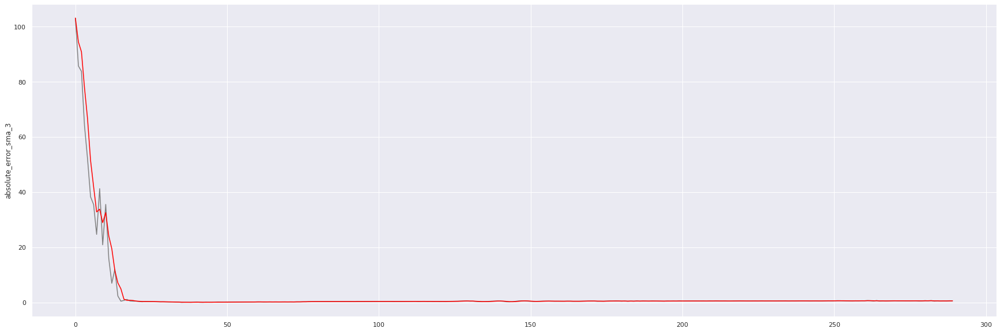


------------
../output/SatExperiment_hawaii_2012/output/cnpk__G07/residuals


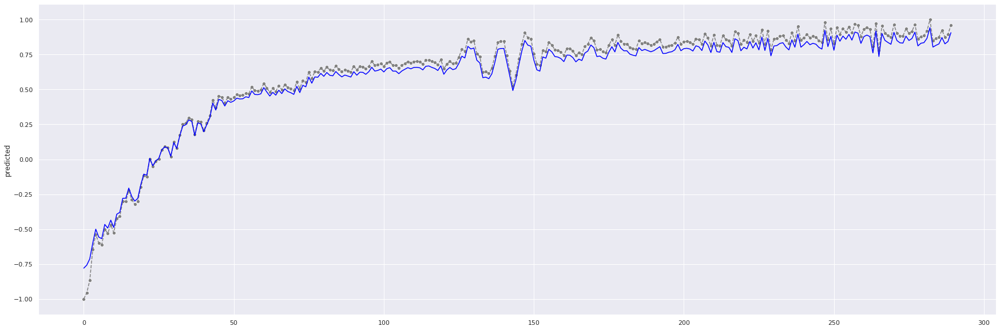

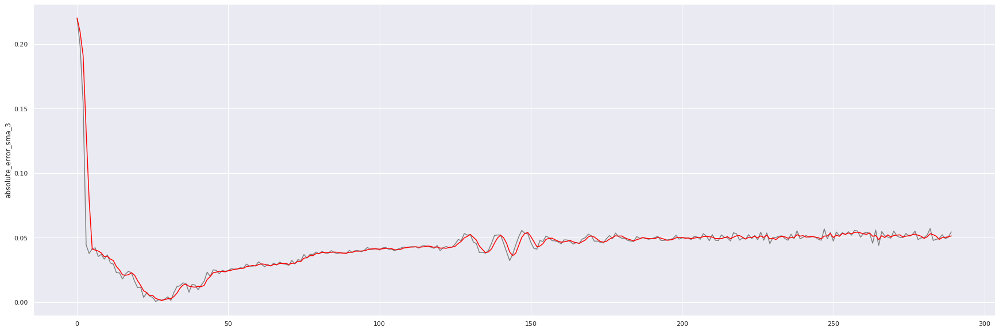


------------
../output/SatExperiment_hawaii_2012/output/crim__G07/residuals


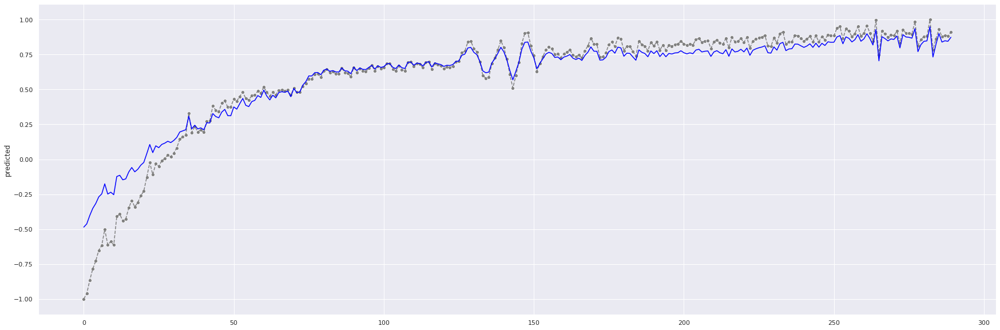

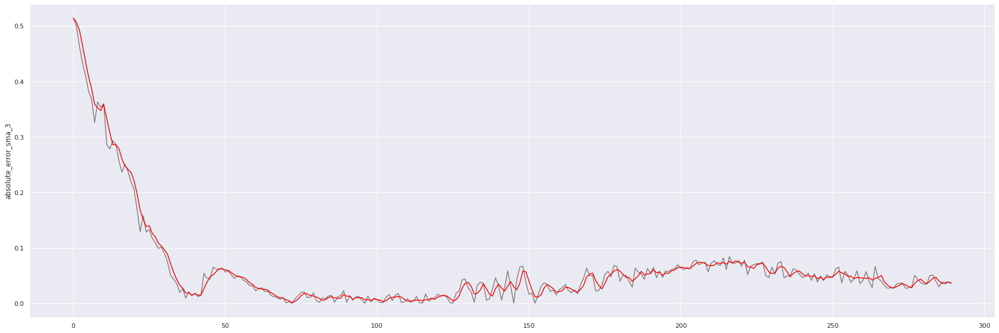


------------
../output/SatExperiment_hawaii_2012/output/gopm__G07/residuals


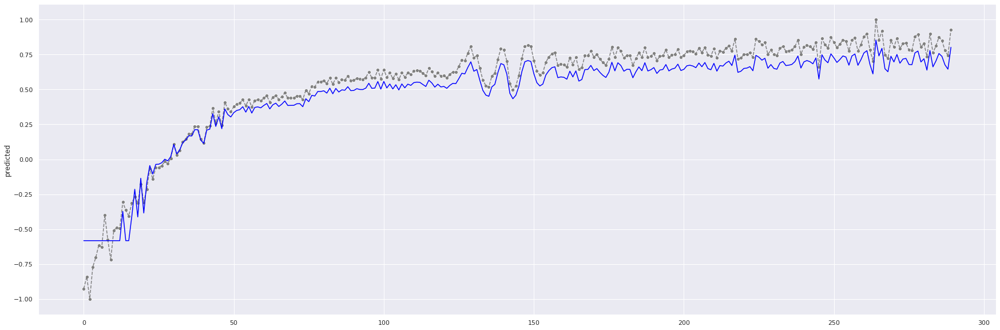

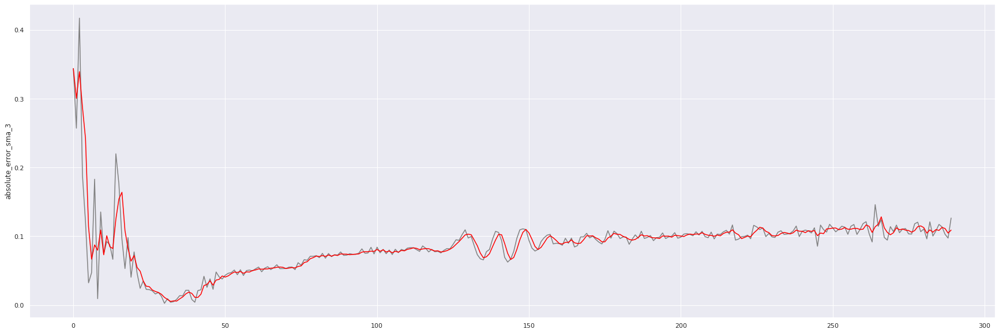


------------
../output/SatExperiment_hawaii_2012/output/jcuz__G07/residuals


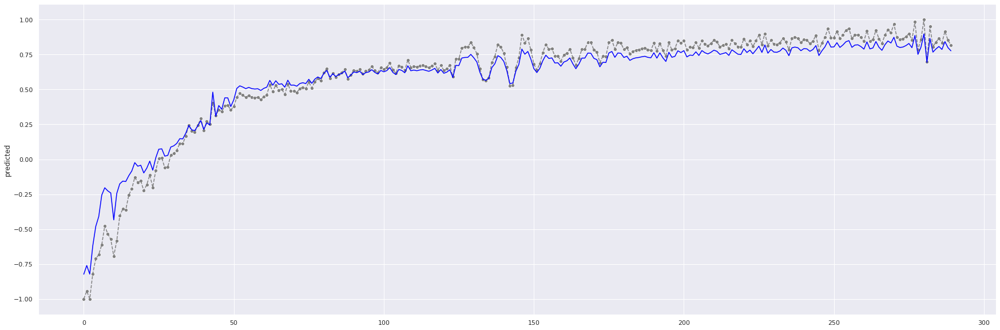

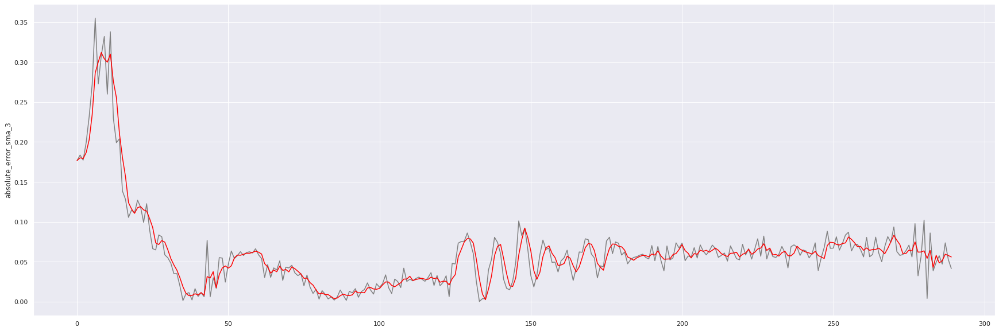


------------
../output/SatExperiment_hawaii_2012/output/joka__G07/residuals


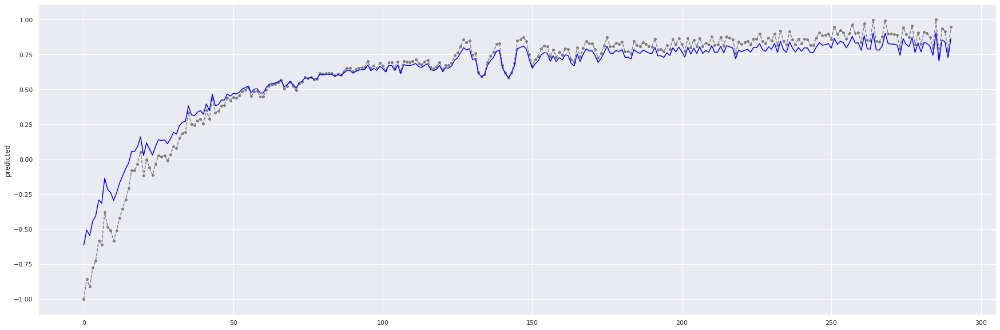

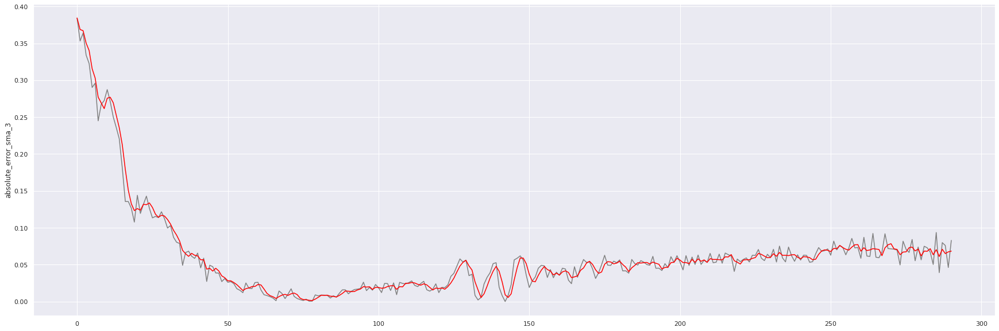


------------
../output/SatExperiment_hawaii_2012/output/kaep__G07/residuals


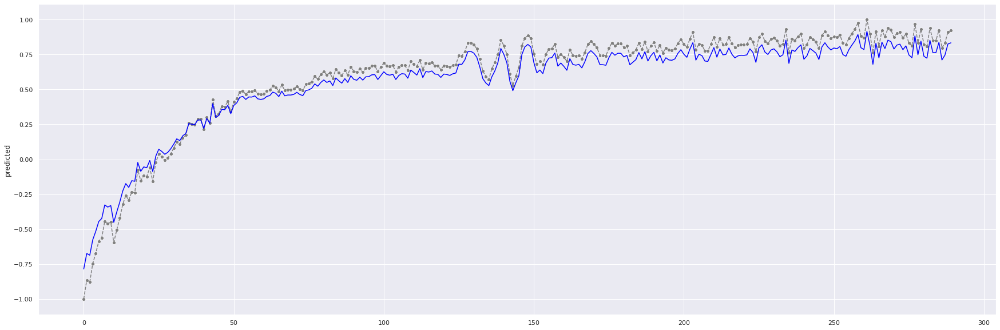

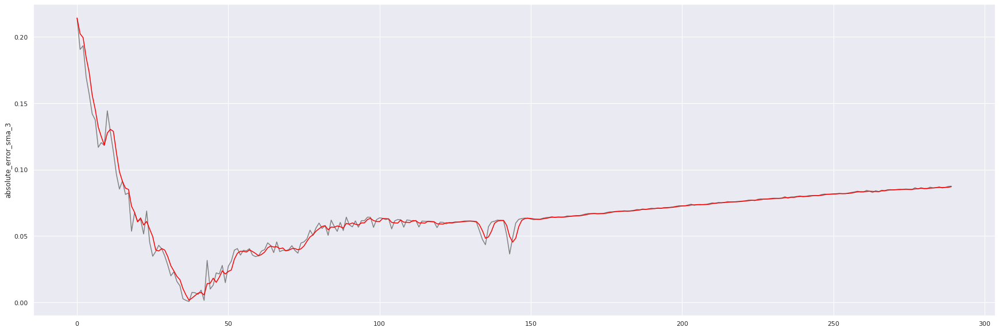


------------
../output/SatExperiment_hawaii_2012/output/kamo__G07/residuals


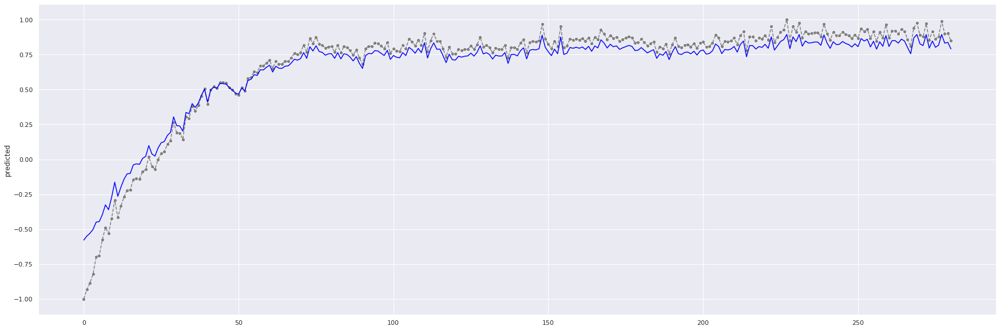

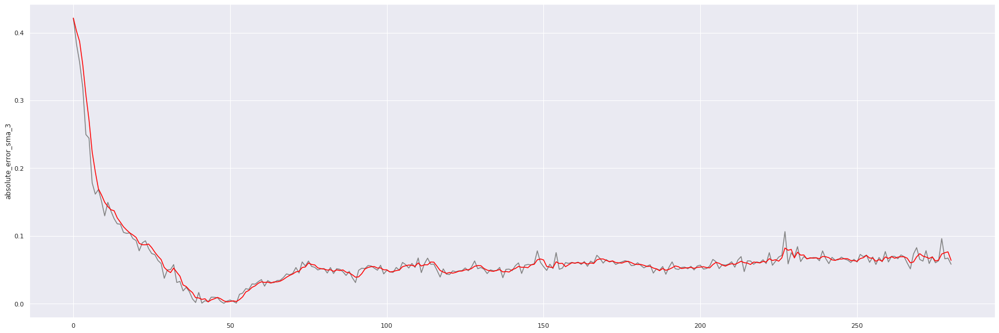


------------
../output/SatExperiment_hawaii_2012/output/kfap__G07/residuals


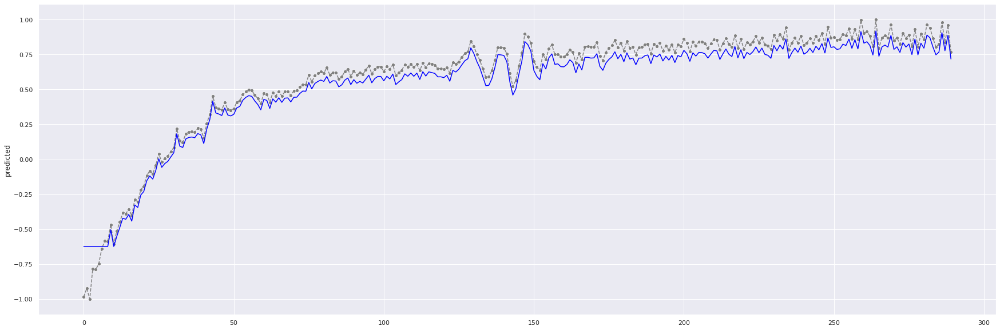

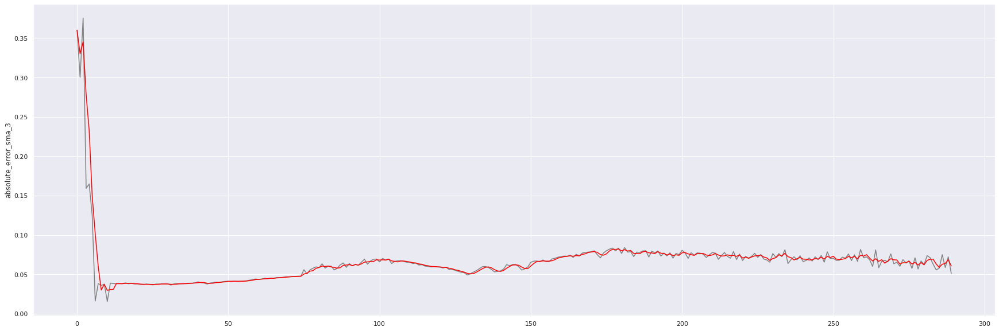


------------
../output/SatExperiment_hawaii_2012/output/khku__G07/residuals


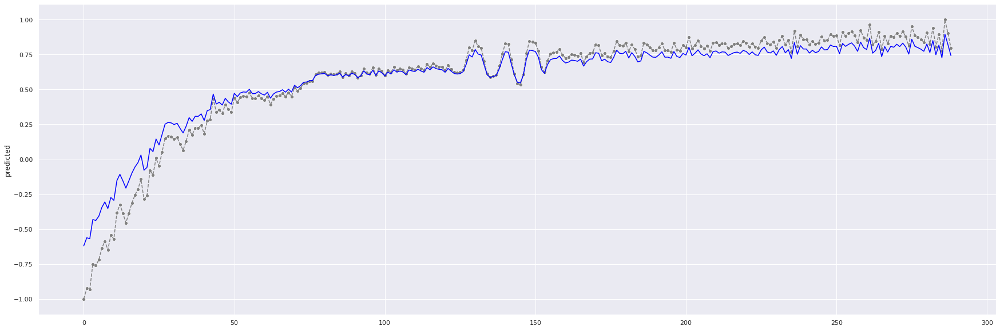

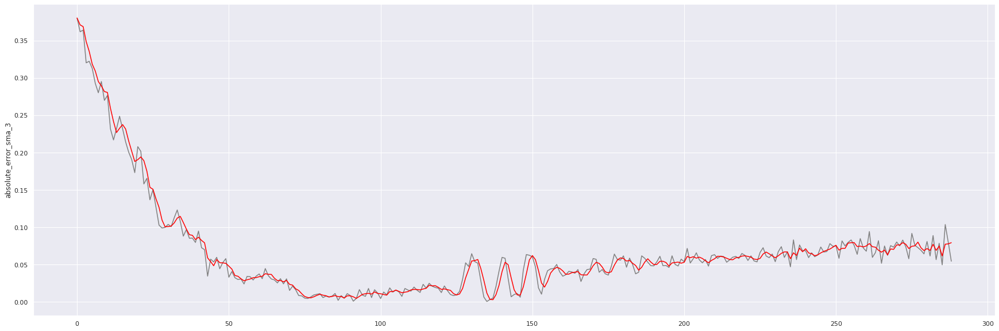


------------
../output/SatExperiment_hawaii_2012/output/knne__G07/residuals


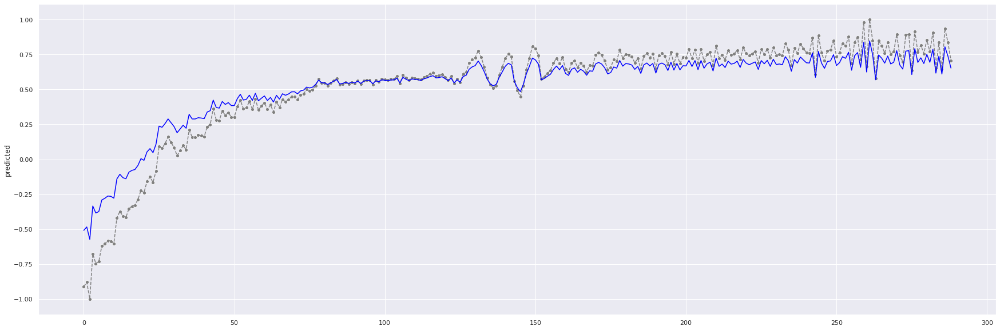

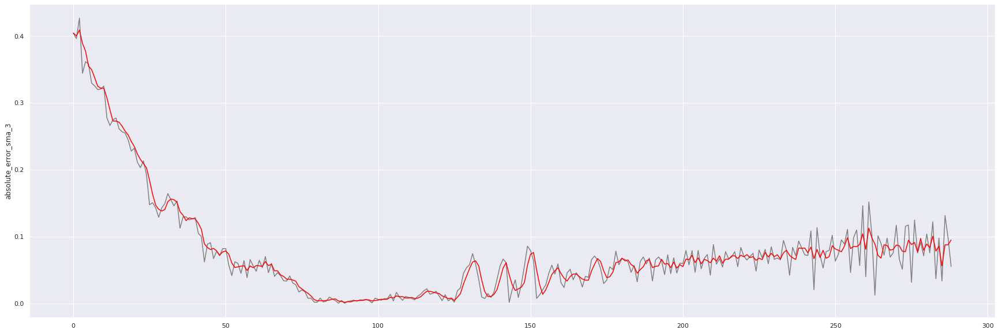


------------
../output/SatExperiment_hawaii_2012/output/kosm__G07/residuals


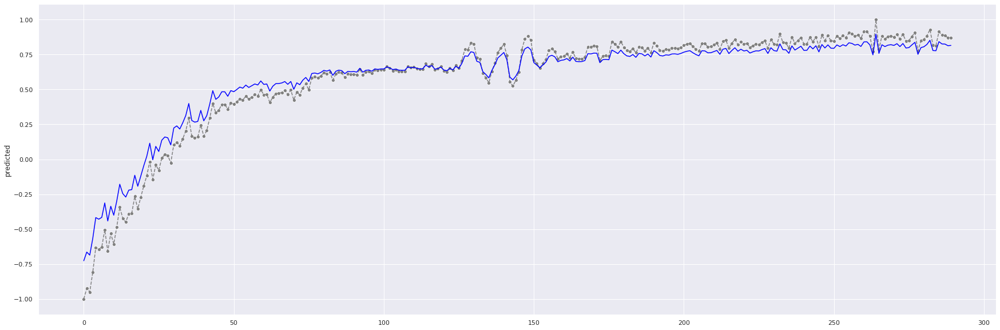

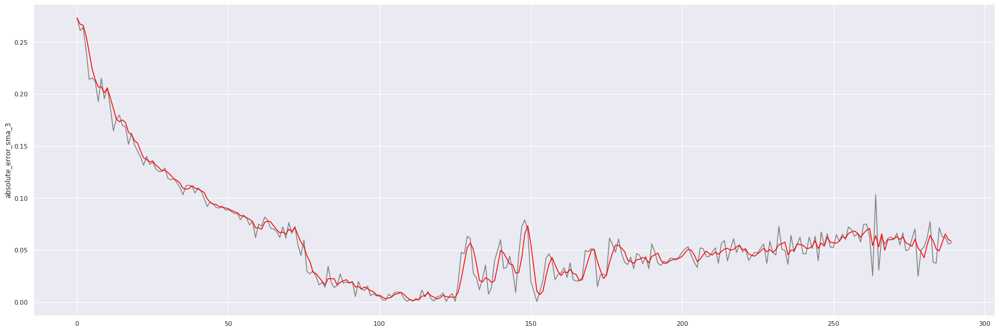


------------
../output/SatExperiment_hawaii_2012/output/ktpm__G07/residuals


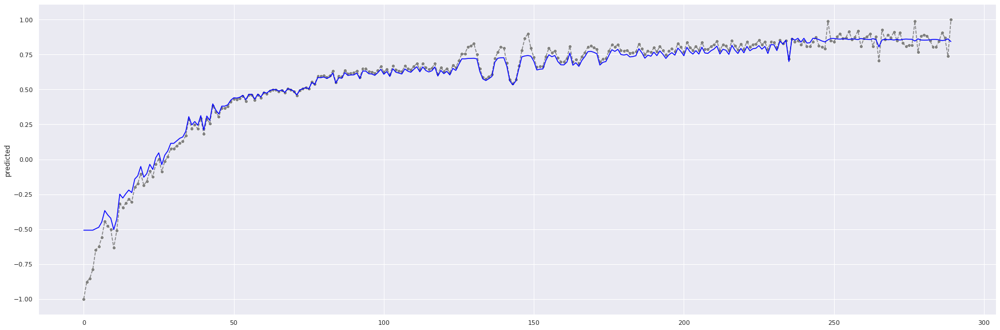

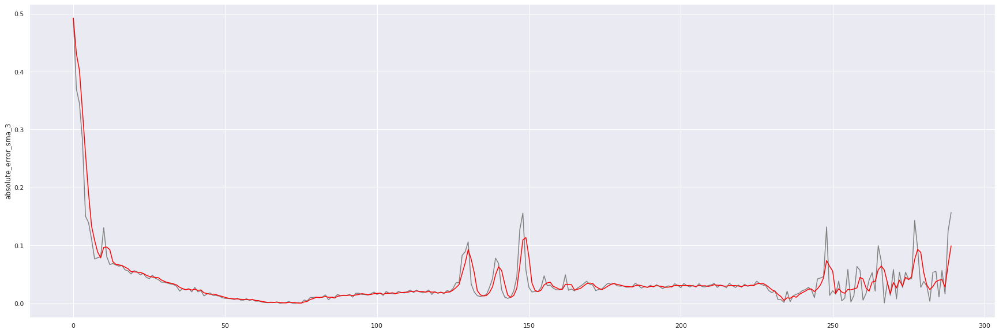


------------
../output/SatExperiment_hawaii_2012/output/leia__G07/residuals


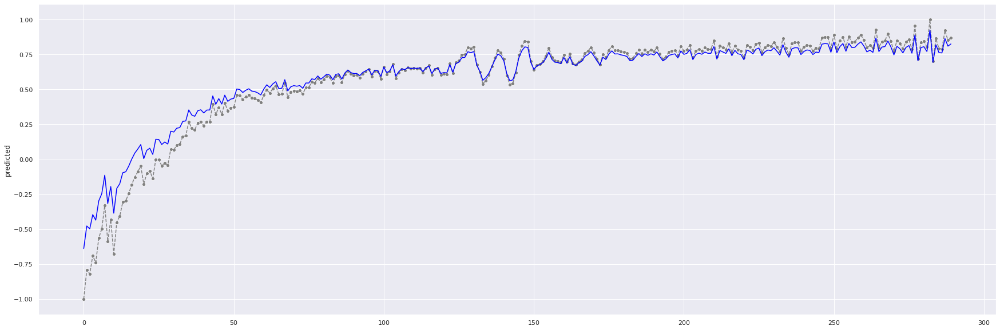

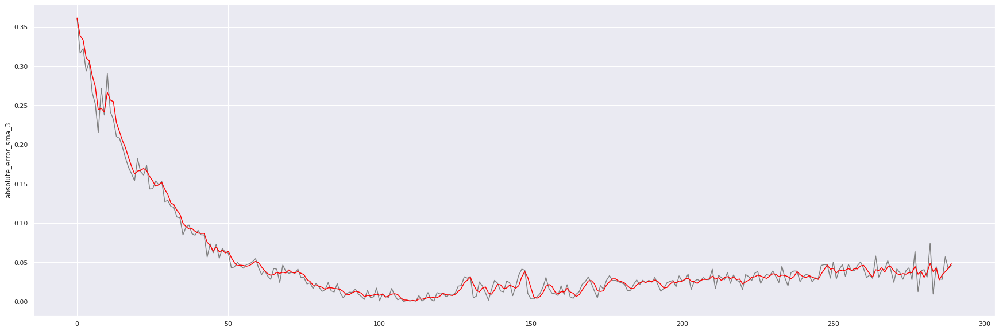


------------
../output/SatExperiment_hawaii_2012/output/mane__G07/residuals


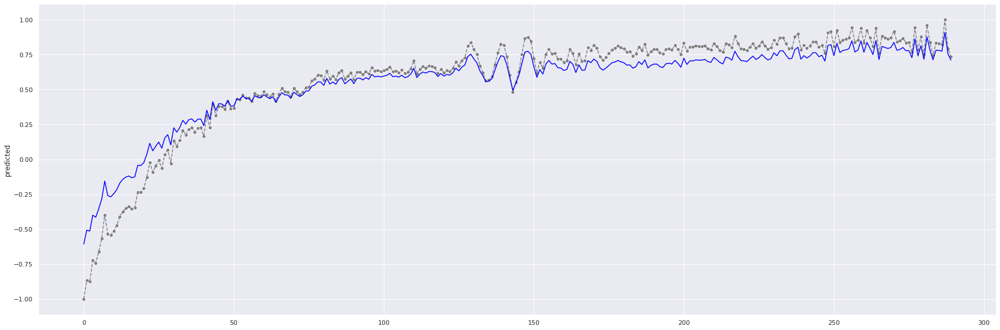

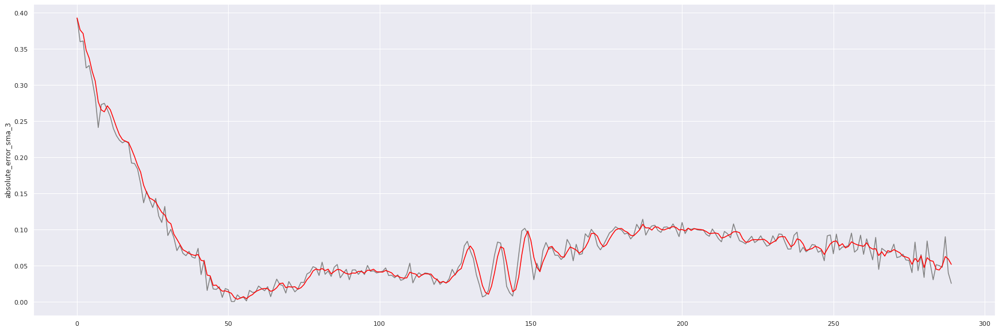


------------
../output/SatExperiment_hawaii_2012/output/mkai__G07/residuals


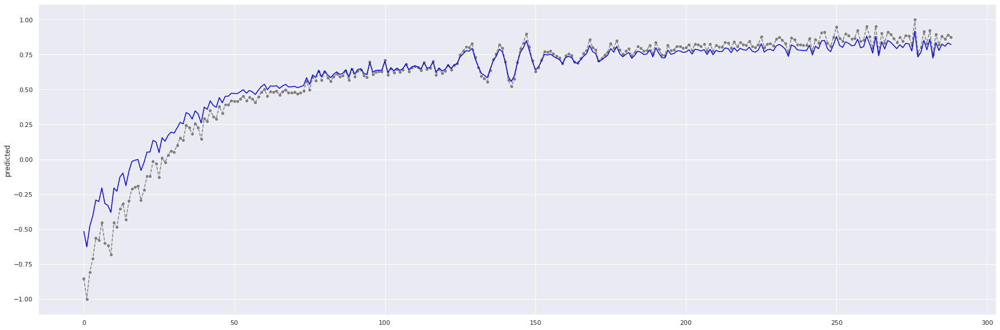

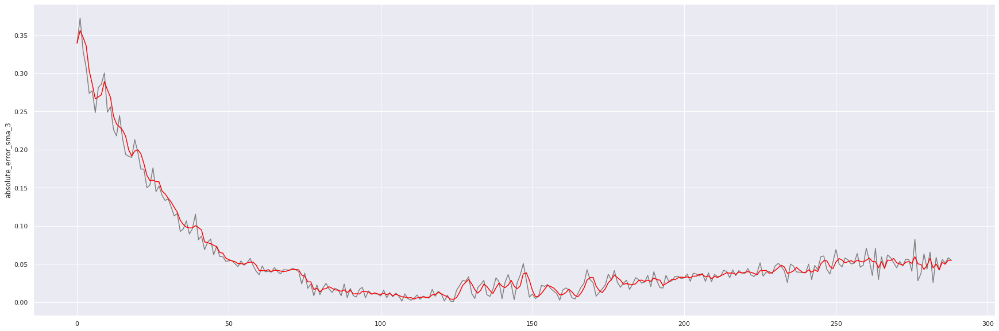


------------
../output/SatExperiment_hawaii_2012/output/mkea__G07/residuals


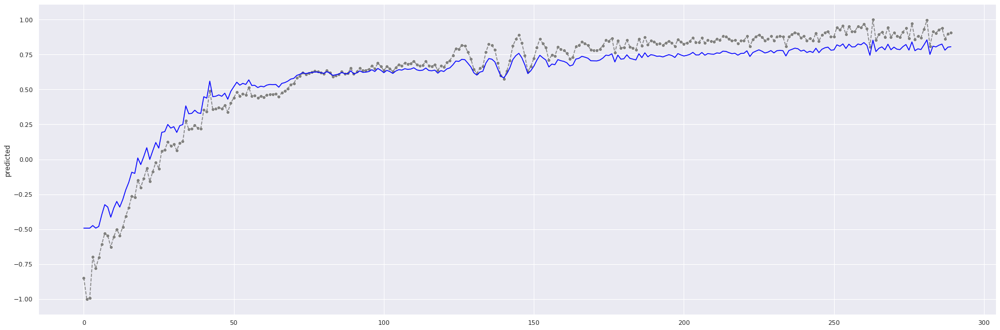

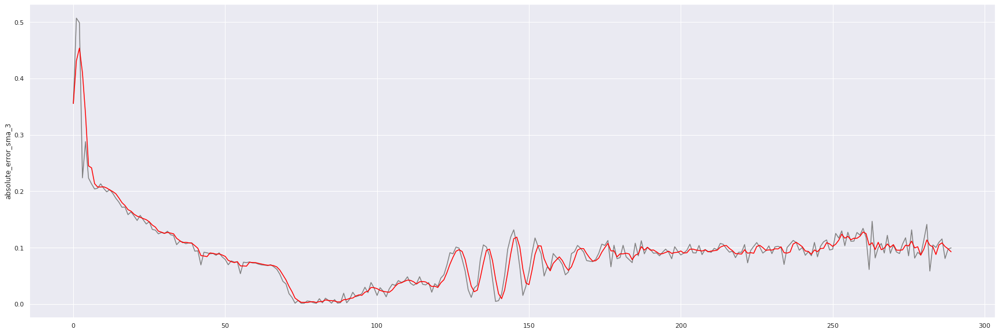


------------
../output/SatExperiment_hawaii_2012/output/mlcc__G07/residuals


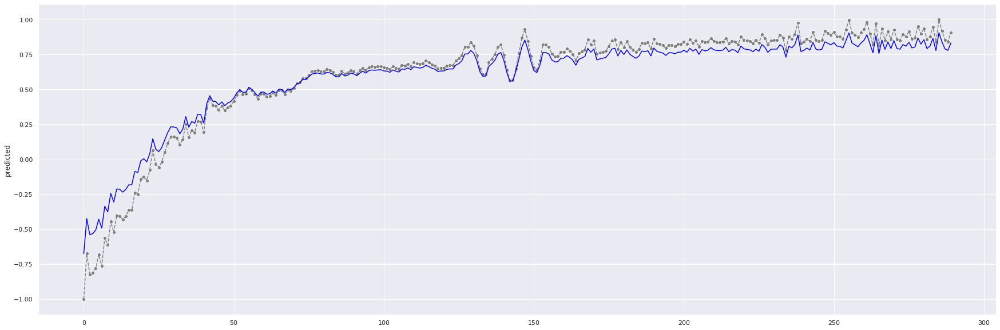

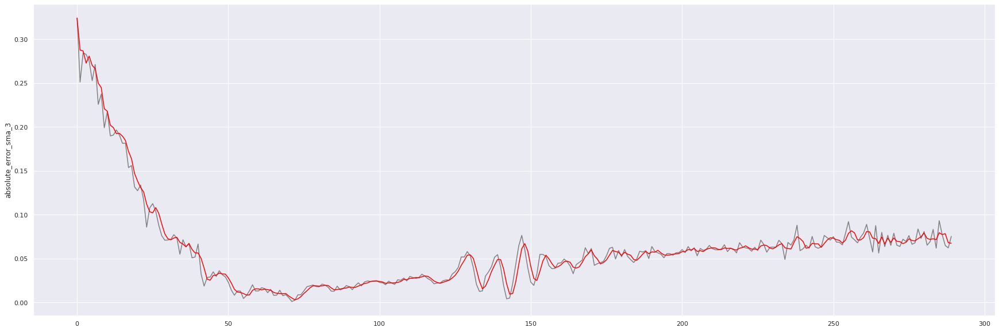


------------
../output/SatExperiment_hawaii_2012/output/mles__G07/residuals


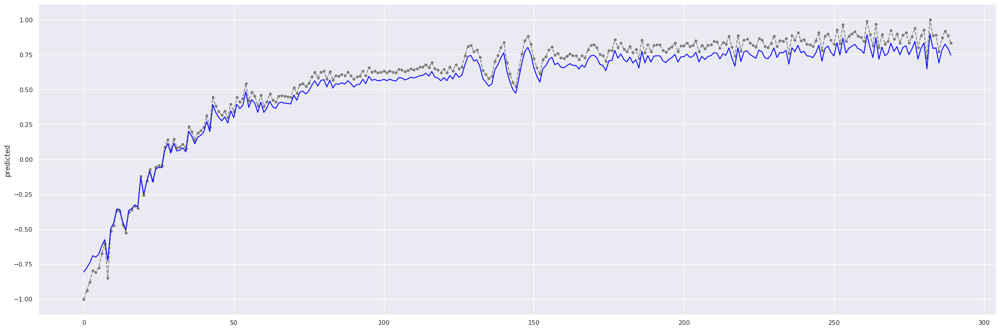

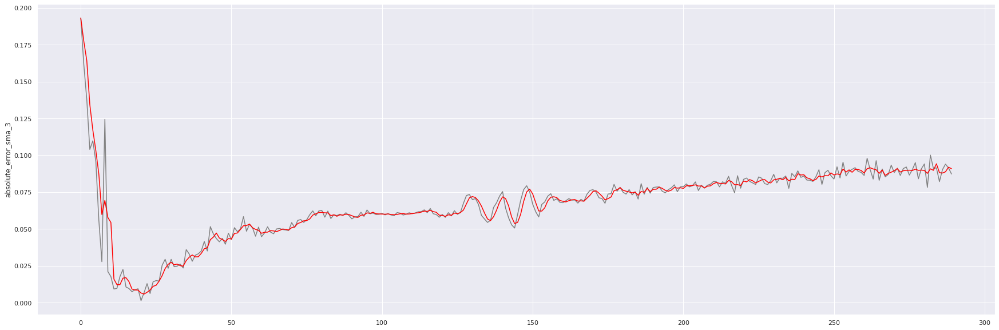


------------
../output/SatExperiment_hawaii_2012/output/mlpr__G07/residuals


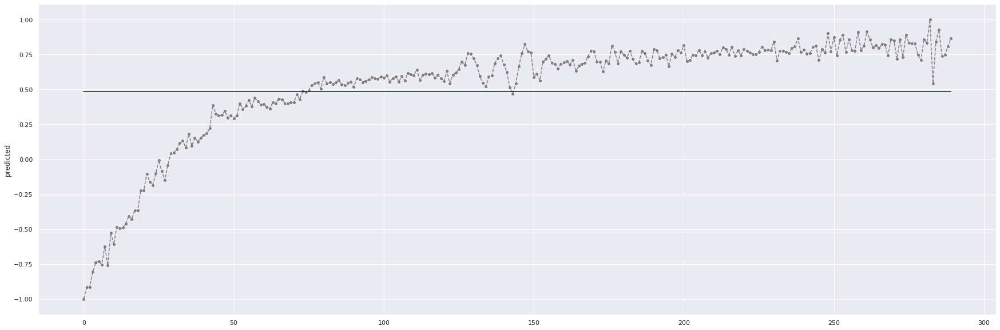

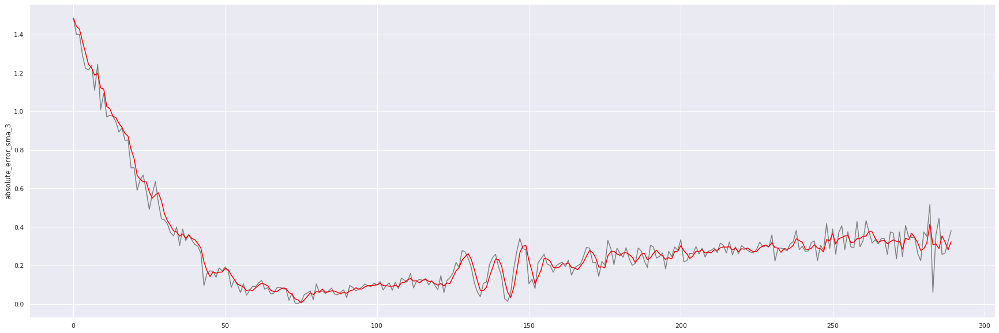


------------
../output/SatExperiment_hawaii_2012/output/mlrd__G07/residuals


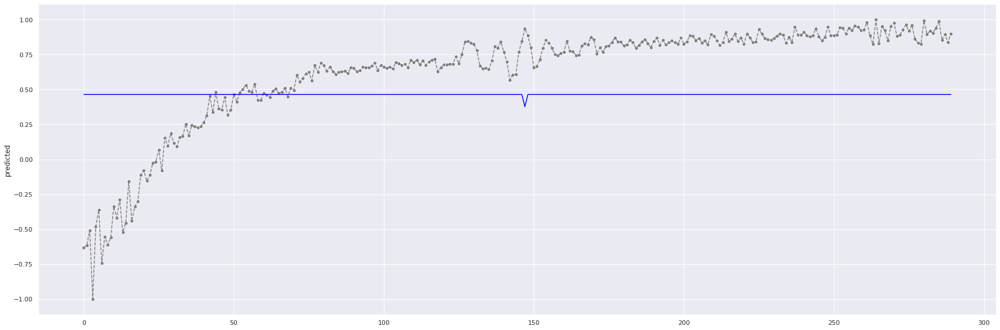

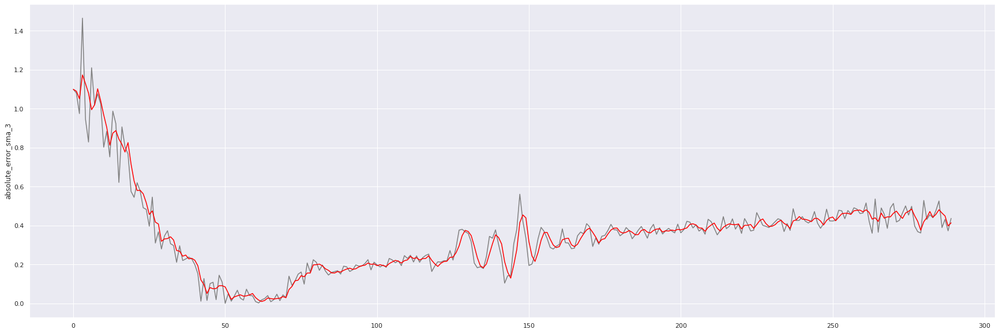


------------
../output/SatExperiment_hawaii_2012/output/mmau__G07/residuals


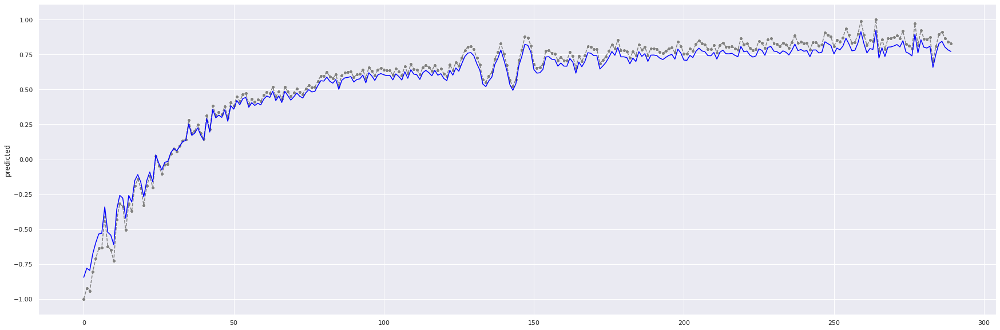

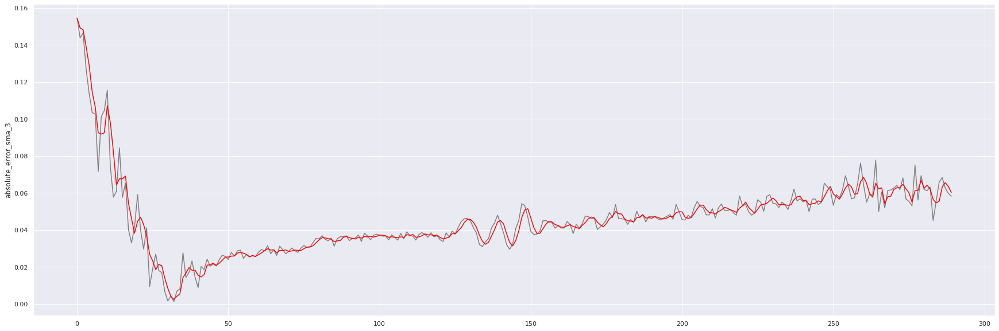


------------
../output/SatExperiment_hawaii_2012/output/mokp__G07/residuals


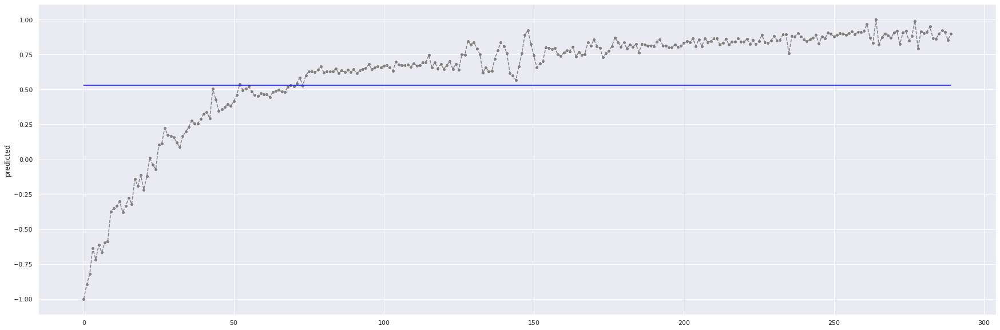

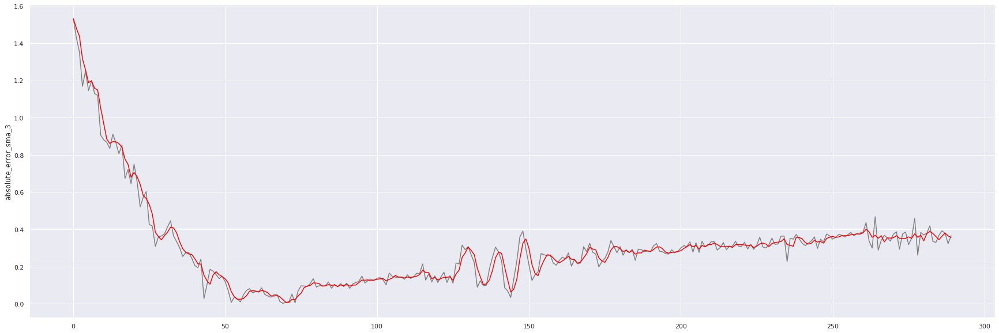


------------
../output/SatExperiment_hawaii_2012/output/npit__G07/residuals


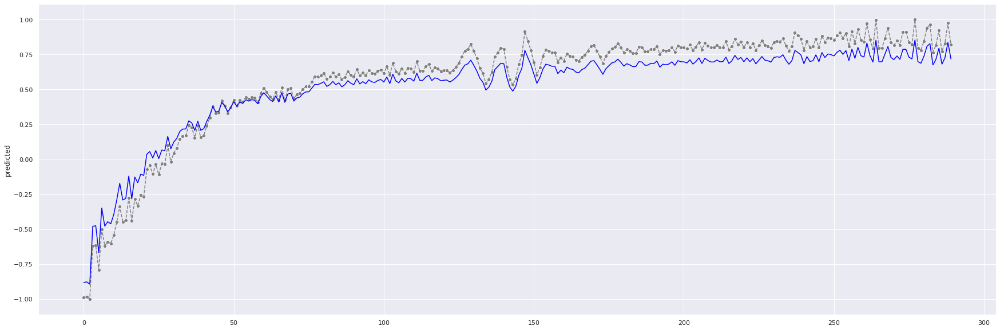

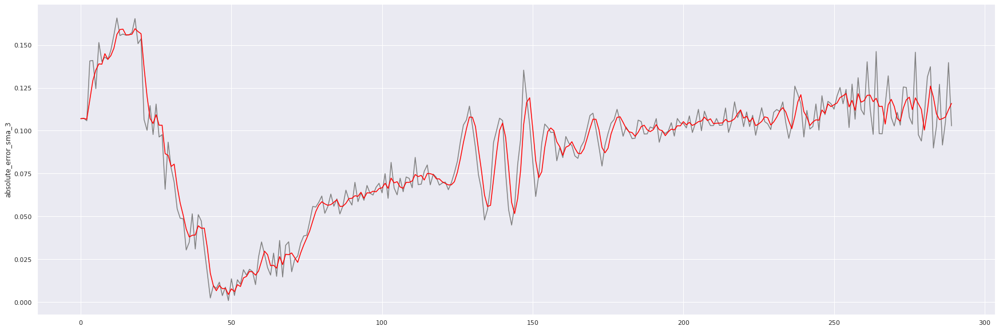


------------
../output/SatExperiment_hawaii_2012/output/npoc__G07/residuals


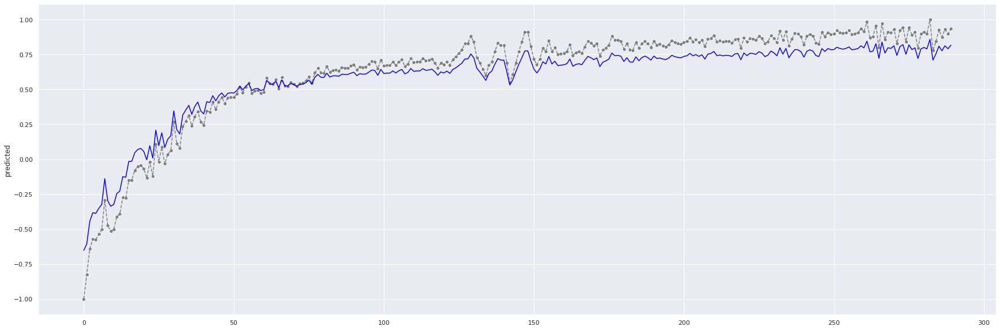

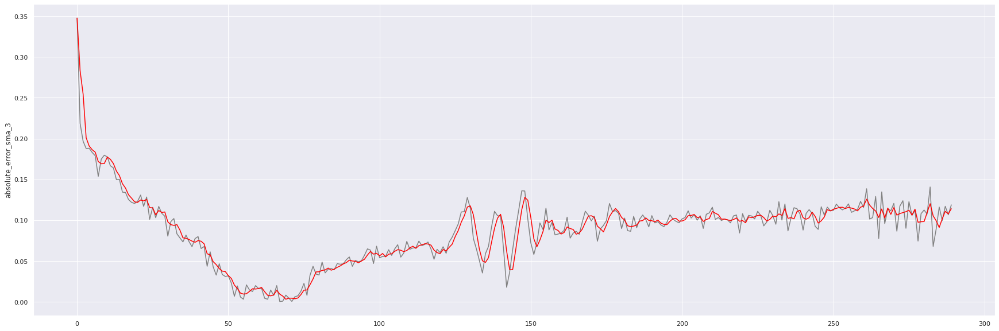


------------
../output/SatExperiment_hawaii_2012/output/nupm__G07/residuals


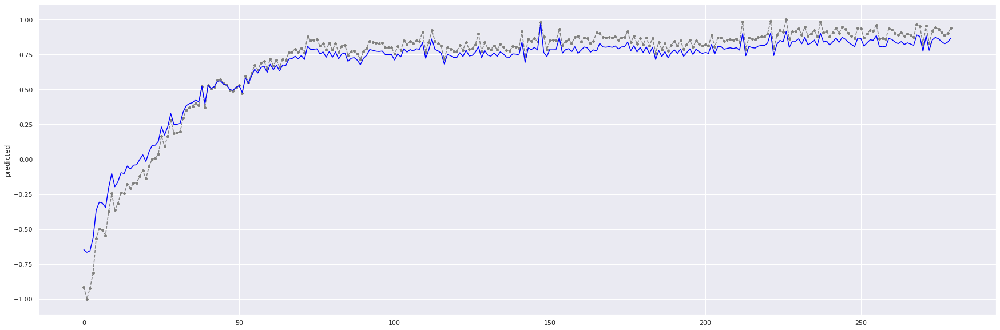

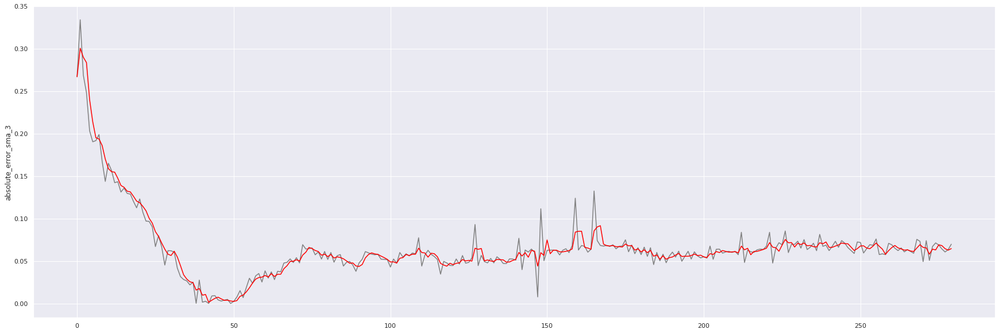


------------
../output/SatExperiment_hawaii_2012/output/okit__G07/residuals


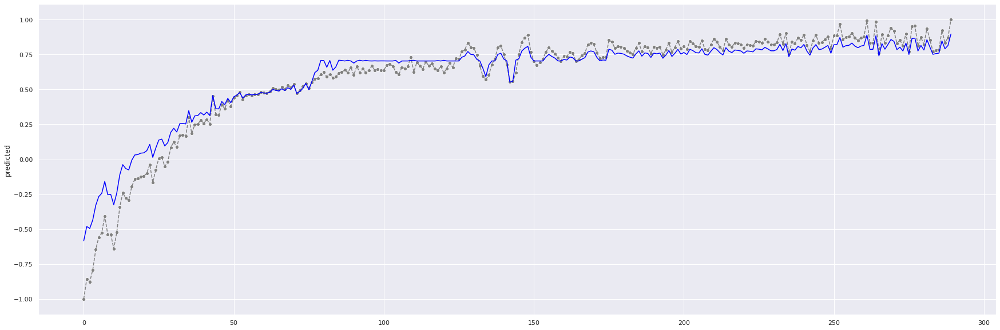

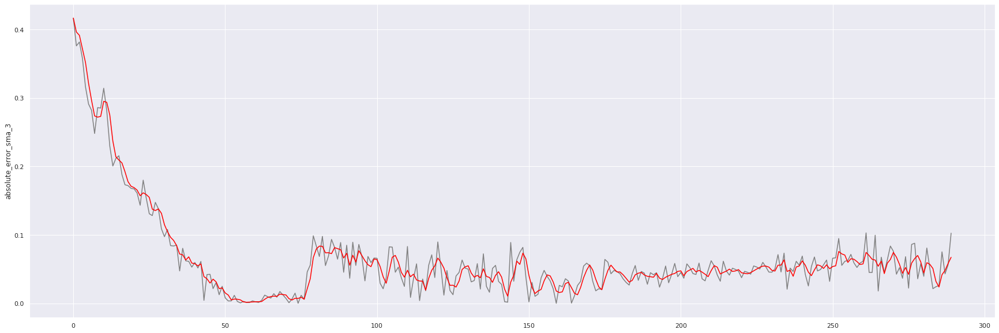


------------
../output/SatExperiment_hawaii_2012/output/outl__G07/residuals


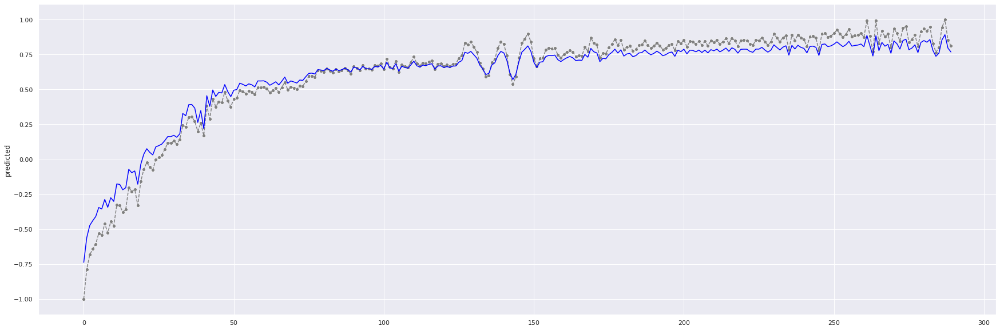

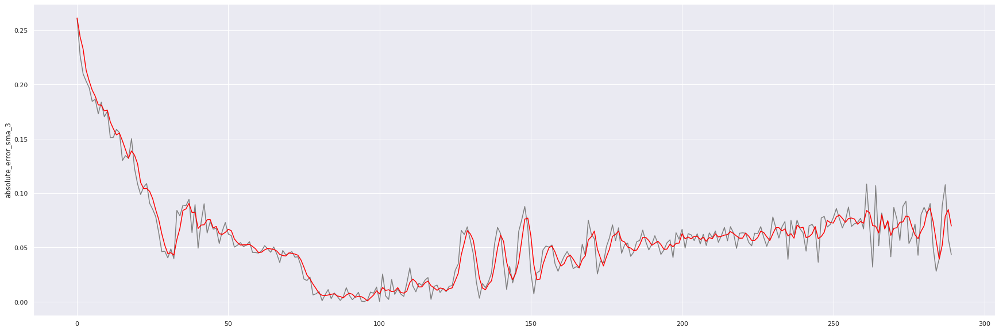


------------
../output/SatExperiment_hawaii_2012/output/pat2__G07/residuals


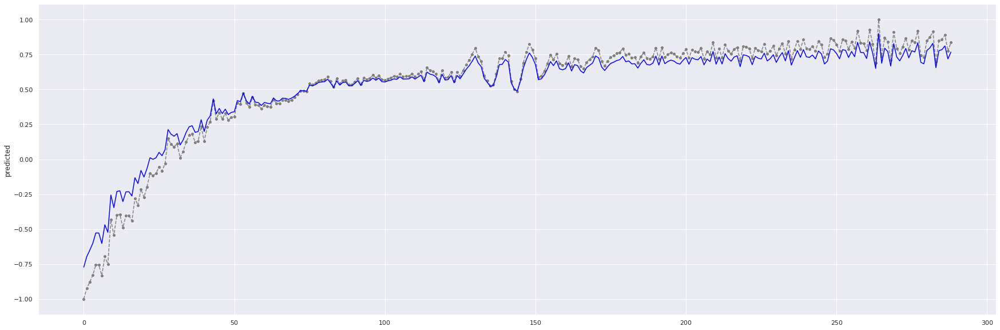

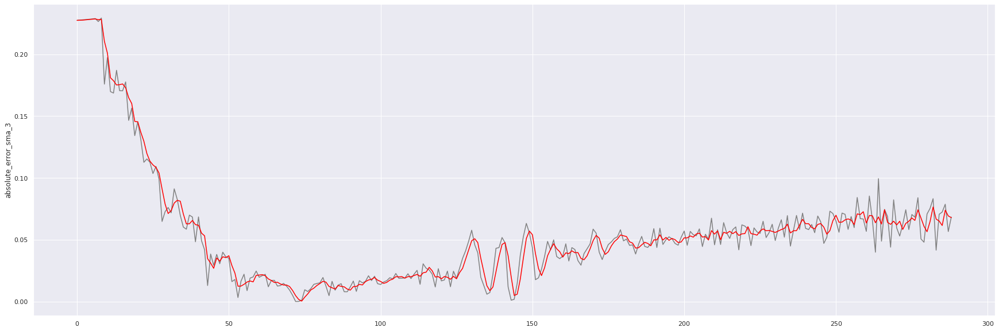


------------
../output/SatExperiment_hawaii_2012/output/pg2r__G07/residuals


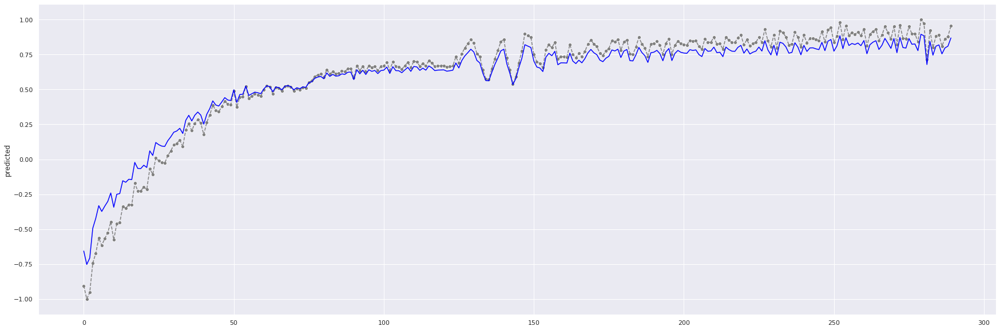

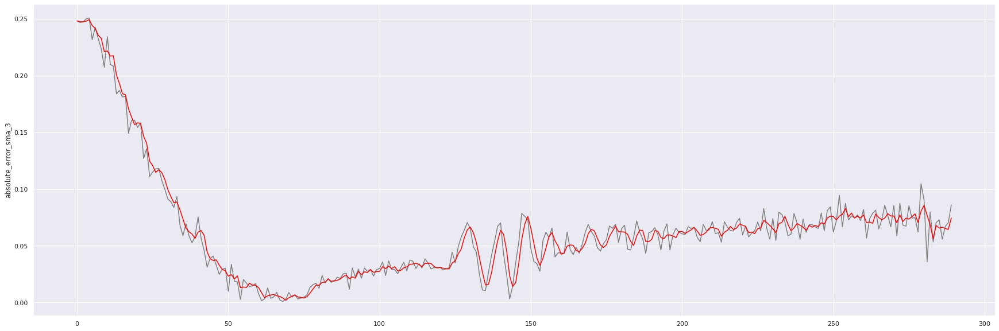


------------
../output/SatExperiment_hawaii_2012/output/pgf1__G07/residuals


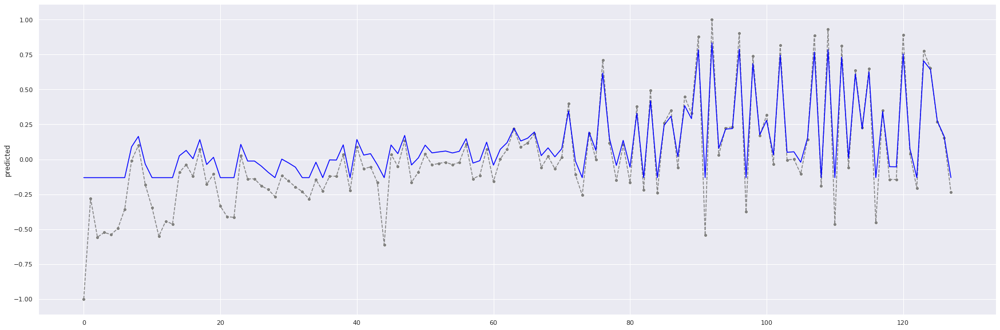

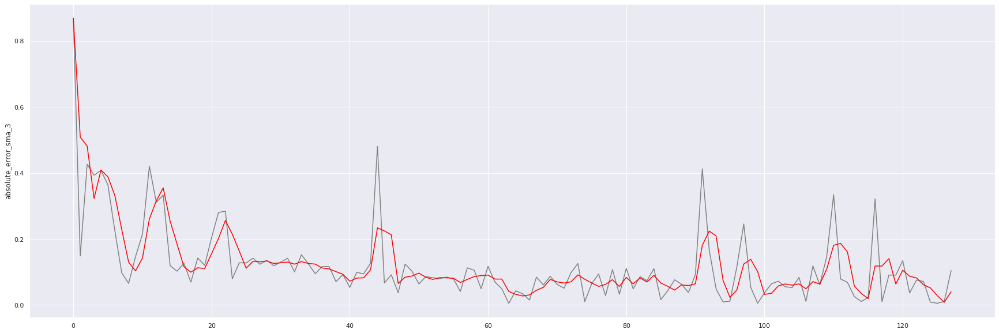


------------
../output/SatExperiment_hawaii_2012/output/pgf4__G07/residuals


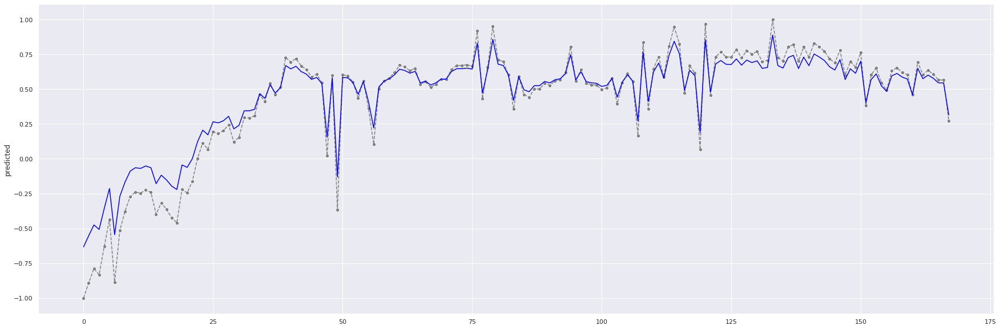

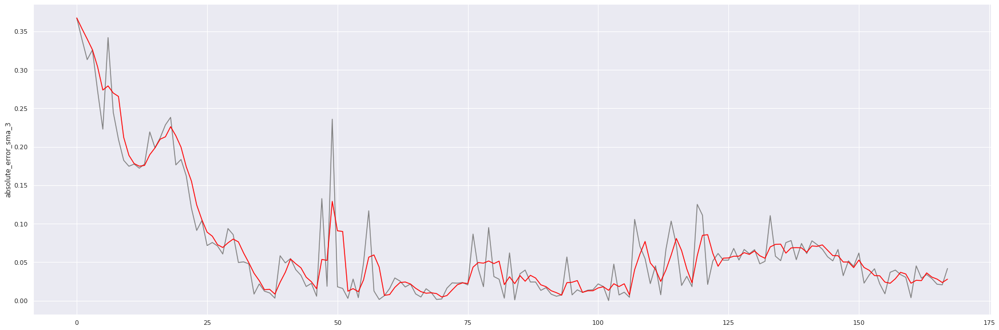


------------
../output/SatExperiment_hawaii_2012/output/pgf5__G07/residuals


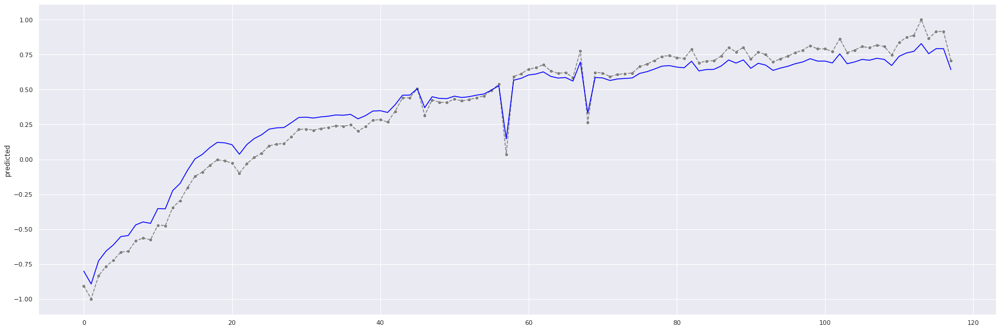

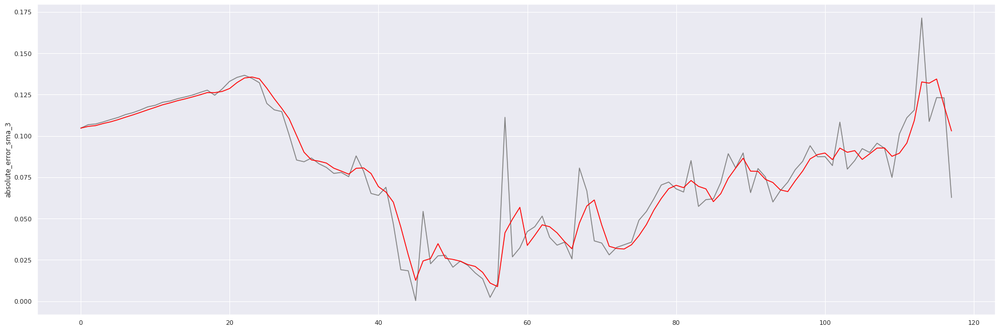


------------
../output/SatExperiment_hawaii_2012/output/pgf6__G07/residuals


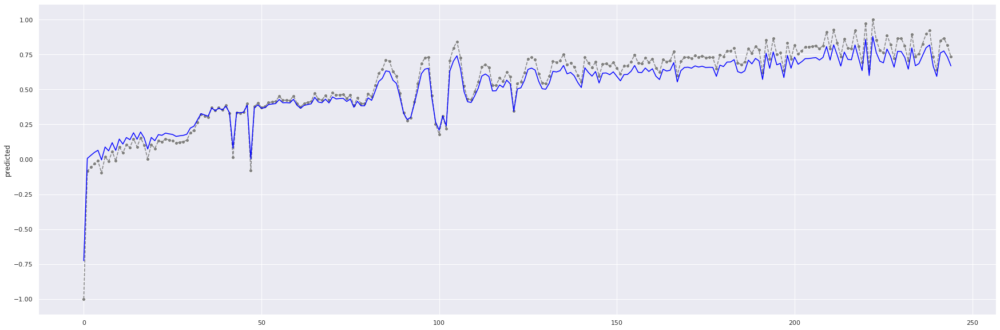

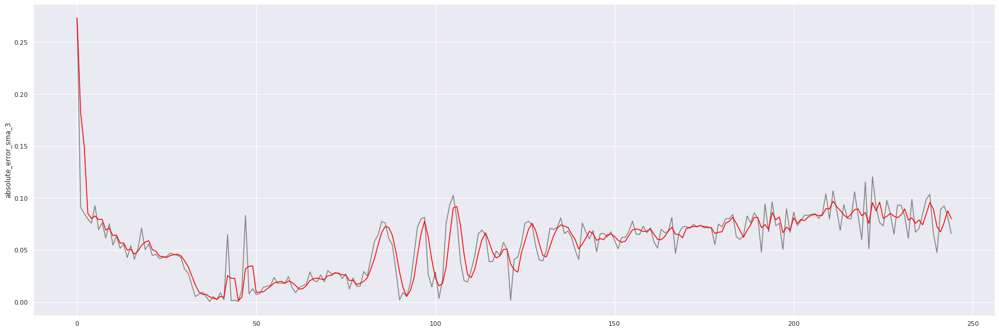


------------
../output/SatExperiment_hawaii_2012/output/phan__G07/residuals


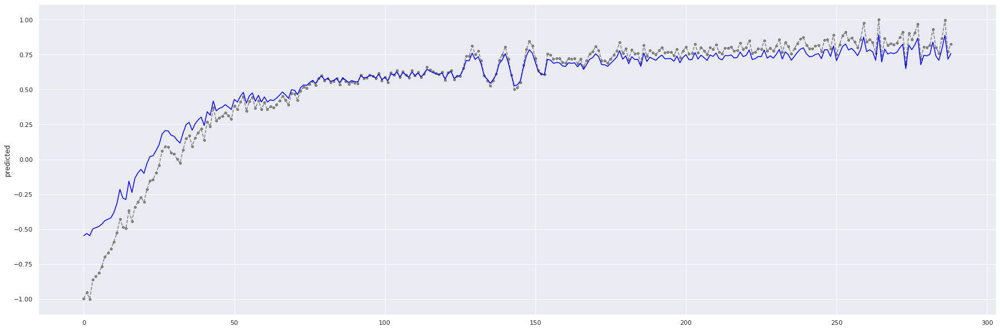

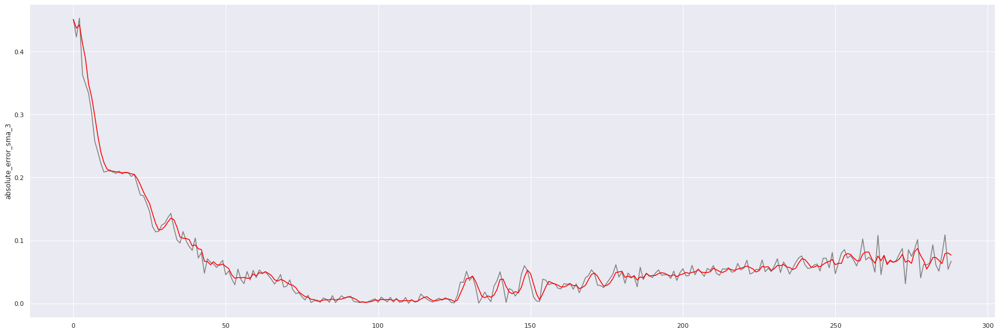


------------
../output/SatExperiment_hawaii_2012/output/piik__G07/residuals


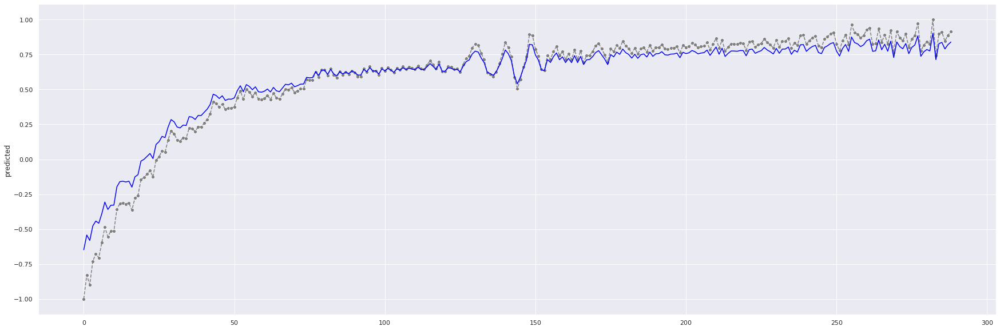

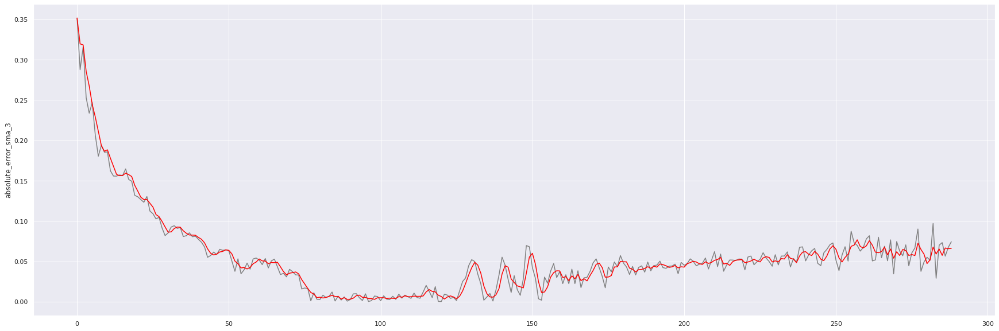


------------
../output/SatExperiment_hawaii_2012/output/pmau__G07/residuals


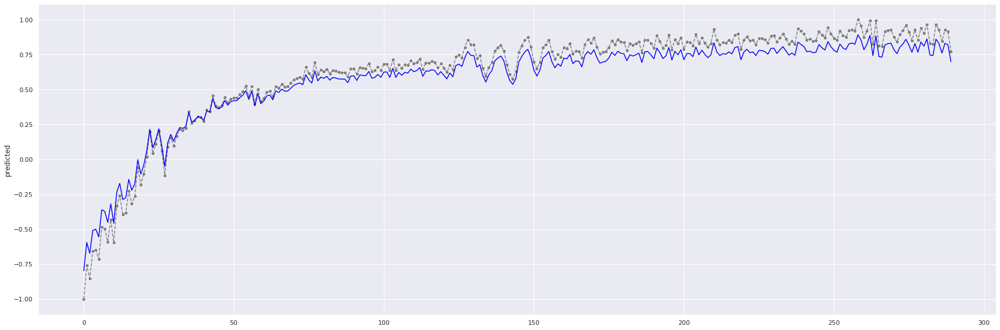

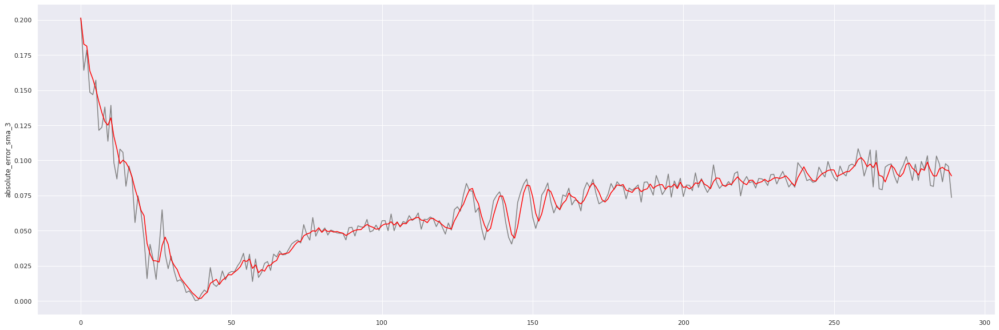


------------
../output/SatExperiment_hawaii_2012/output/puka__G07/residuals


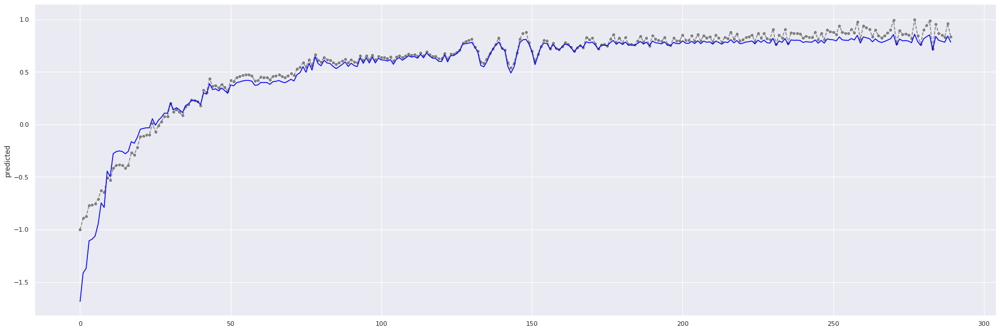

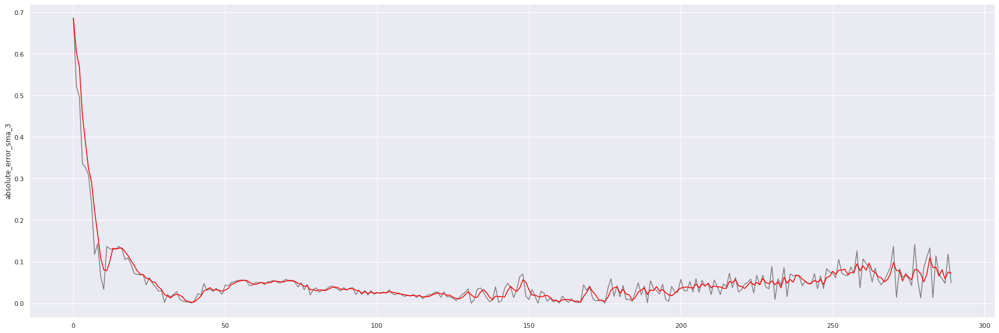


------------
../output/SatExperiment_hawaii_2012/output/puoc__G07/residuals


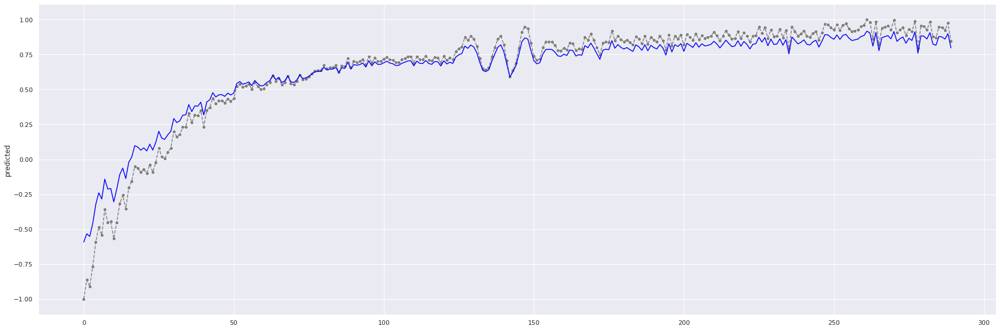

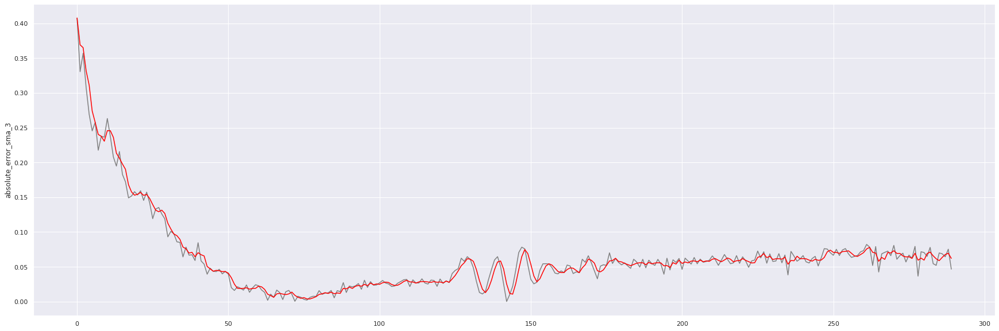


------------
../output/SatExperiment_hawaii_2012/output/radf__G07/residuals


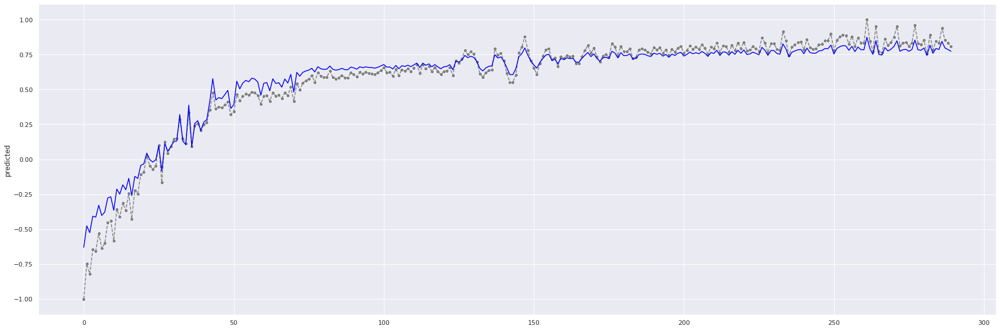

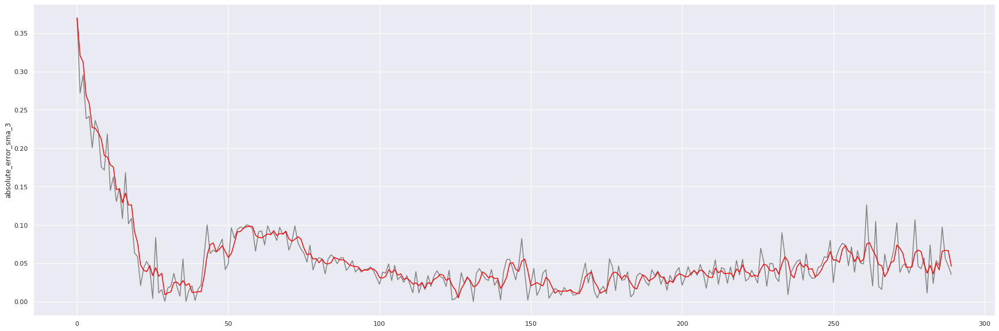


------------
../output/SatExperiment_hawaii_2012/output/slpc__G07/residuals


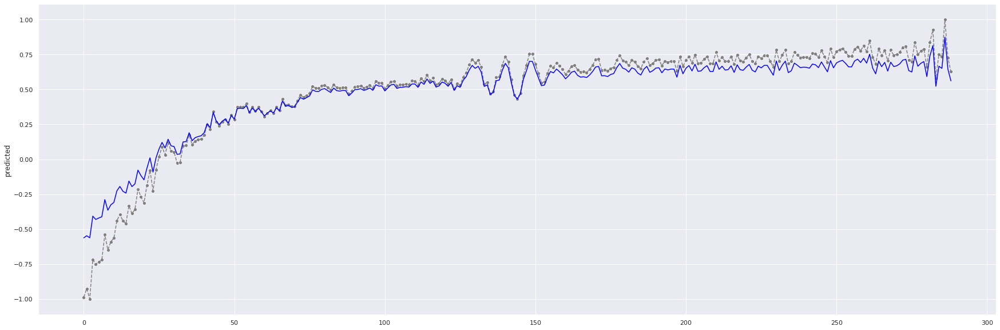

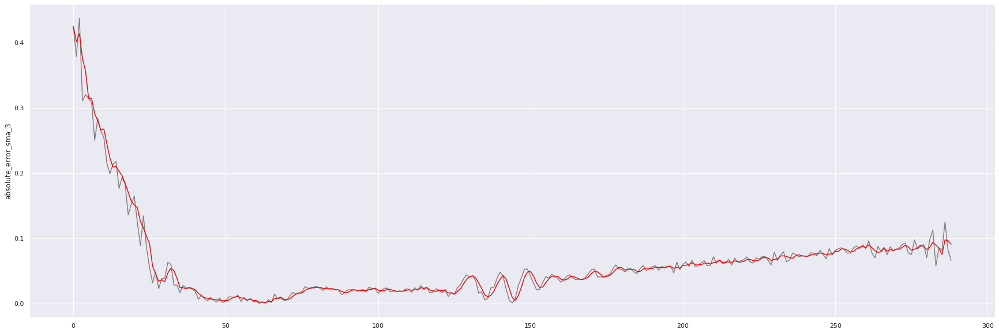


------------
../output/SatExperiment_hawaii_2012/output/step__G07/residuals


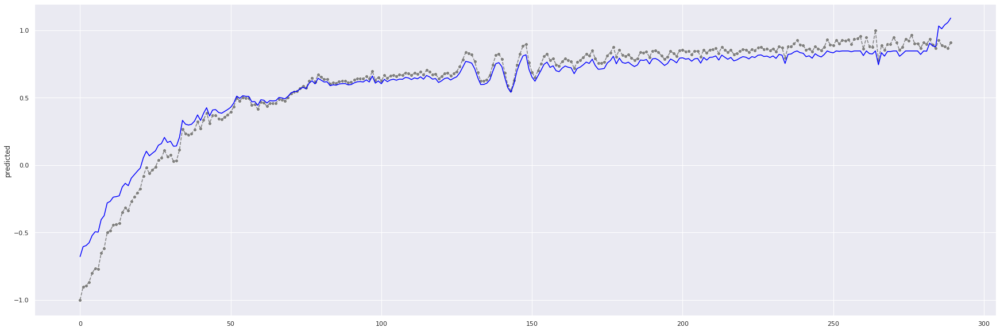

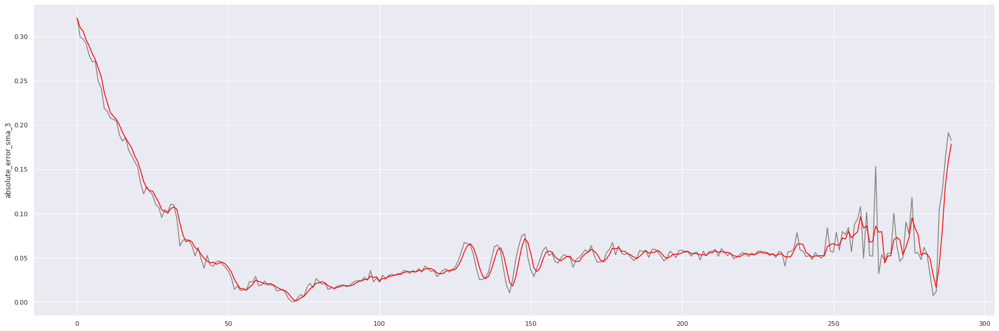


------------
../output/SatExperiment_hawaii_2012/output/touo__G07/residuals


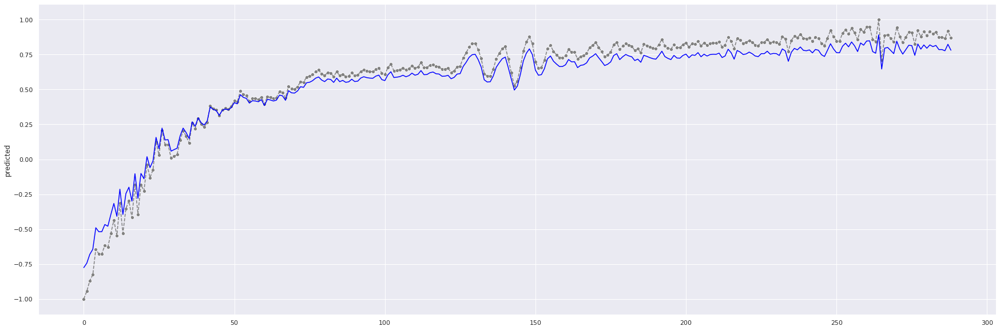

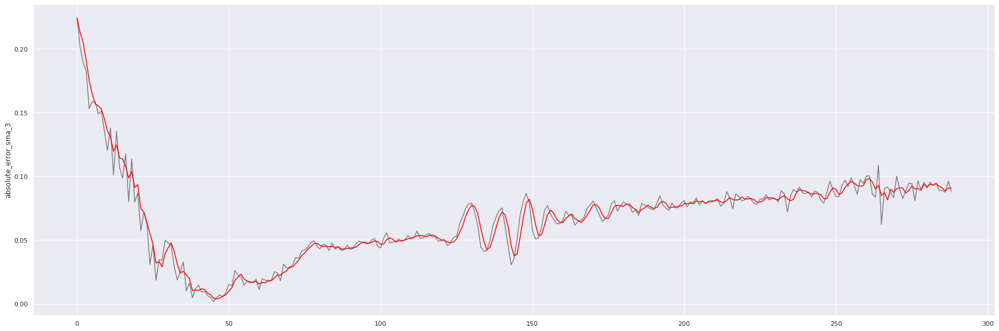


------------
../output/SatExperiment_hawaii_2012/output/uwev__G07/residuals


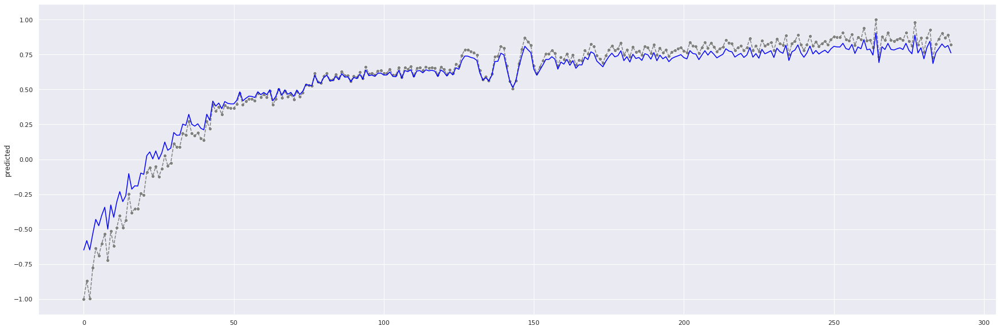

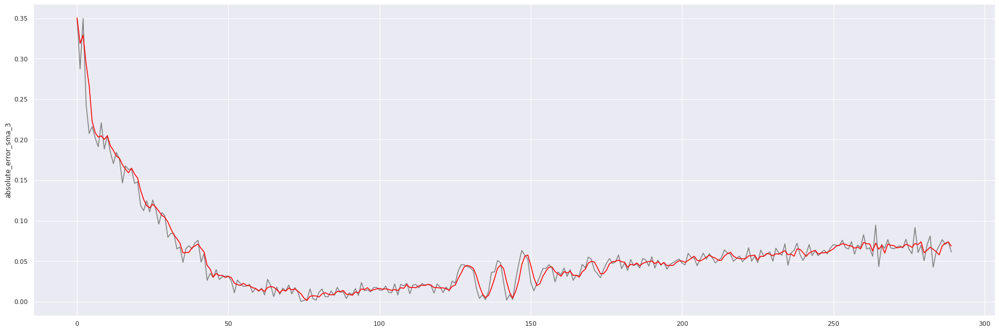


------------
../output/SatExperiment_hawaii_2012/output/waor__G07/residuals


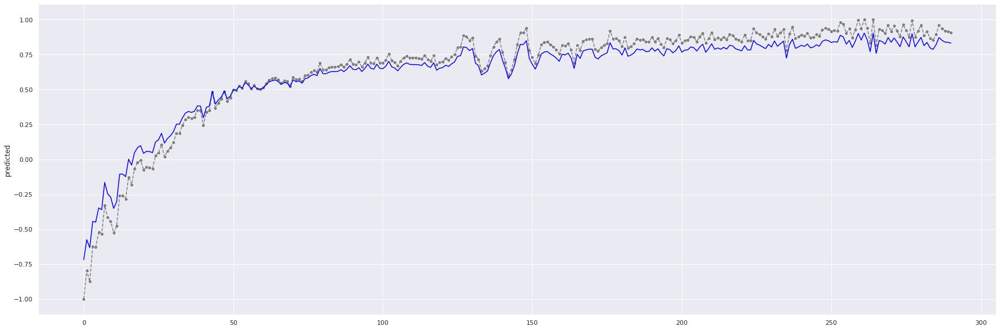

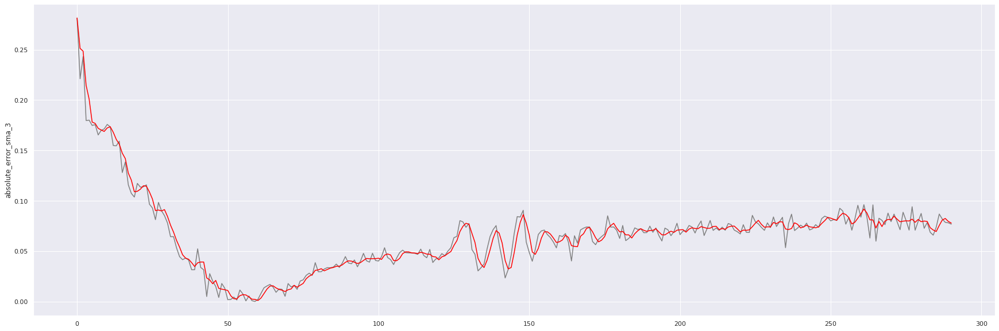


------------
../output/SatExperiment_hawaii_2012/output/yeep__G07/residuals


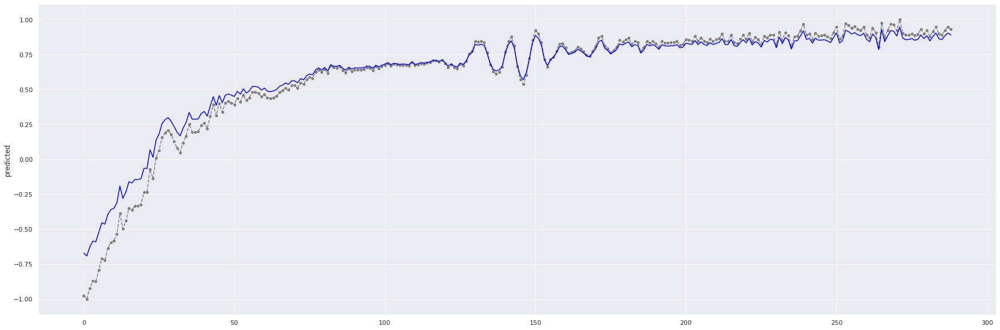

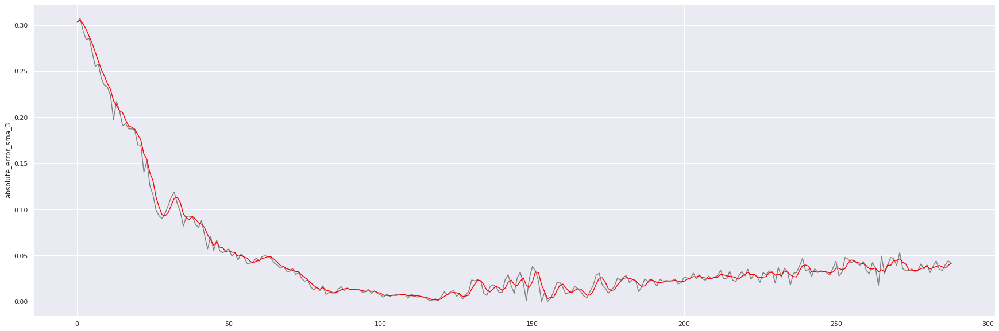

In [24]:
# let's plot all of the modeling results! 
for i in residuals: 
    
    print("\n------------")
    print(i)
    
    plot_predictions(
        dataframe=residuals[i]["valid"]
    )
    
    plot_residuals(
        dataframe=residuals[i]["valid"]
    )
    

## Classify Time Periods As Anomalous

Model performance will generally always be impacted towards the start of a period (day) due to having less available data (data less than the specified batch size) for making predictions. This impacts model performance (confidence) at the start of any period, and thus confidence in the model will be less at early stages (until about an hour of data is collected). Model performance at the start of the period is also impacted by the positioning of the satellite relative to the ground station (and its elevation). 

Once the event occurs, it seems to represent a large-enough deviation from the previous day(s) (used for model training) to result in elevated absolute errors for each prediction by the model after the change begins to occur in the the TEC variation. We can use this emperical finding to create a method for detection. 

We will not be able to do any better than an on-time detection of the event (meaning, there will be some lag between the start of the event and the detection of the event). We can score the approach and generate metrics (described further below) based on some specified threshold of acceptability of detection, e.g. 5 minutes (or something else). 

In [25]:
# definition of start times for tsunami-wave induced pertubations by satellite
# start time defined by second in day 
sod_annotations = {
    "G04": 31400,
    "G07": 31160,
    "G08": 31900,
    "G10": 29900,
    "G20": 31150
}

### Distribution of Errors 

A lot of error handling approaches and work assume that the errors have Gaussian distributions. Let's visualize the distribution of values and do a formal test for normality. If we find that the distribution of errors is generally normal, we could use approaches that are suitable for that type of data distribution. If not, we should look at other approaches for handling the model errors. 

In [26]:
def plot_error_distribution(dataframe: pd.DataFrame):
    
    # distribution of the errors
    plt.figure(figsize=(10, 10))
    sns.distplot(dataframe["absolute_error"].values, kde=True, rug=True);
    plt.show()
    

In [27]:
def plot_error_qq_plot(dataframe: pd.DataFrame):
    
    """
    Provide a visual indication as to the normality of the data. If the points 
    closely follow the diagonal line, then they closely fit the pattern we would 
    expect from a Gaussian distribution. 
    """
    
    qq = stats.probplot(dataframe["absolute_error"].values, dist='lognorm', sparams=(1))
    x = np.array([qq[0][0][0], qq[0][0][-1]])

    fig = go.Figure()
    fig.add_scatter(x=qq[0][0], y=qq[0][1], mode='markers')
    fig.add_scatter(x=x, y=qq[1][1] + qq[1][0]*x, mode='lines')
    fig.layout.update(showlegend=False)
    fig.show()
    

In [28]:
def plot_normality(residual_dict: dict) -> None:
    
    """
    Plots a series of visualizations to help determine whether the absolute errors 
    from the trained models follow a normal distribution. 
    """
    
    # process each result from the modeling process
    for residual in residual_dict:
        
        # TODO: replace with regular expression that finds the pattern with __ between two /
        station_sat = residual.split("/")[4]
        
        for k in residual_dict[residual].keys():
            
            print("\n----- " + station_sat + " " + k + " -----")
            
            plot_error_distribution(residual_dict[residual][k])
            
            plot_error_qq_plot(residual_dict[residual][k])
            
            
        
    
    


----- ahup__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



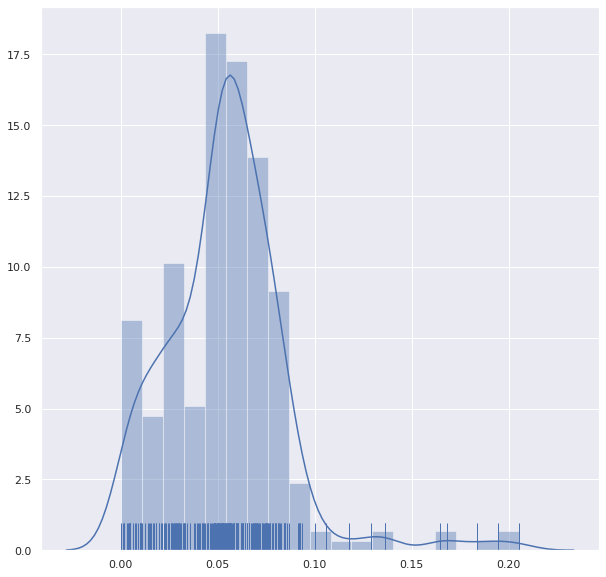


----- ahup__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



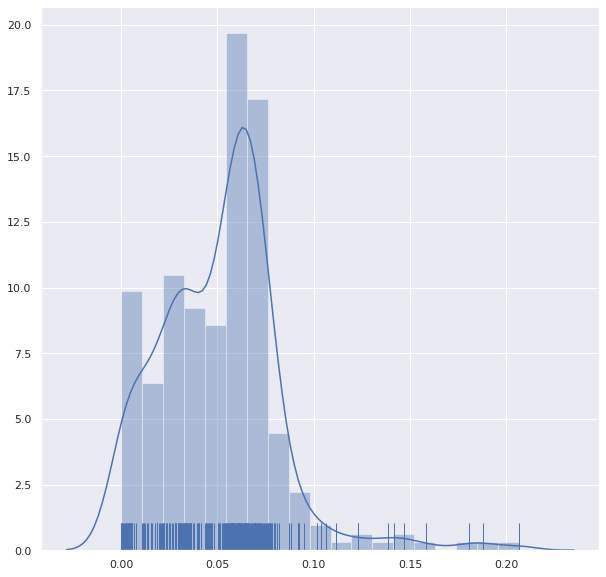


----- ainp__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



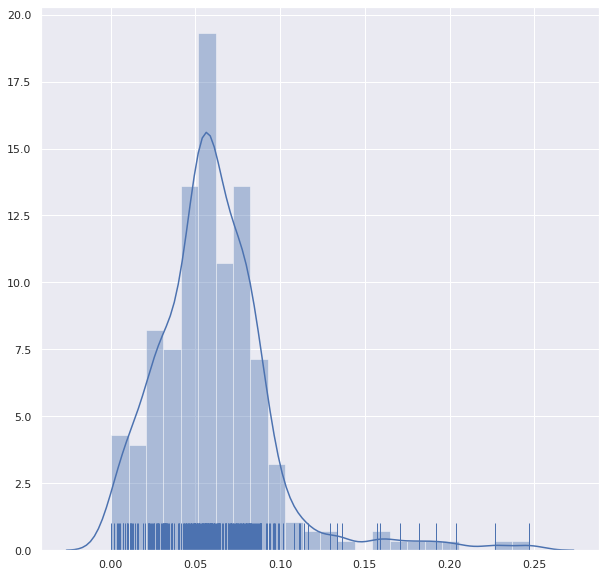


----- ainp__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



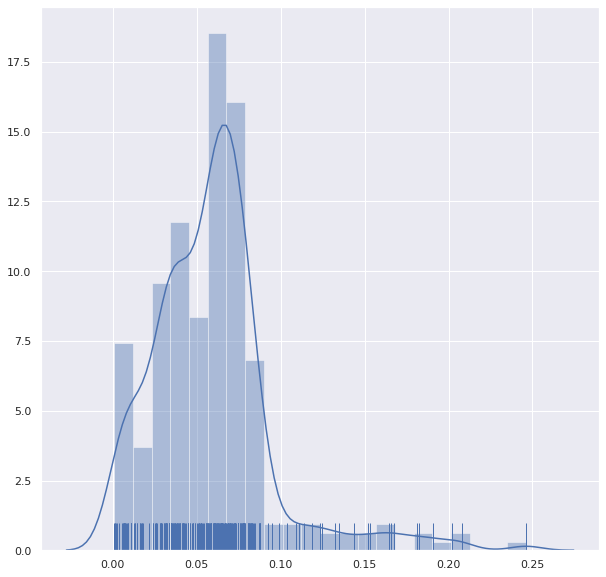


----- alal__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



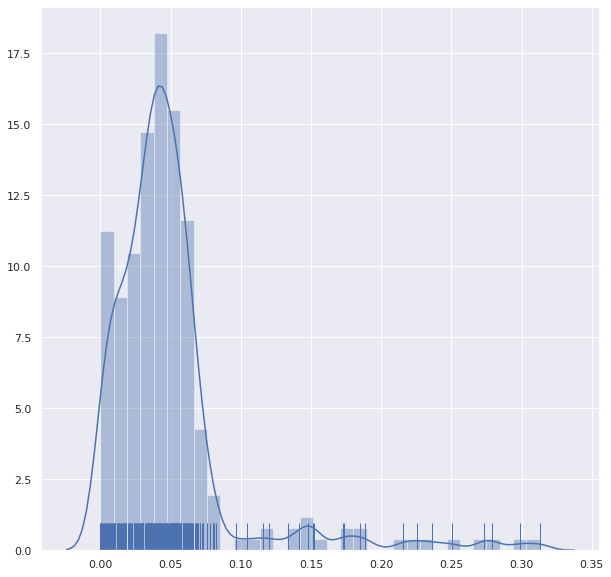


----- alal__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



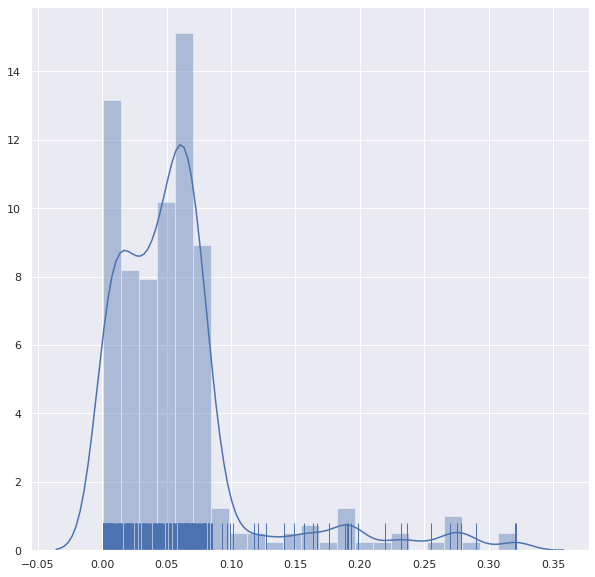


----- alep__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



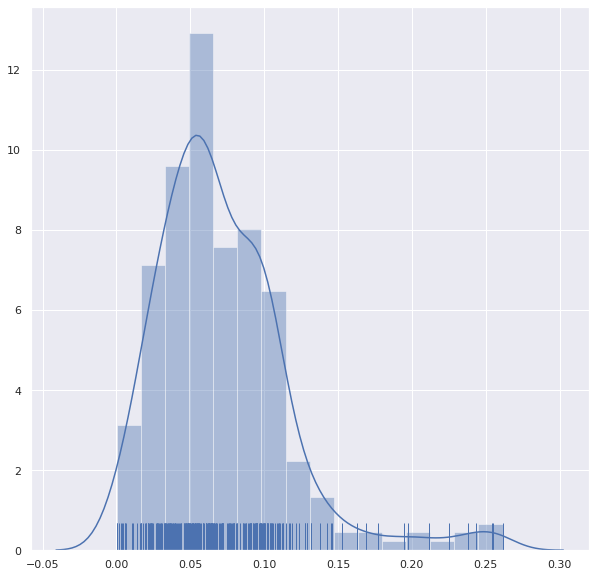


----- alep__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



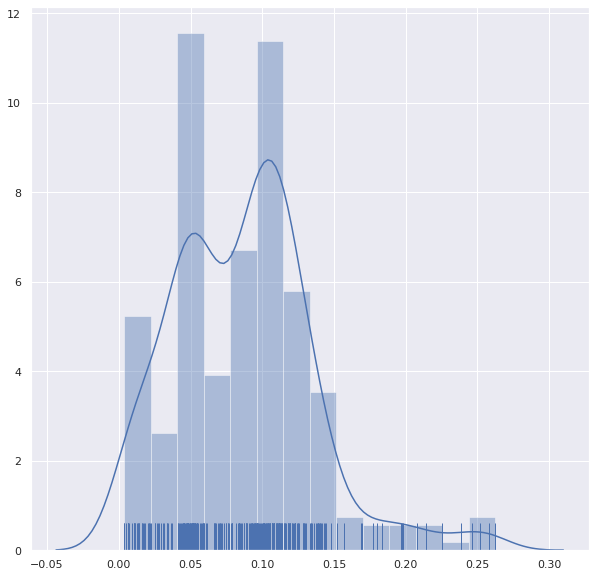


----- blbp__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



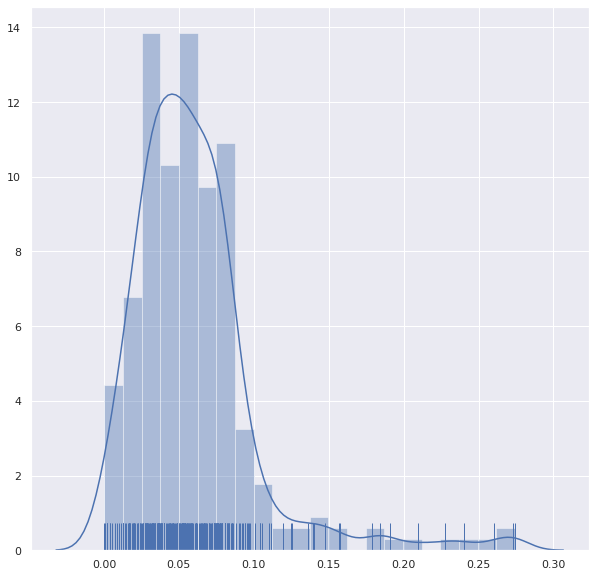


----- blbp__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



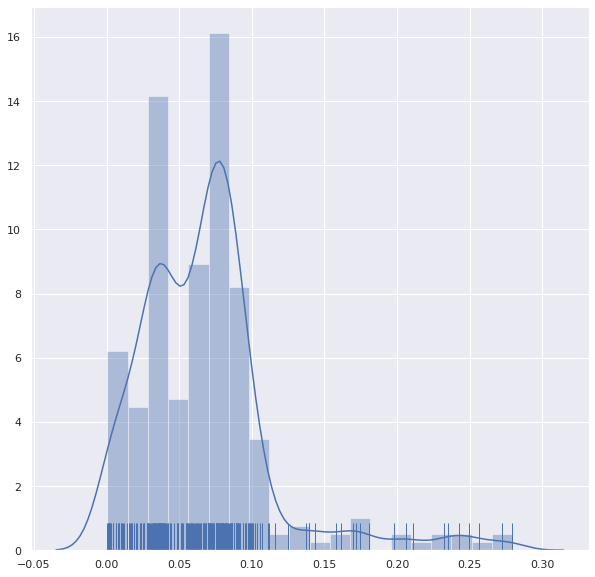


----- byrl__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



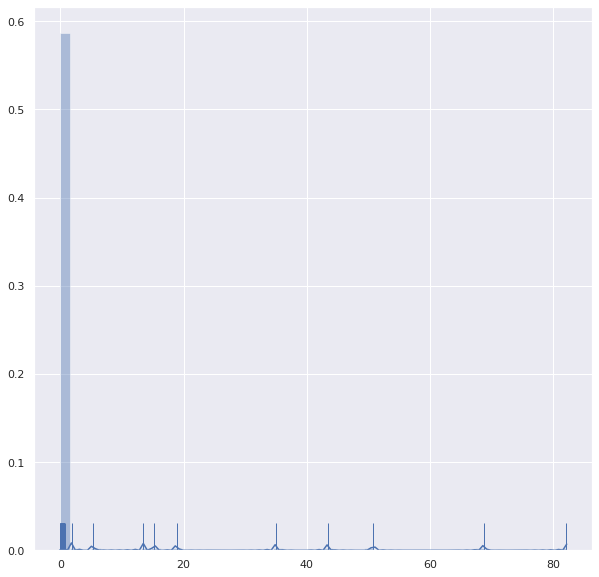


----- byrl__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



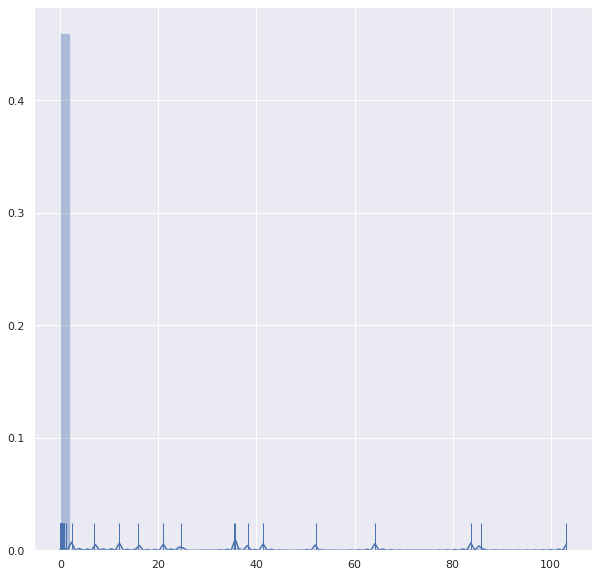


----- cnpk__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



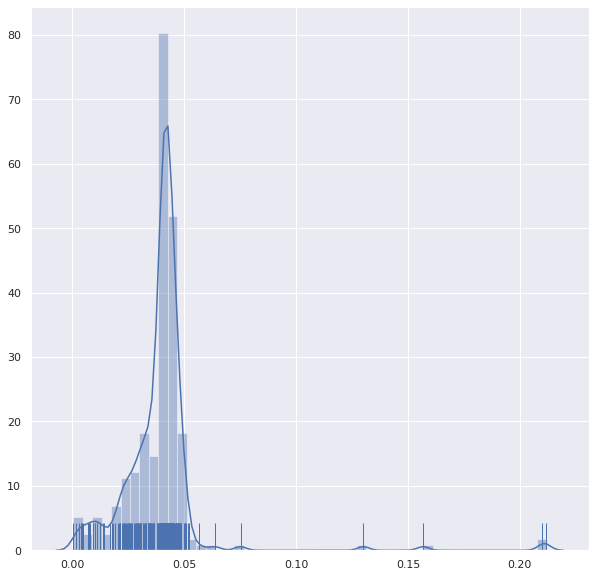


----- cnpk__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



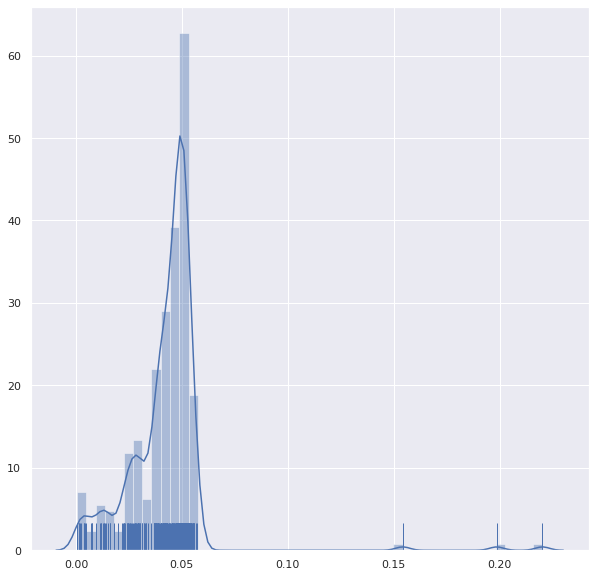


----- crim__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



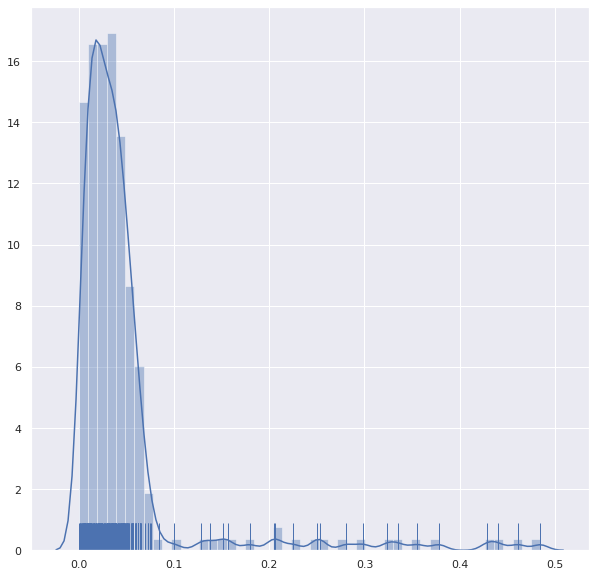


----- crim__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



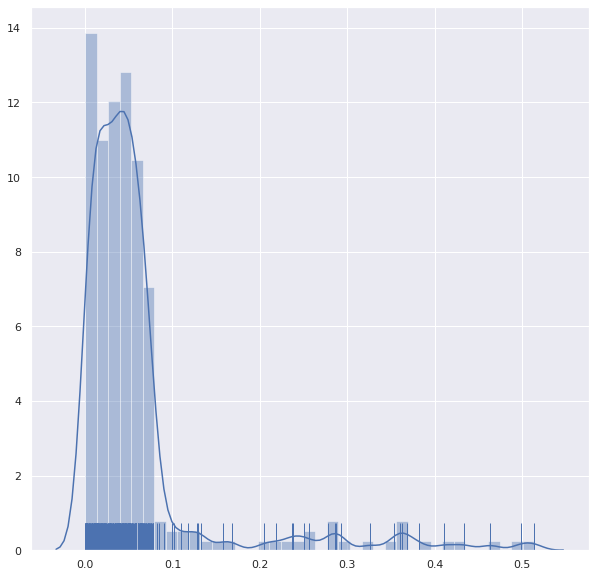


----- gopm__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



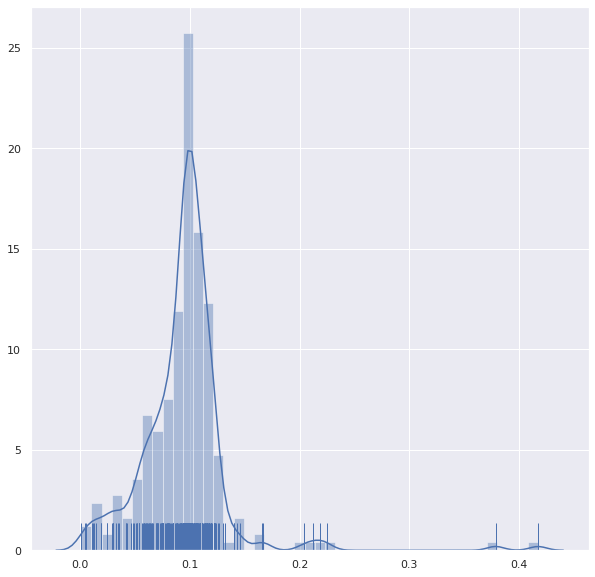


----- gopm__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



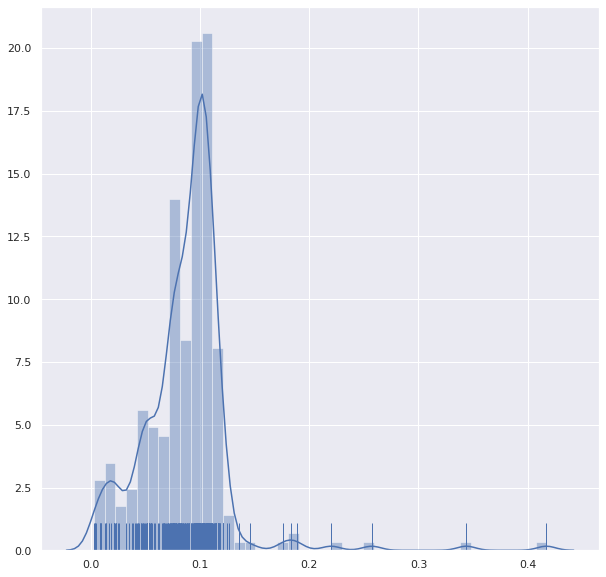


----- jcuz__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



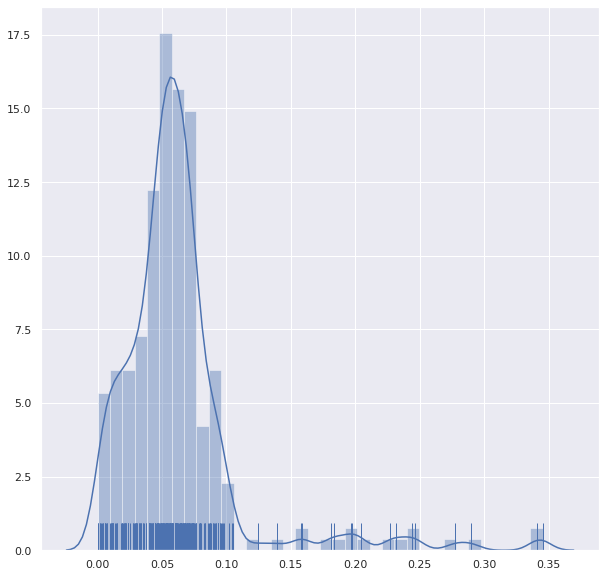


----- jcuz__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



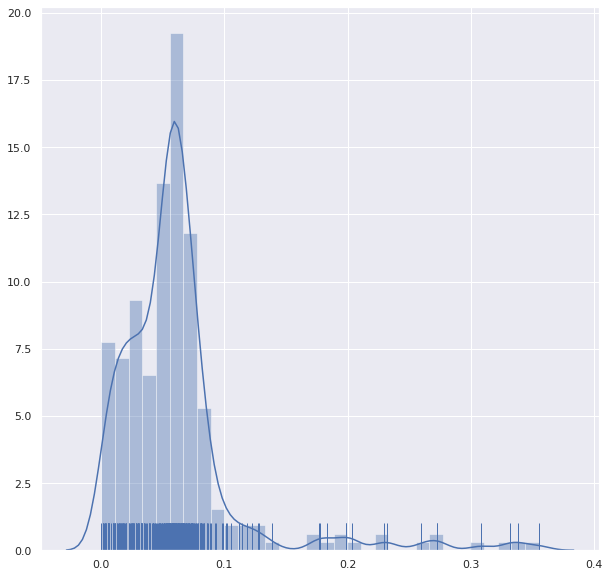


----- joka__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



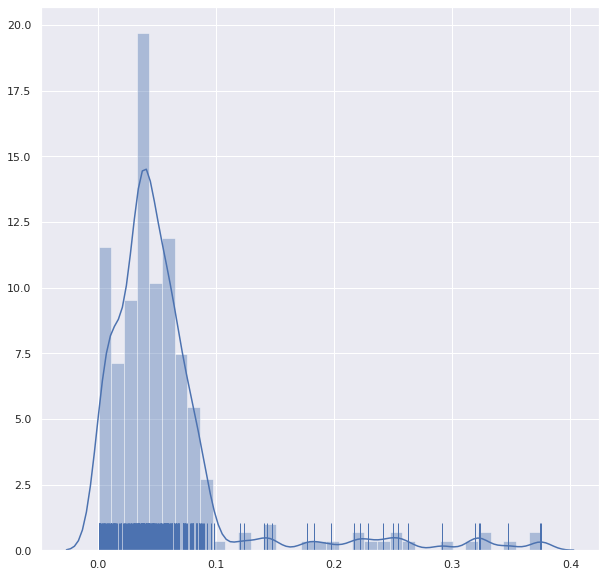


----- joka__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



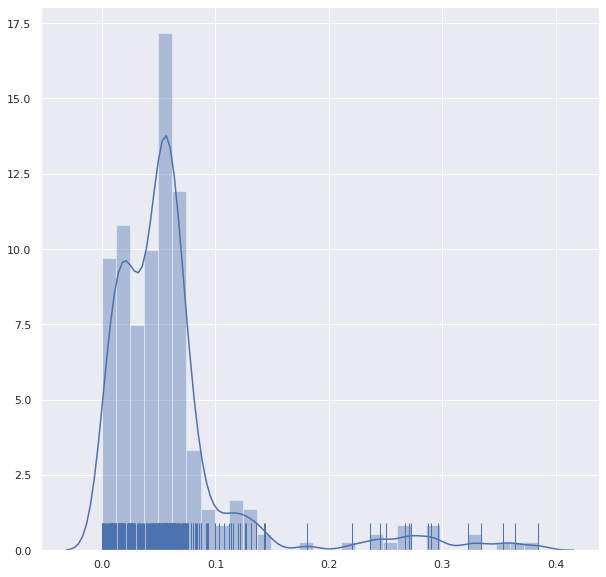


----- kaep__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



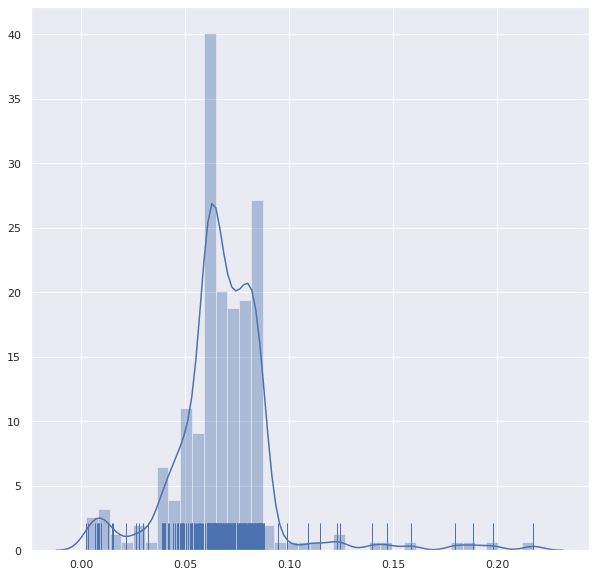


----- kaep__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



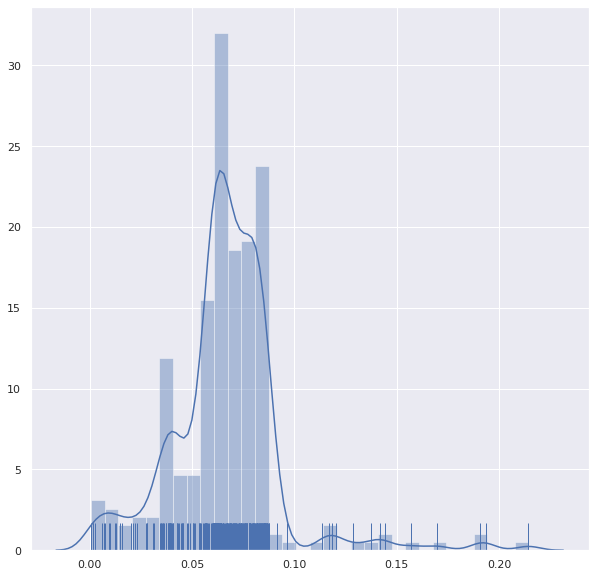


----- kamo__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



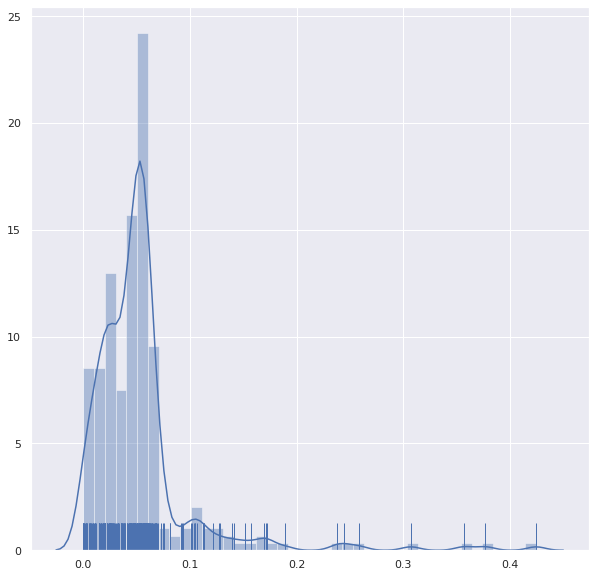


----- kamo__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



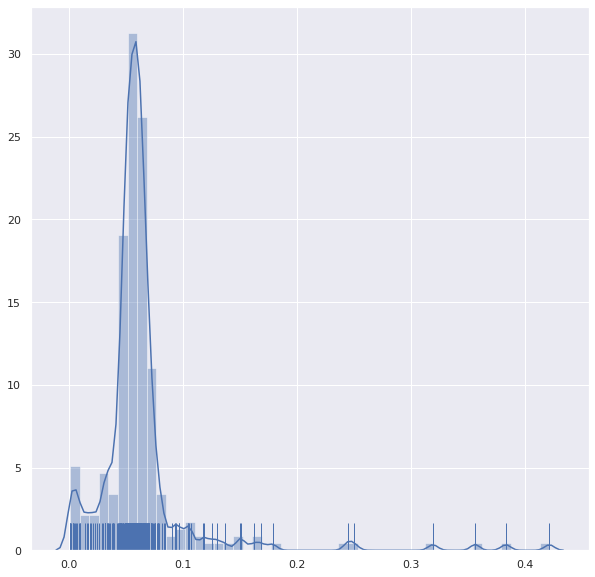


----- kfap__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



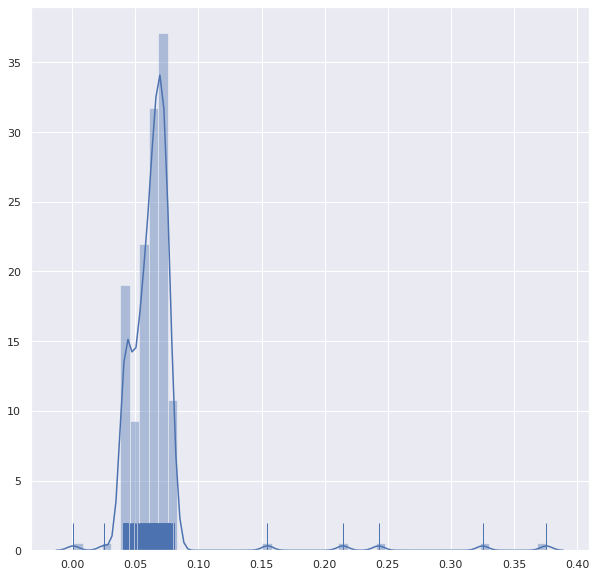


----- kfap__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



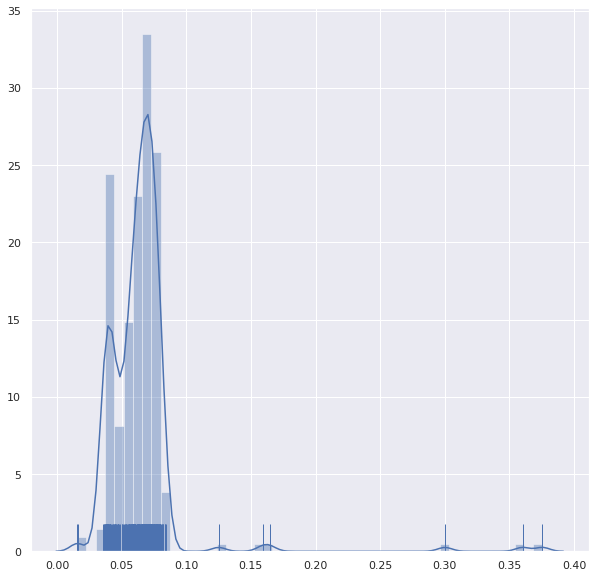


----- khku__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



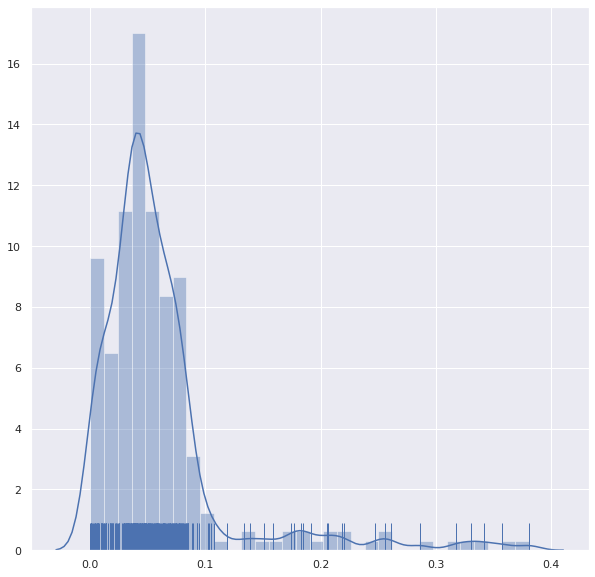


----- khku__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



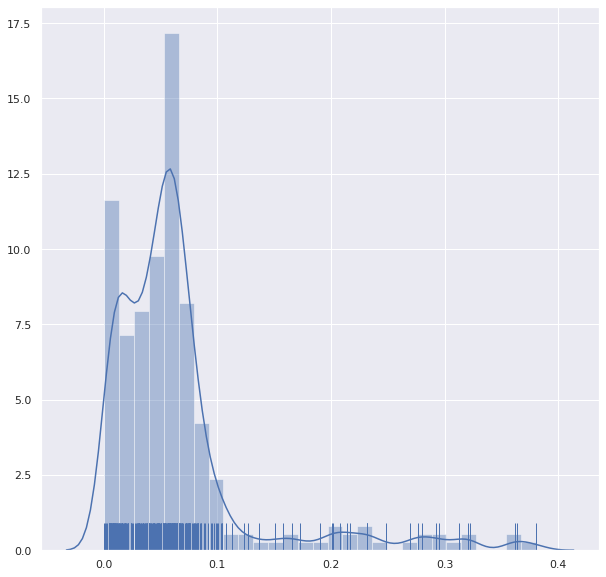


----- knne__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



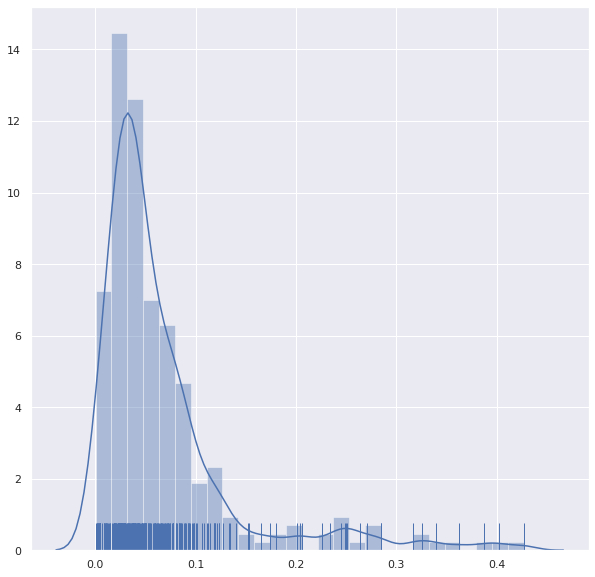


----- knne__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



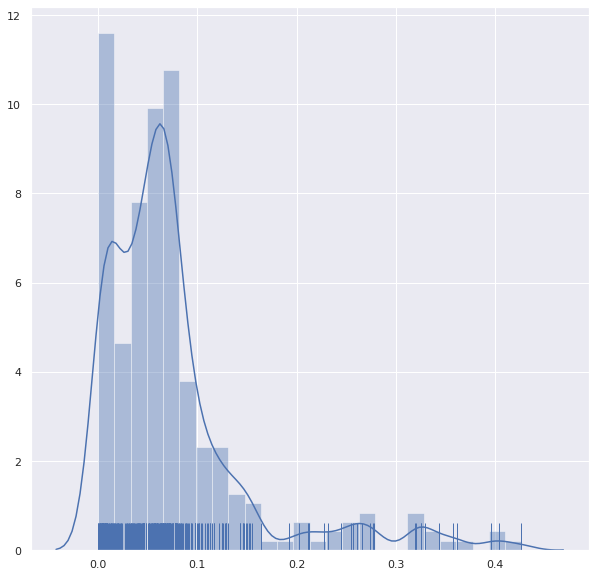


----- kosm__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



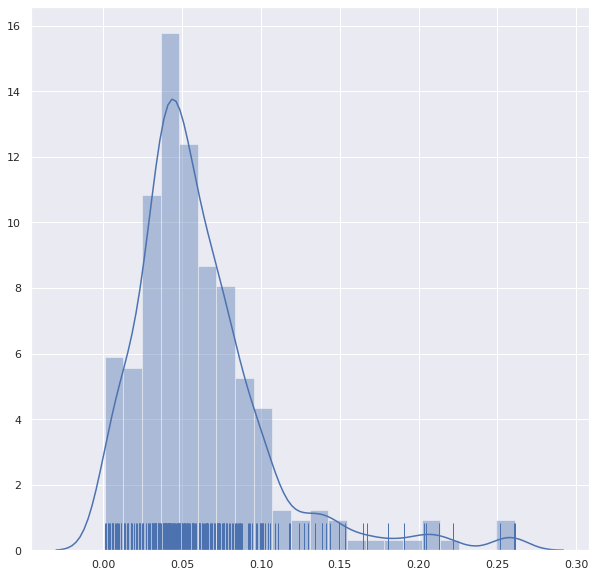


----- kosm__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



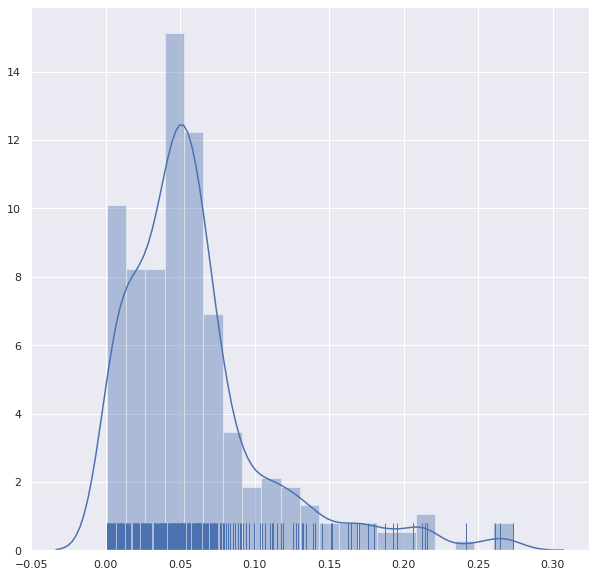


----- ktpm__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



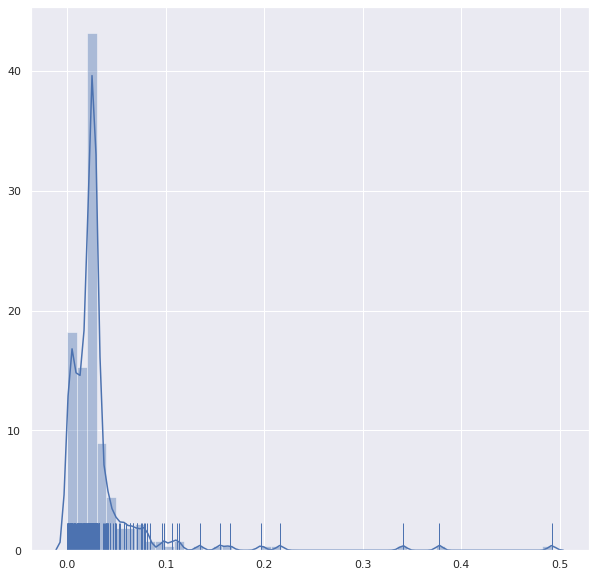


----- ktpm__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



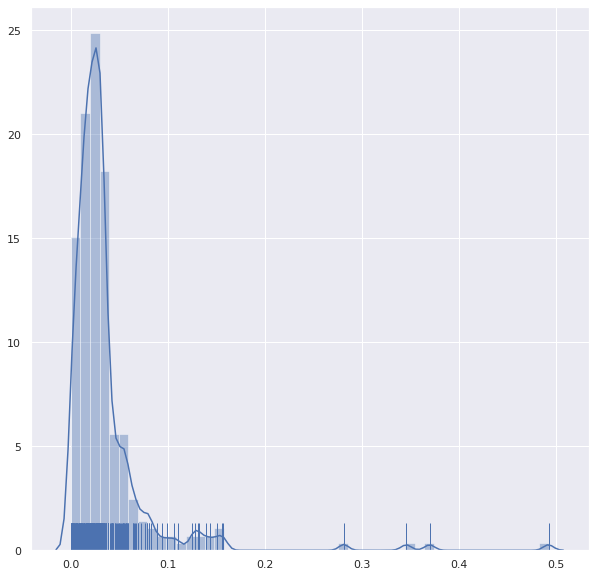


----- leia__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



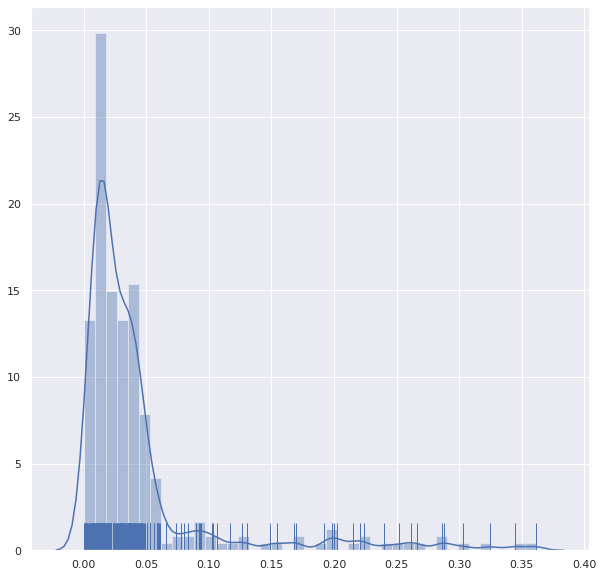


----- leia__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



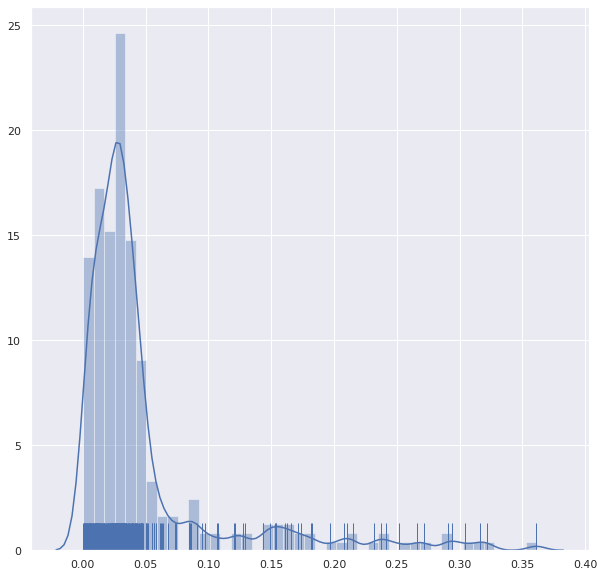


----- mane__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



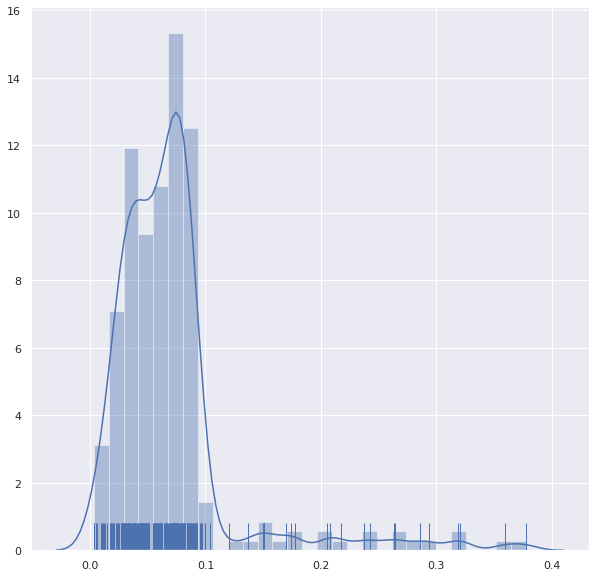


----- mane__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



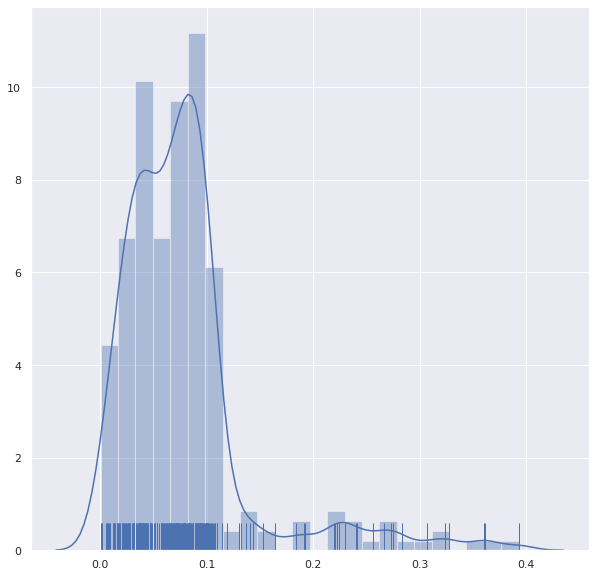


----- mkai__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



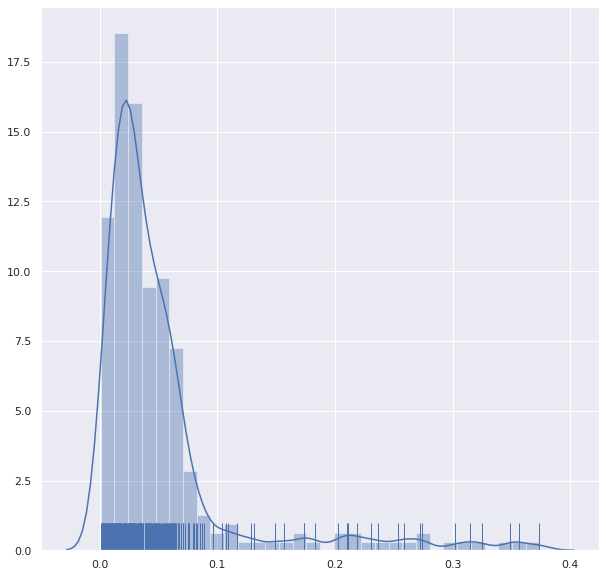


----- mkai__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



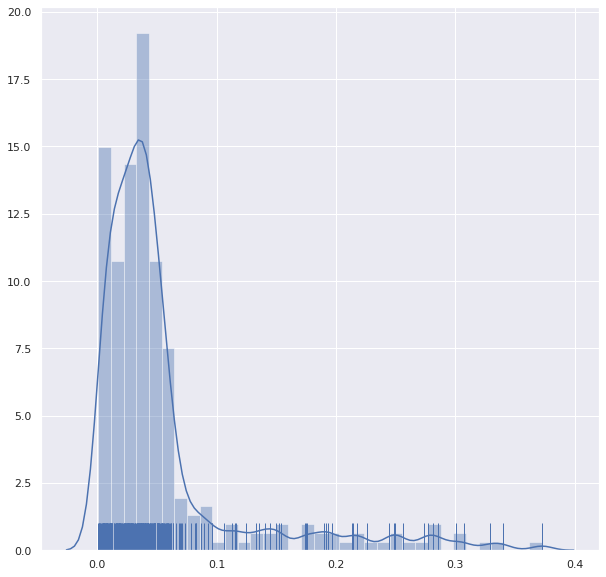


----- mkea__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



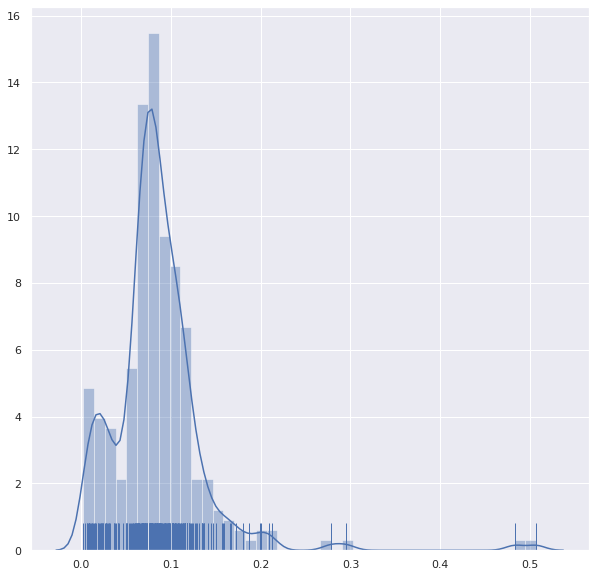


----- mkea__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



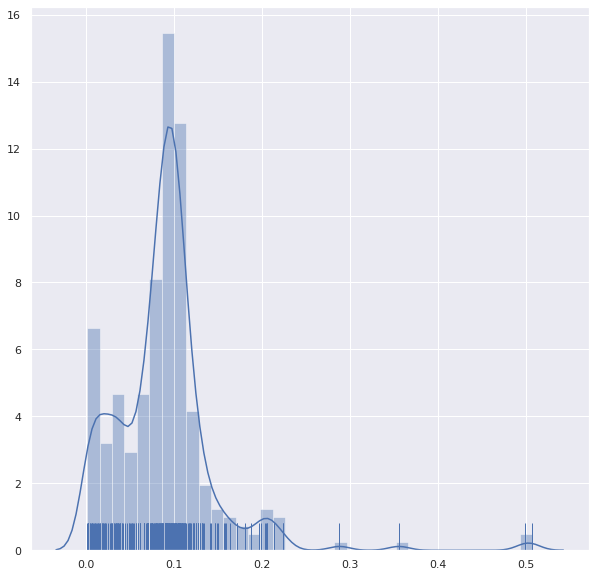


----- mlcc__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



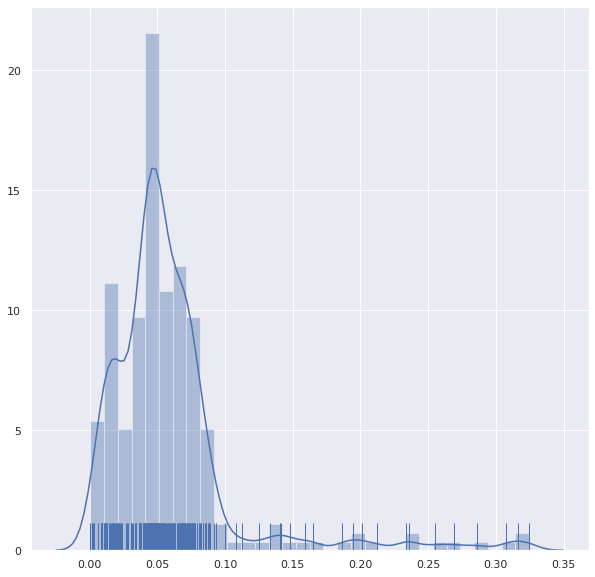


----- mlcc__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



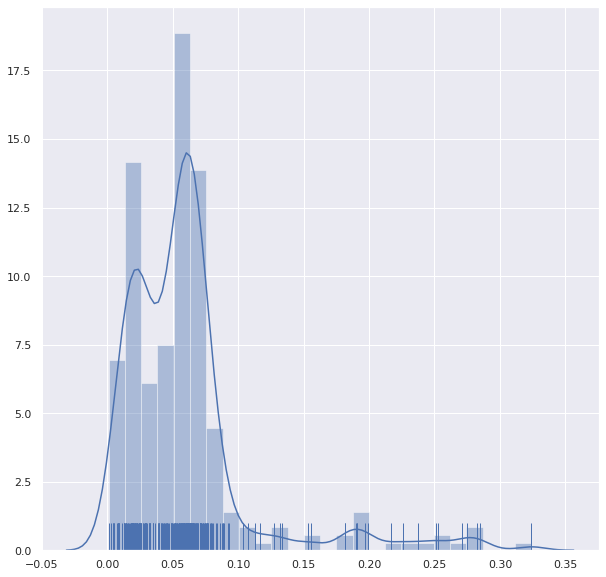


----- mles__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



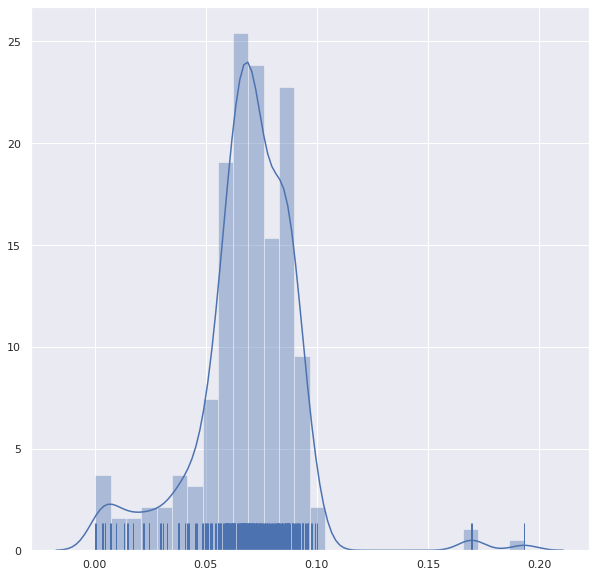


----- mles__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



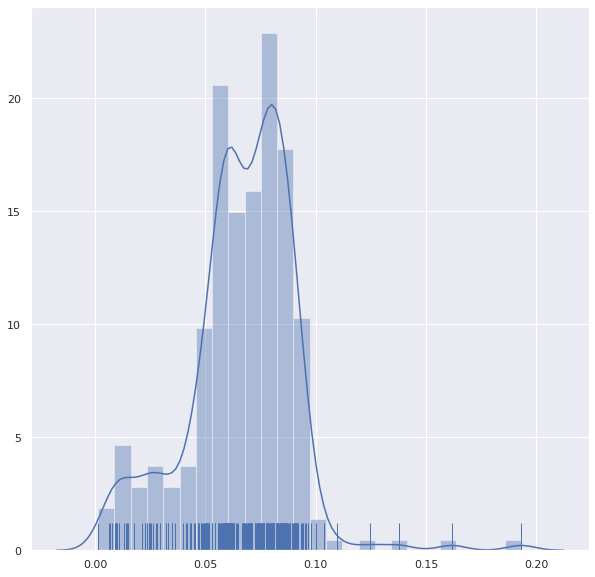


----- mlpr__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



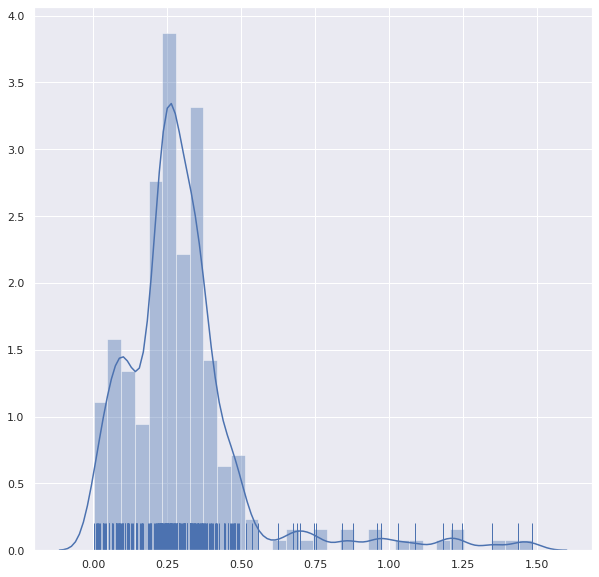


----- mlpr__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



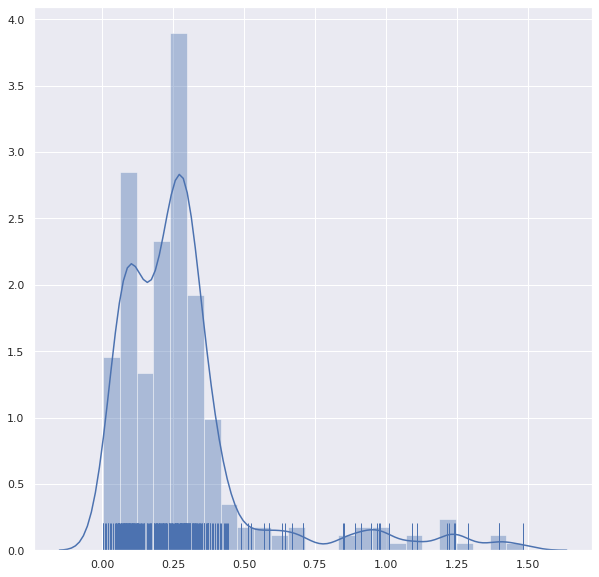


----- mlrd__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



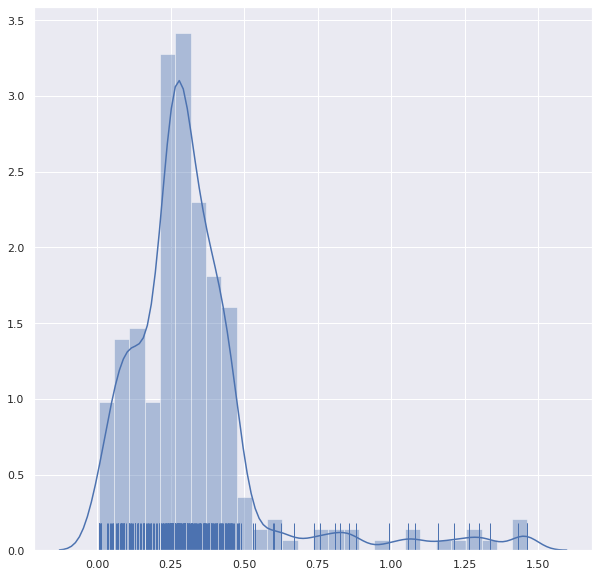


----- mlrd__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



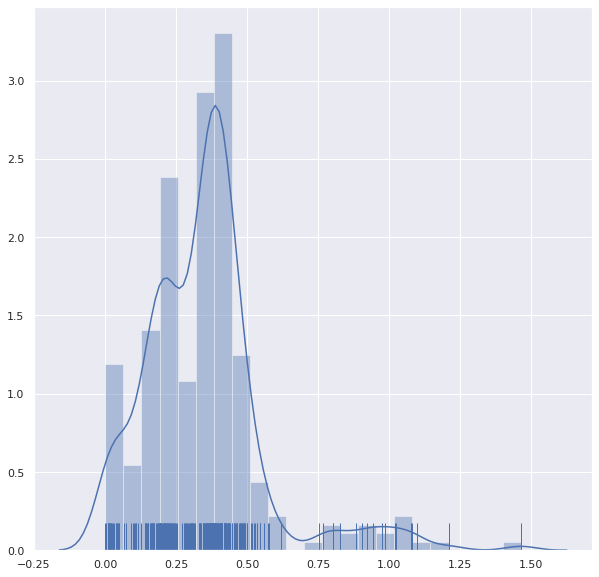


----- mmau__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



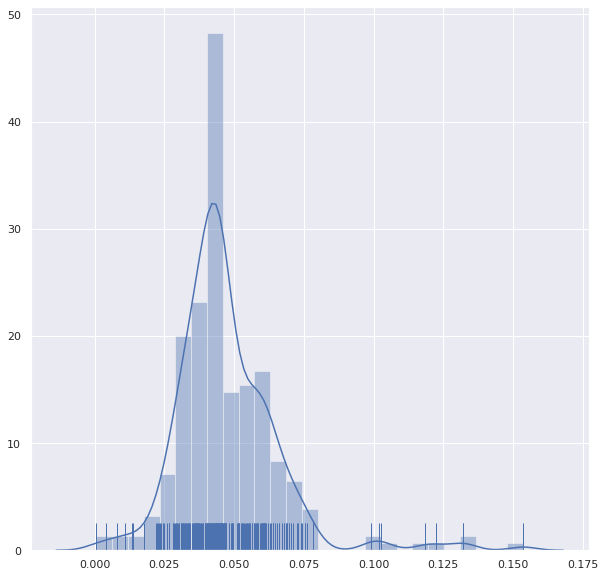


----- mmau__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



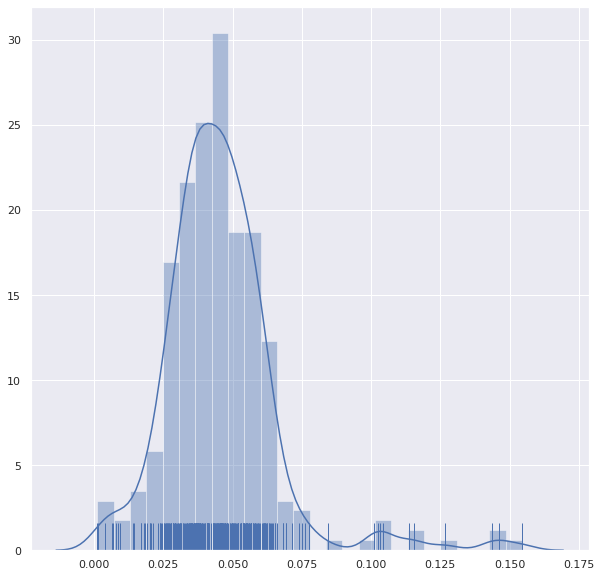


----- mokp__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



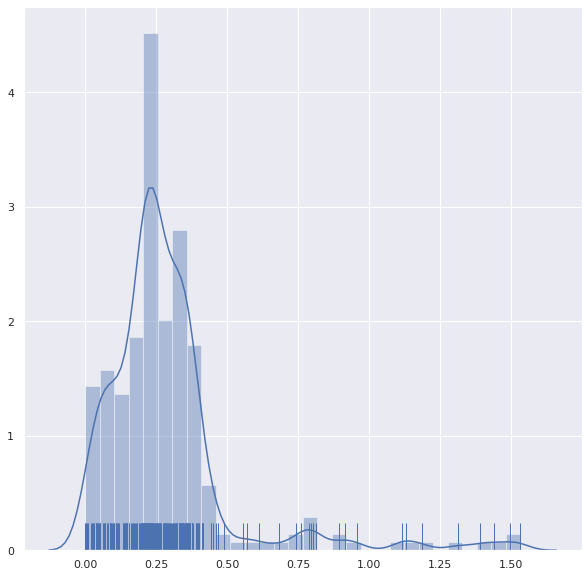


----- mokp__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



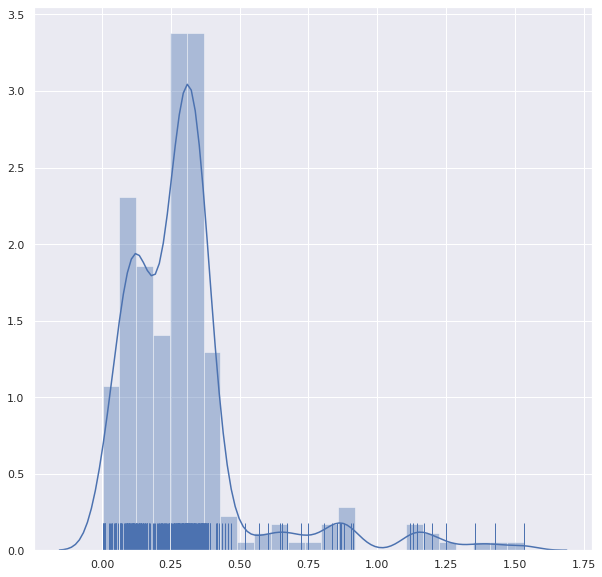


----- npit__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



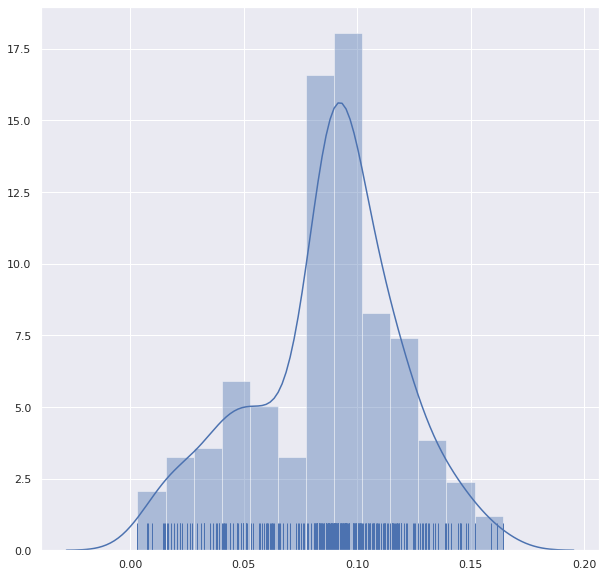


----- npit__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



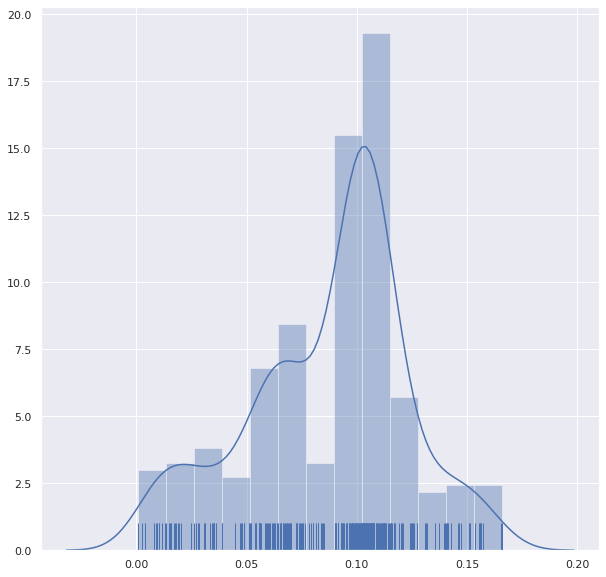


----- npoc__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



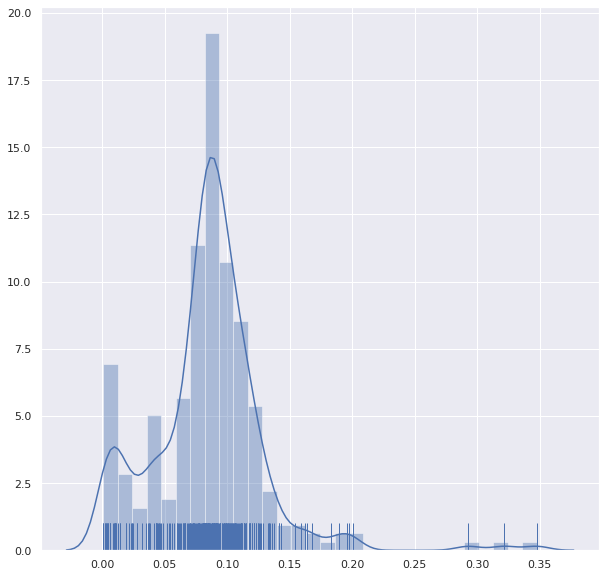


----- npoc__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



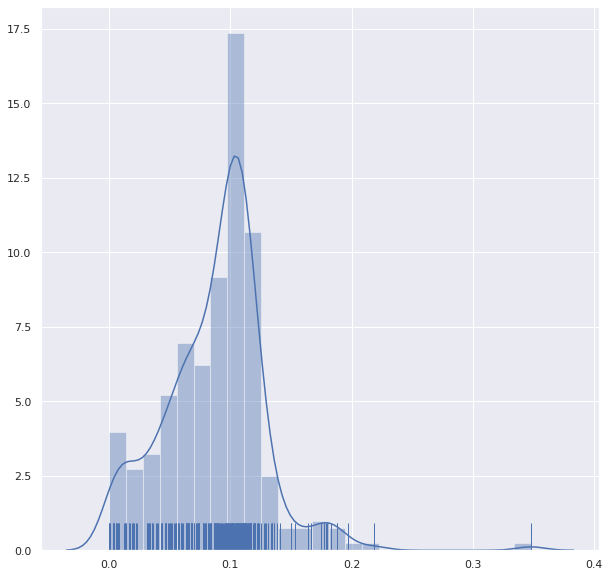


----- nupm__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



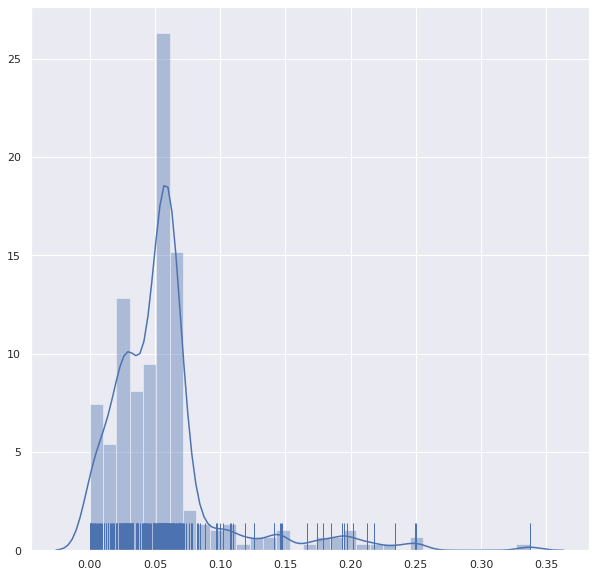


----- nupm__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



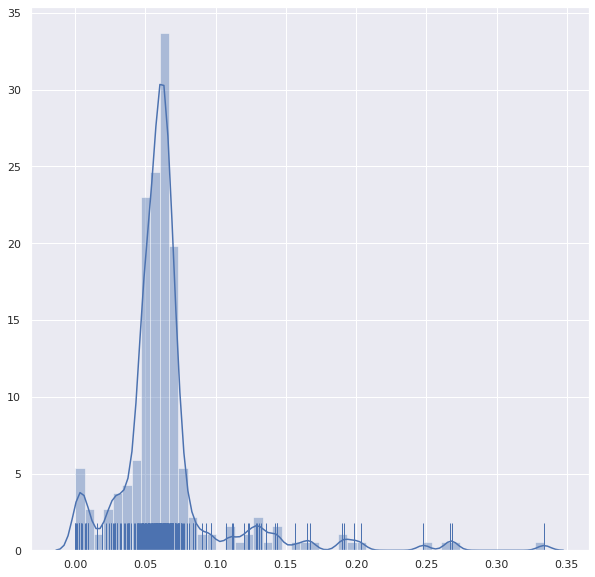


----- okit__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



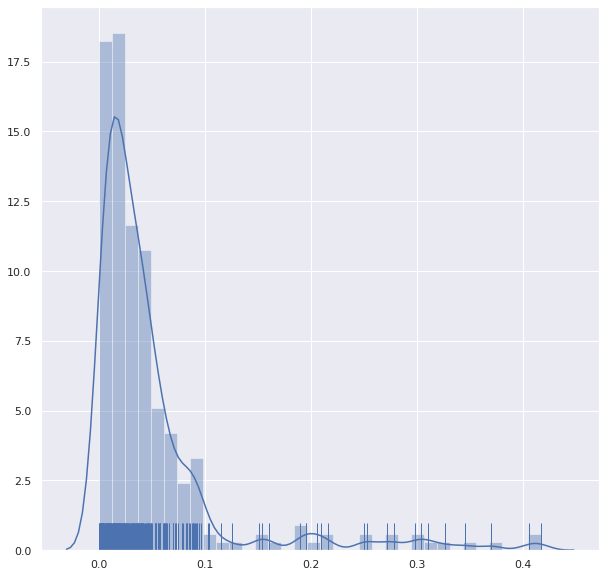


----- okit__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



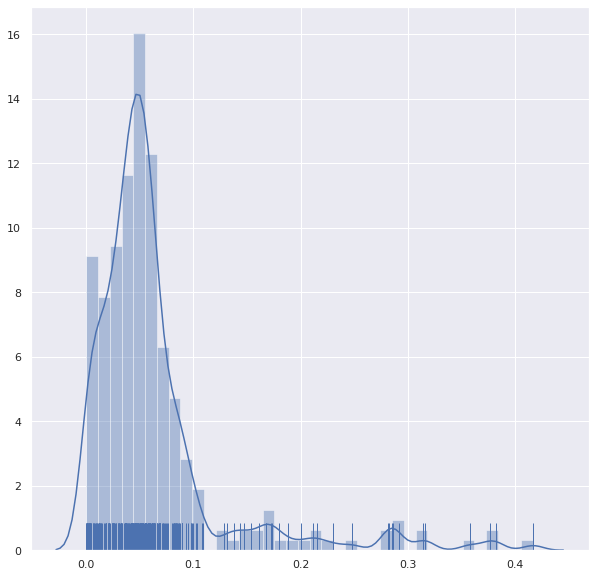


----- outl__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



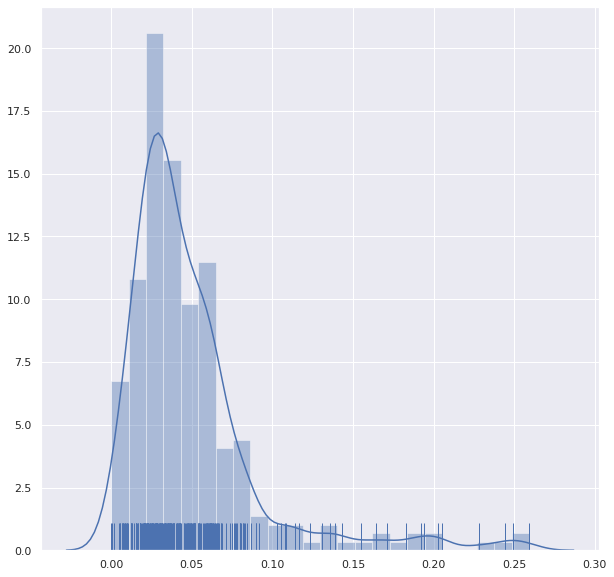


----- outl__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



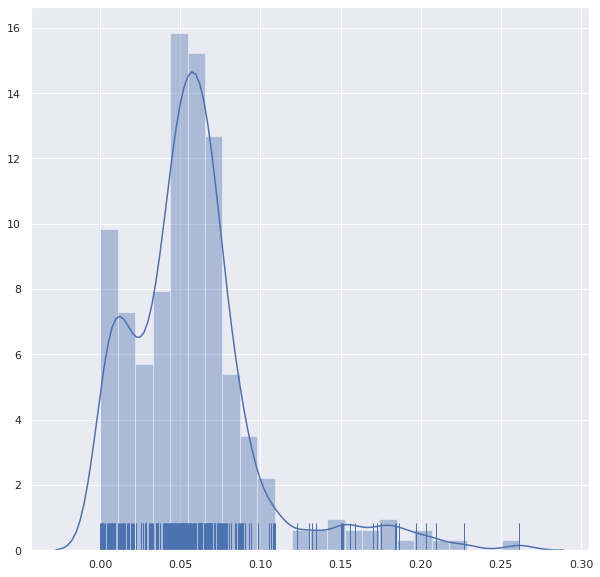


----- pat2__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



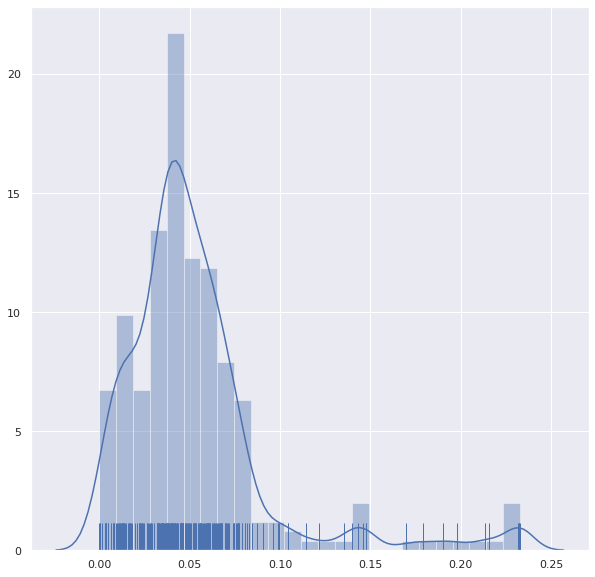


----- pat2__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



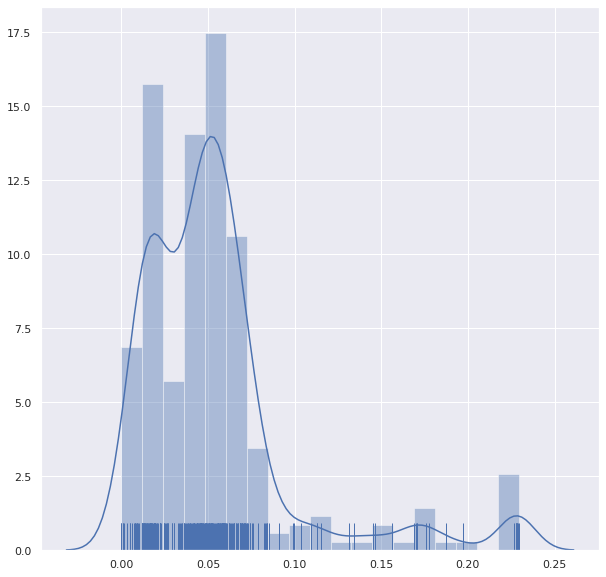


----- pg2r__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



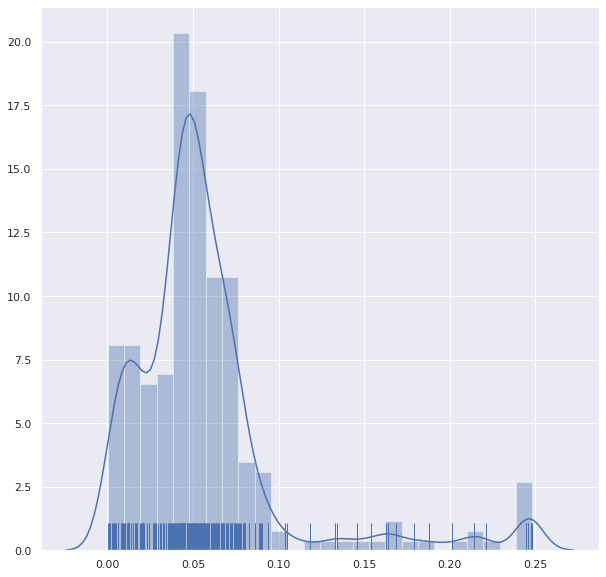


----- pg2r__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



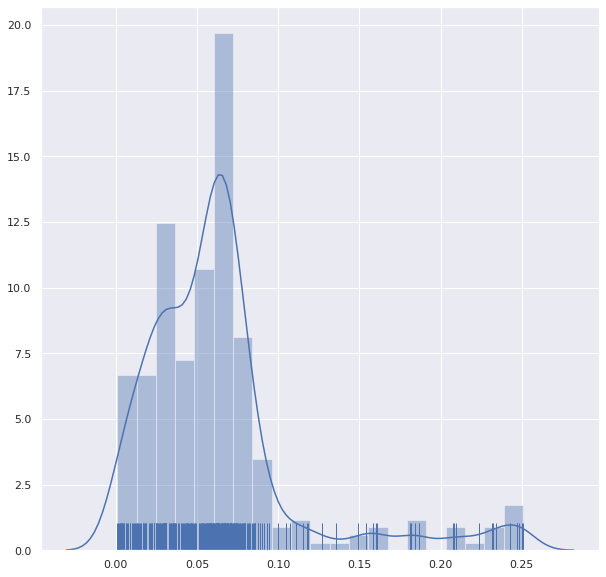


----- pgf1__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



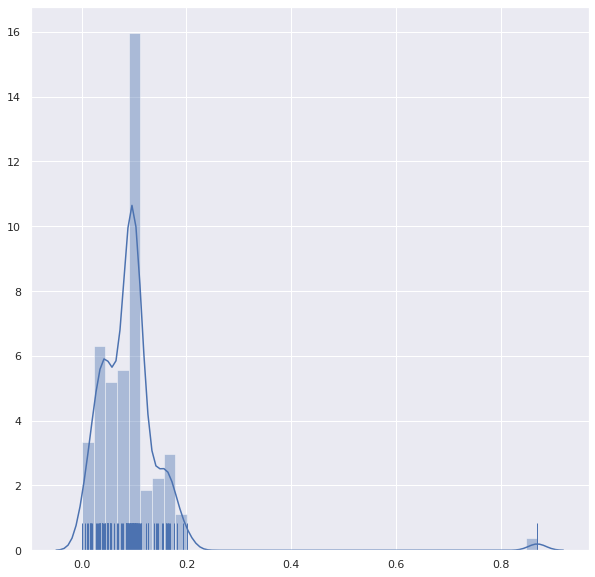


----- pgf1__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



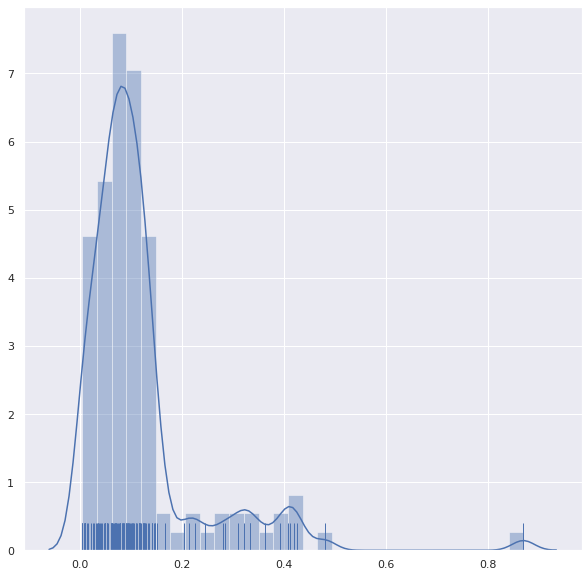


----- pgf4__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



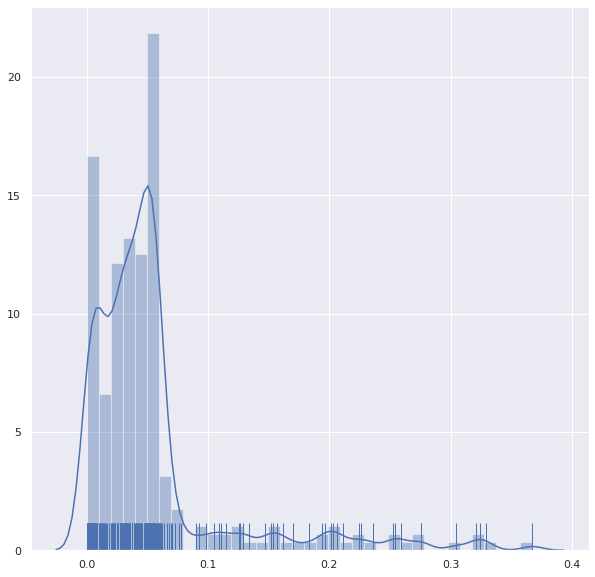


----- pgf4__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



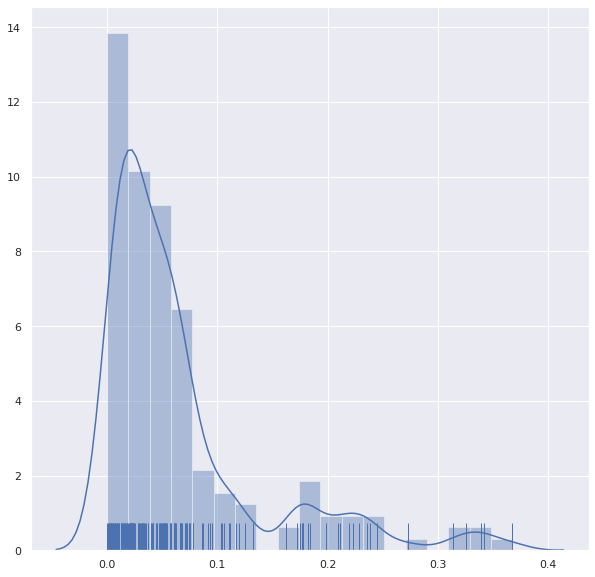


----- pgf5__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



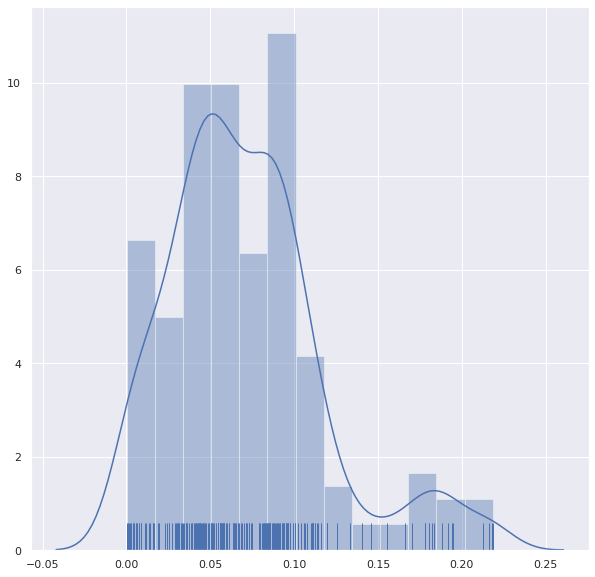


----- pgf5__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



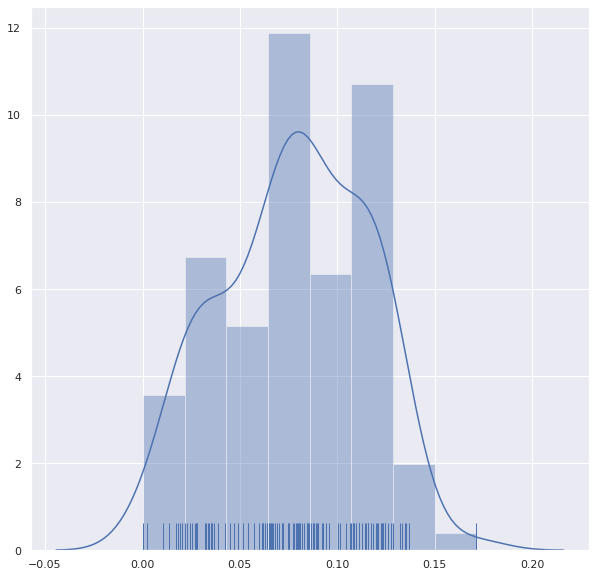


----- pgf6__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



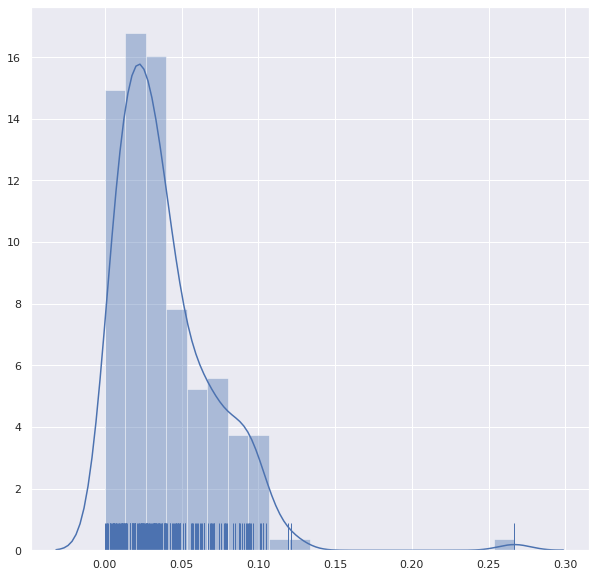


----- pgf6__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



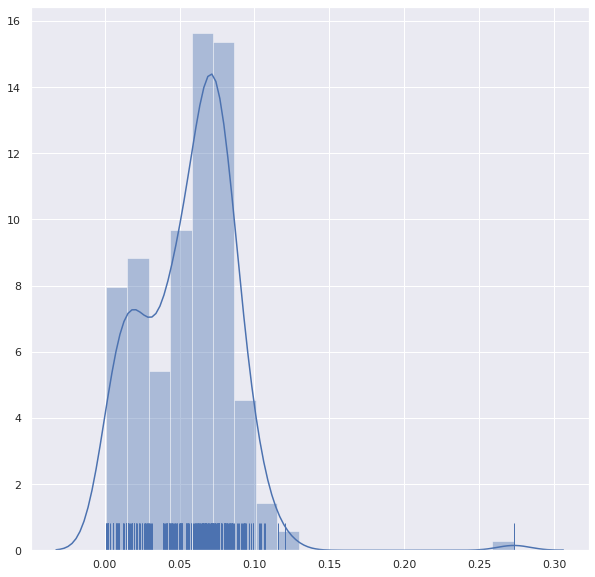


----- phan__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



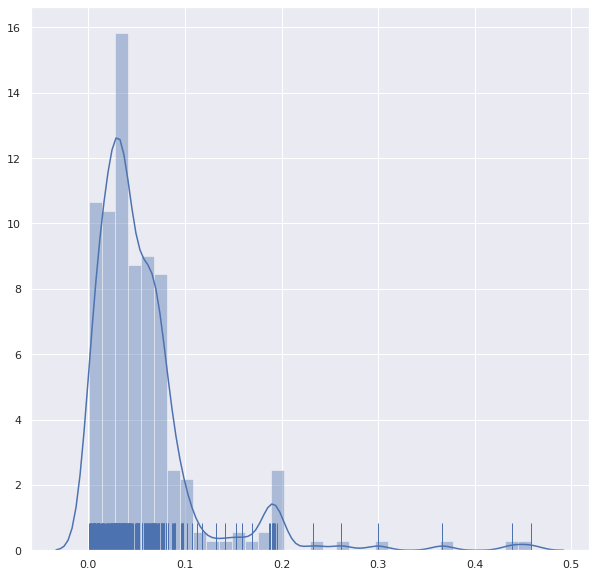


----- phan__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



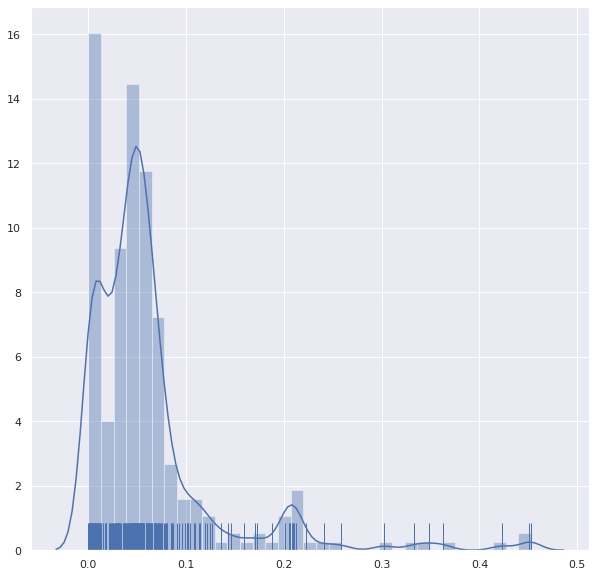


----- piik__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



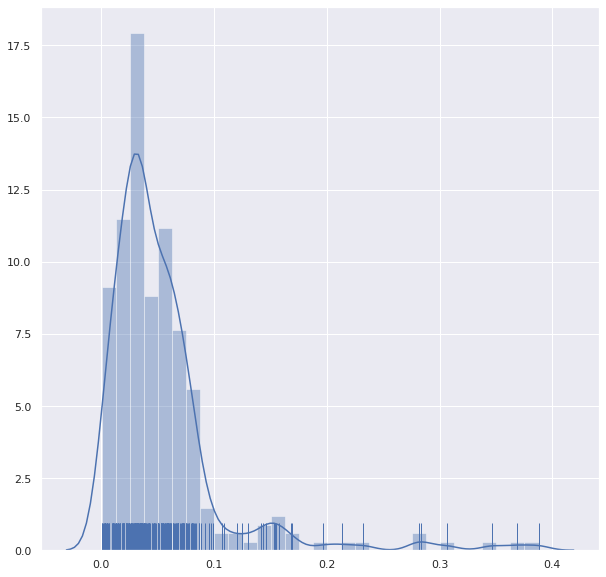


----- piik__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



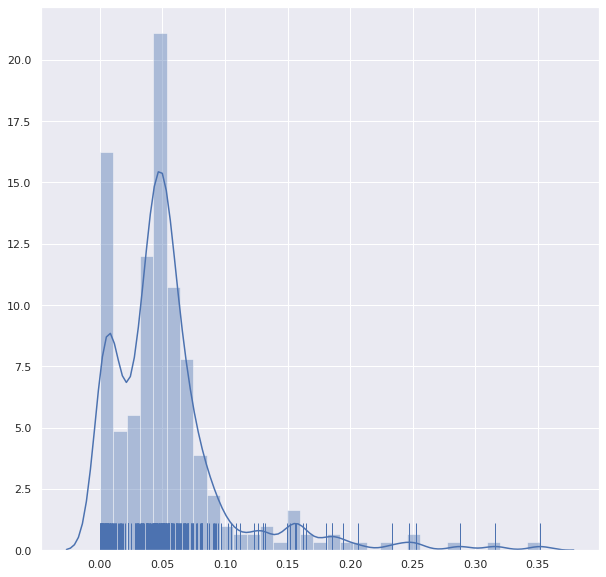


----- pmau__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



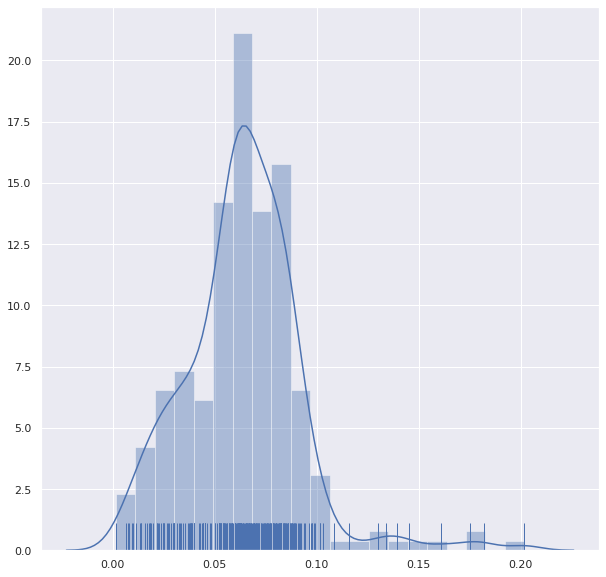


----- pmau__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



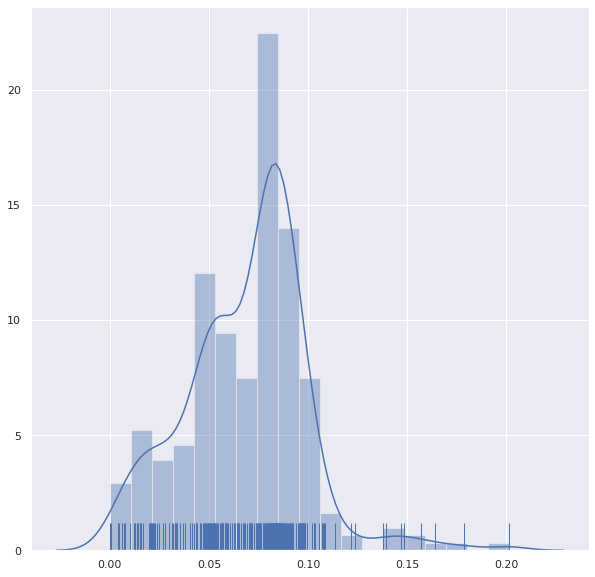


----- puka__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



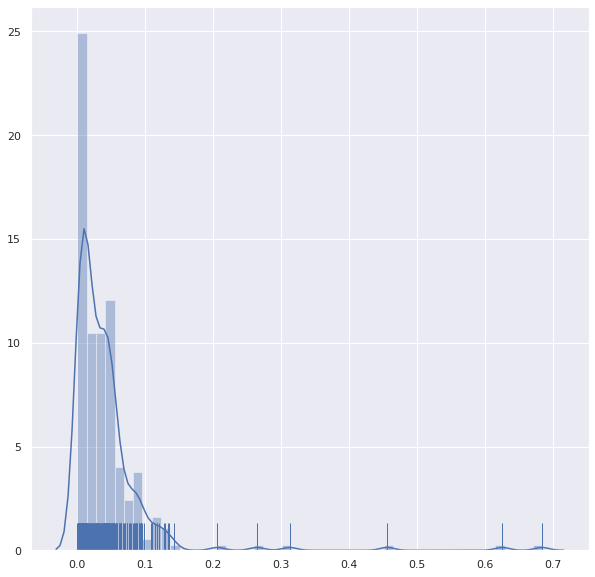


----- puka__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



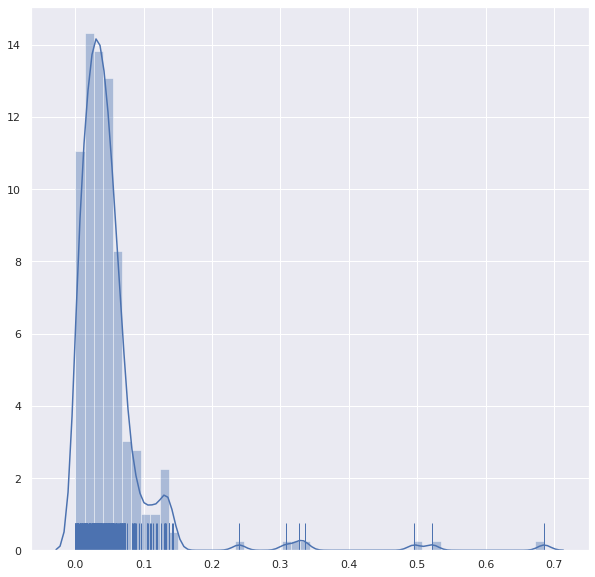


----- puoc__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



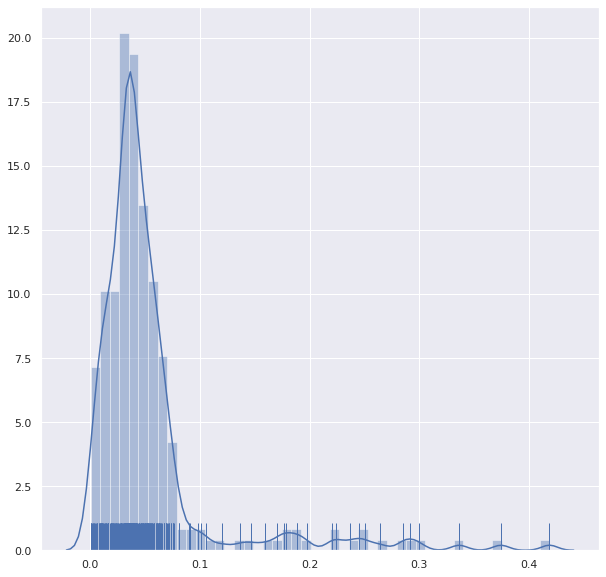


----- puoc__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



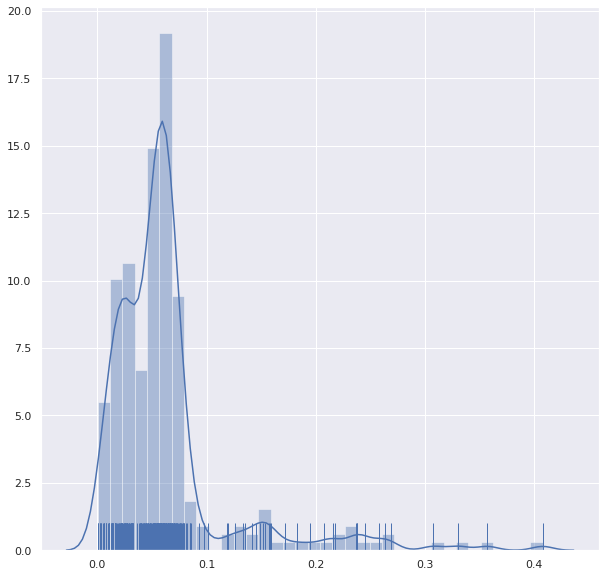


----- radf__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



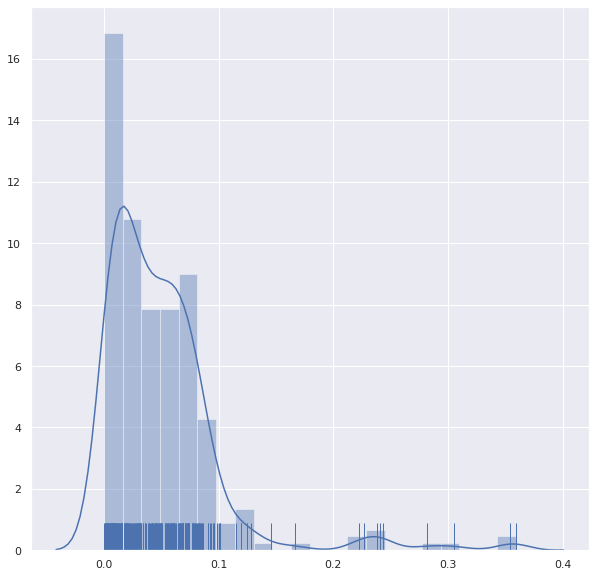


----- radf__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



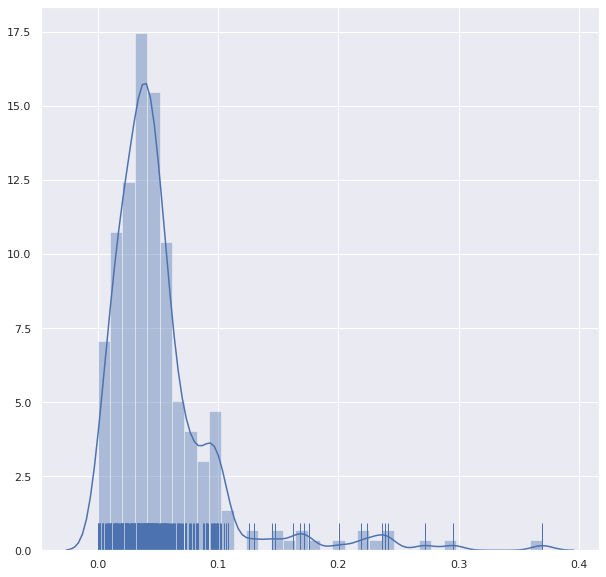


----- slpc__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



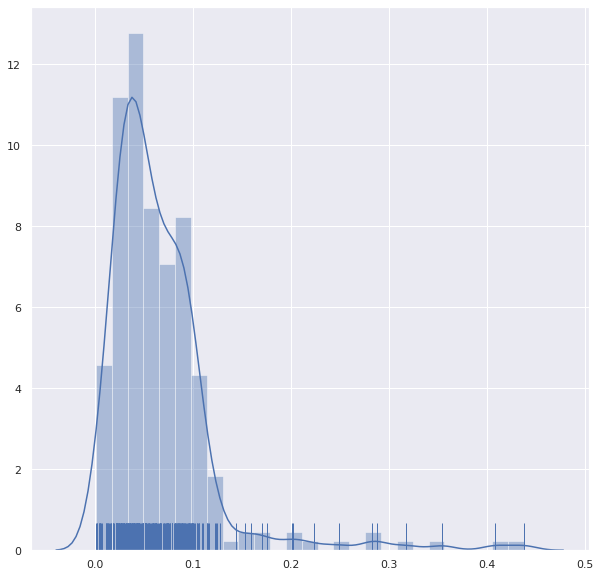


----- slpc__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



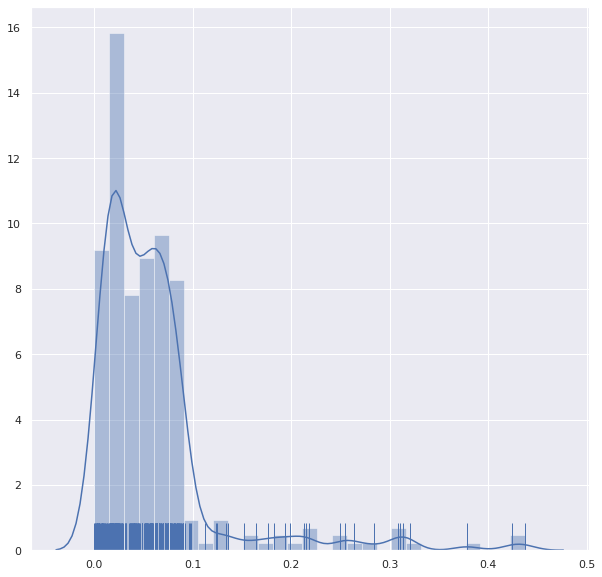


----- step__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



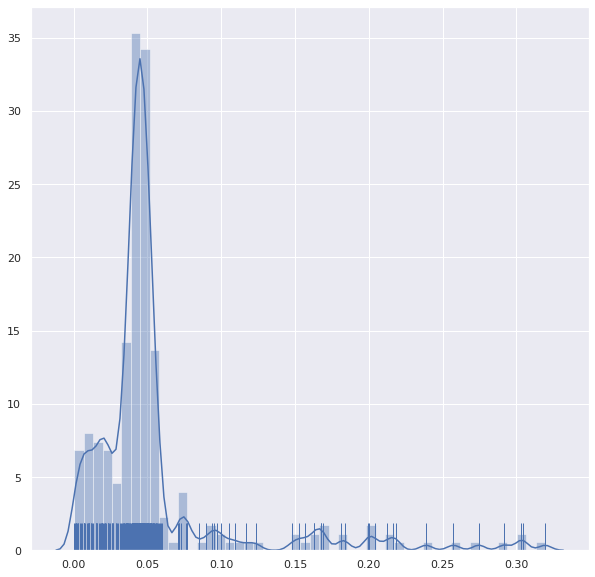


----- step__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



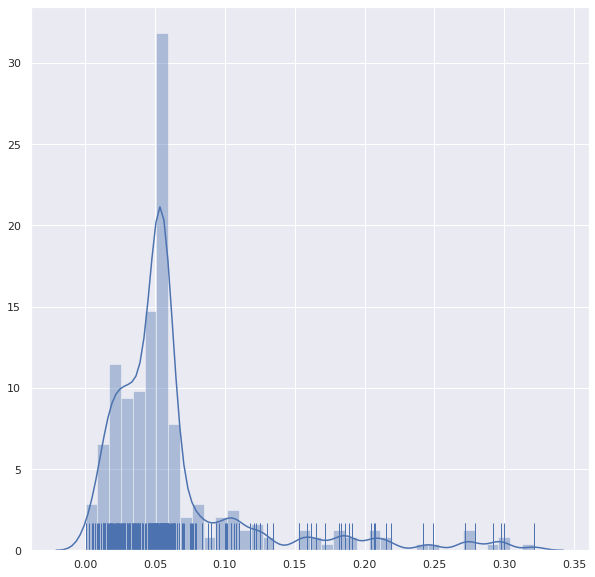


----- touo__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



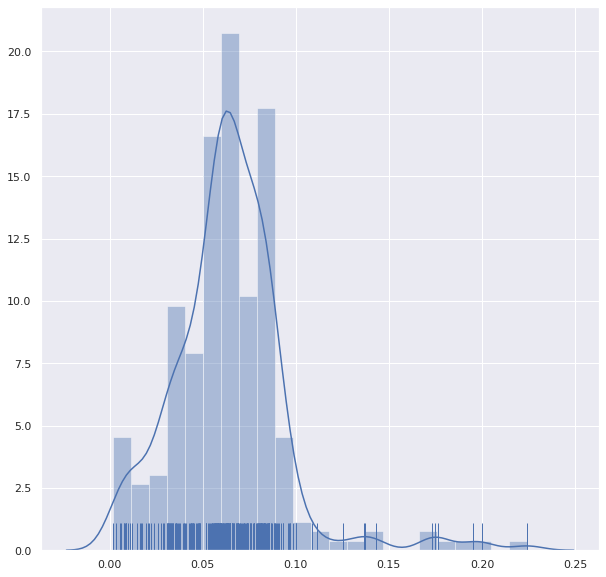


----- touo__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



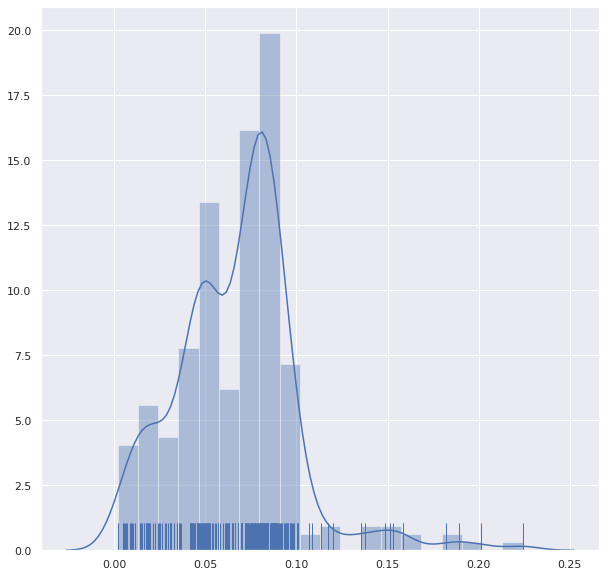


----- uwev__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



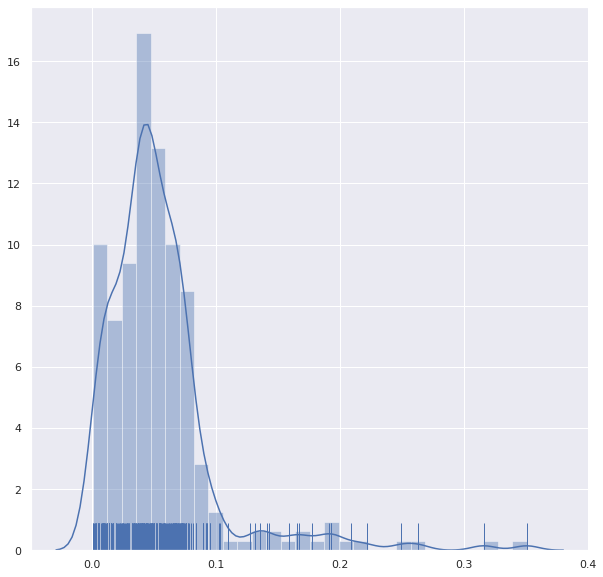


----- uwev__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



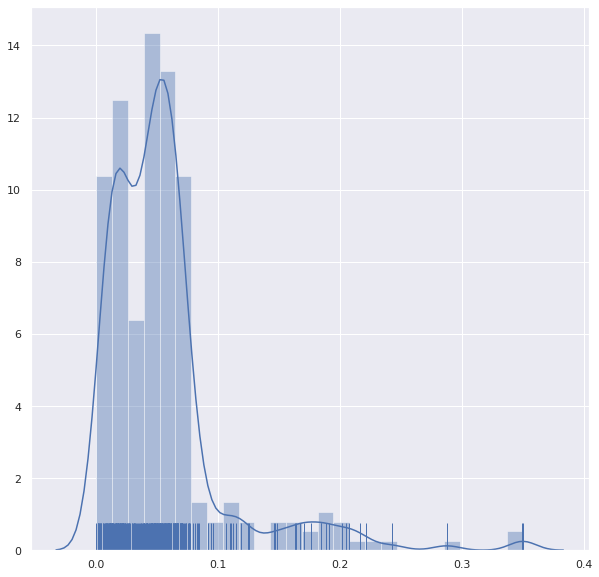


----- waor__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



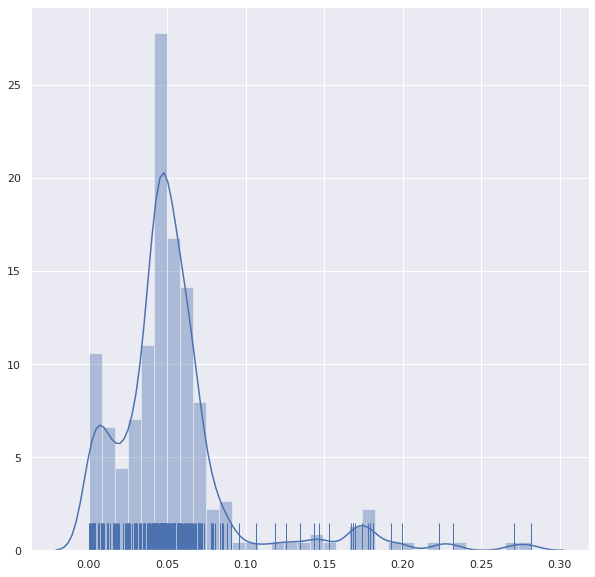


----- waor__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



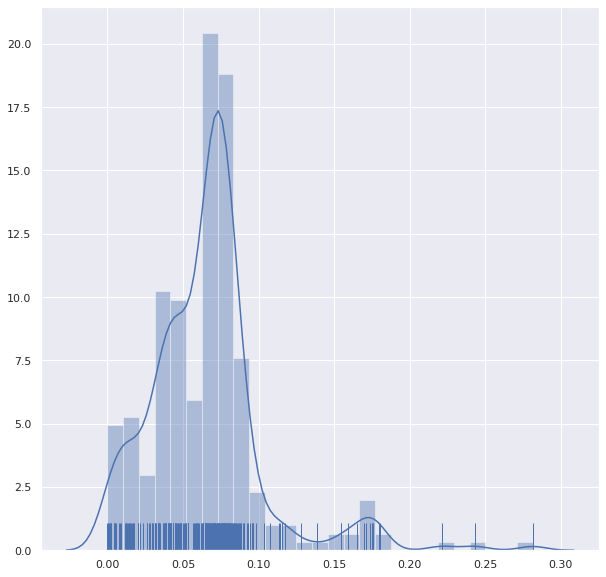


----- yeep__G07 test -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



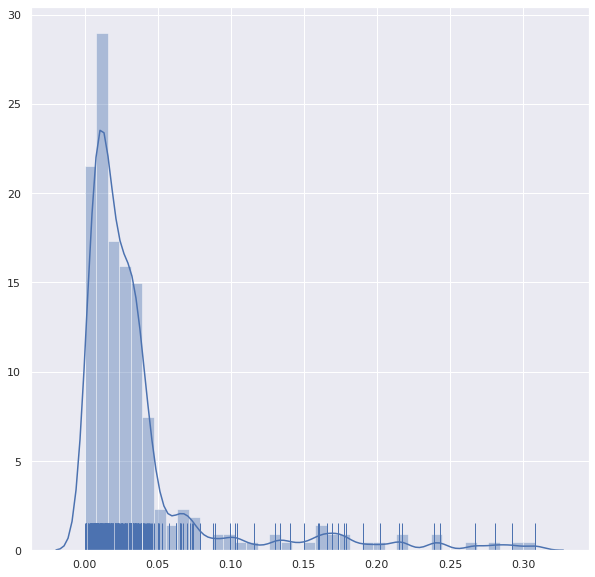


----- yeep__G07 valid -----


/home/vconstan/.conda/envs/tsunami/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



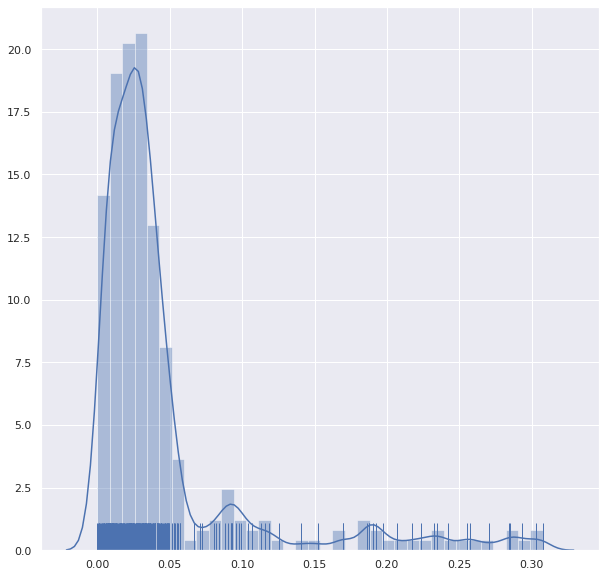

In [29]:
plot_normality(residual_dict=residuals)

We will also define a series of normality tests for the model errors that will be tracked for each of the models. We can then assess the normality of the errors across all of the trained models, and make decisions as to the appropriateness of several error handling approaches. 

In [30]:
# TODO: add a verbose parameter for each of the below normality tests that is False by default 

def shapiro_normality_test(dataframe: pd.DataFrame):
    
    # Shapiro normality test
    stat, p = stats.shapiro(dataframe["absolute_error"].values)
#     print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
#         print('Sample looks Gaussian (fail to reject H0)')
        return True
    else:
#         print('Sample does not look Gaussian (reject H0)')
        return False

In [31]:
def dagostino_k2_normality_test(dataframe: pd.DataFrame):
    
    # D’Agostino’s K^2  normality test
    stat, p = stats.normaltest(dataframe["absolute_error"].values)
#     print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
#         print('Sample looks Gaussian (fail to reject H0)')
        return True
    else:
#         print('Sample does not look Gaussian (reject H0)')
        return False

In [32]:
def anderson_normality_test(dataframe: pd.DataFrame):
    
    # Anderson-Darling normality test
    result = stats.anderson(dataframe["absolute_error"].values)
#     print('Statistic: %.3f' % result.statistic)
    p = 0
    for i in range(len(result.critical_values)):
        sl, cv = result.significance_level[i], result.critical_values[i]
        if result.statistic < result.critical_values[i]:
#             print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
            return True
        else:
#             print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))
            return False

With normality tests define, we can test each of the model errors (for both the test and validation sets) for normality and display the results. 

In [33]:
def assess_normality(residual_dict: dict) -> pd.DataFrame:
    
    """
    Applies a series of normality tests to test whether the absolute errors 
    from the trained models follow a normal distribution. 
    """
    
    # create lists to track the information for the dataframe
    row_indices = list()
    rows = list()
    
    # process each result from the modeling process
    for residual in residual_dict:
        
        # TODO: replace with regular expression that finds the pattern with __ between two /
        station_sat = residual.split("/")[4]
        
        # tests both the "test" and "valid" residuals 
        for k in residual_dict[residual].keys():
            
            # add a row entry 
            row_indices.append(station_sat + "_" + k)
            
            # run the tests 
            anderson = anderson_normality_test(dataframe=residual_dict[residual][k])
            shapiro = shapiro_normality_test(dataframe=residual_dict[residual][k])
            dagostino_k2 = dagostino_k2_normality_test(dataframe=residual_dict[residual][k])
            
            row = [anderson, shapiro, dagostino_k2]
            rows.append(row)
            
    # create the results dataframe and return in 
    normality_results_df = pd.DataFrame(
        rows,
        index=row_indices, 
        columns=["anderson", "shapiro", "dagostino_k2"]
    )
    
    return normality_results_df
        
    
    

In [34]:
normality_results_df = assess_normality(residuals)

In [35]:
# how many residual patterns have a normal (Gaussian) distribution? 
normality_results_df.sum()

anderson        0
shapiro         0
dagostino_k2    0
dtype: int64

### Utilizing Existing Approaches

First, let's put together a plotting function to show the anomaly scores and classifications. 

In [168]:
def plot_anomaly_scores(dataframe: pd.DataFrame) -> None: 
    
    """
    Plots the residual values and a heatmap of anomaly scores based. Takes a 
    pandas.DataFrame object as input with the absolute error (absolute_error) and a 
    column for anomaly scores (score).
    """
    
    # setup the plot
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(40, 10))
    grid = plt.GridSpec(4, 8, wspace=0.4, hspace=0.3)
    plt.subplot(grid[1:3, 0:8])

    # plot the absolute error
    ax1 = sns.lineplot(x=dataframe["sod"], y="absolute_error", data=dataframe, color="black")
    ax1.margins(x=0)

    # shade in the region where any anomalies were detected
    anom_ranges = list()
    
    # track the curren ranges
    current_range_start = None
    current_range_end = None
    
    # find the ranges 
    for idx, row in dataframe[["sod", "assignment"]].iterrows():
                
        # if true, start a range
        if row["assignment"] in [True, 1.0] and current_range_start is None:

            # start the range
            current_range_start = row["sod"]

        # if false, end a range
        elif row["assignment"] in [False, 0.]:

            # cap the range 
            current_range_end = dataframe.loc[idx - 1, "sod"]
            
            # and append if complete
            if current_range_start is not None and current_range_end is not None:
                anom_ranges.append([current_range_start, current_range_end])

                # reset
                current_range_start = None
                current_range_end = None

  
                
    # plot the anomaly detections
    for anom_range in anom_ranges:          
        ax1.axvspan(anom_range[0], anom_range[1], alpha=0.3, color='red')

    # plot the anomaly scores on the heatmap
    plt.subplot(grid[0, 0:8])
    ax2 = sns.heatmap(
        [dataframe["score"].values],
        cmap="bwr",
        cbar=False,
        xticklabels=False,
        yticklabels=False,
    )


    plt.show()


#### Gaussian Tail

In [176]:
def gaussian_parametric_thresholding(dataframe: pd.DataFrame, window_size: int = 10, moving_average_window_size: int = 3, error_threshold: float = 0.0001) -> pd.DataFrame: 
    
    """
    Utilizes Gaussian parametric thresholding to flag time-series observations as 
    anomalous or nominal. 
    
    Thanks Kyle Hundman: https://github.jpl.nasa.gov/Telemetry-Anomaly-Detection/telemanom-experiments/blob/master/telemanom/numenta-errors.py
    
    """
    
    # create a list to store the calculated anomaly scores
    scores = list()
    
    # pad the scores 
    [scores.append(0.) for x in range(0, window_size)]
    
    # for each observation in the sliding window
    for idx in range(window_size, dataframe.shape[0]):
        
        # get the window of past errors 
        error_value_window = dataframe.loc[idx-window_size:idx, "absolute_error"].values
#         print(error_value_window)
                
        # get the error value at this time step 
        error_value = error_value_window[-1]
#         print(error_value)
    
        # calculate the mean of the window
        error_value_window_mean = np.mean(error_value_window)
    
        # calculate the standard deviation of the sliding window 
        error_value_window_std = np.std(error_value_window)
    
        # calculate a short-term average (smoothing effect)
        error_value_short_window = dataframe.loc[moving_average_window_size-window_size:idx, "absolute_error"].values
        error_value_short_window_mean = np.mean(error_value_short_window)
        
        # TODO (VERIFY): calculate the anomaly scores 
        L = stats.norm(error_value_window_mean, error_value_window_std).pdf(error_value_short_window_mean)
#         L = 1 - ((error_value_short_window_mean - error_value_window_mean) / error_value_window_variance)
        
        scores.append(L)
        
    # TODO (VERIFY): using the specified threshold, classify each time period as anomalous or not
    assignments = [True if L < error_threshold else False for L in scores]
        
    # return a pandas.DataFrame object with scores and classifications
    anomaly_scores_assignments_df = pd.DataFrame(
        np.array([scores, assignments]).T,
        columns=["score", "assignment"]
    )
    
    return anomaly_scores_assignments_df
    
    
    

In [177]:
gaussian_parametric_thresholding_anomalies = gaussian_parametric_thresholding(
    dataframe=residuals["../output/SatExperiment_hawaii_2012/output/knne__G07/residuals"]["valid"],
    window_size=10,
    moving_average_window_size=3,
    error_threshold=0.0001
)

In [178]:
# gaussian_parametric_thresholding_anomalies.head(50)

In [179]:
# merge the scores

df_analysis = pd.concat(
    [residuals["../output/SatExperiment_hawaii_2012/output/knne__G07/residuals"]["valid"], 
     gaussian_parametric_thresholding_anomalies
    ], 
    axis=1, 
    join='inner'
)

In [180]:
# df_analysis.head(50)

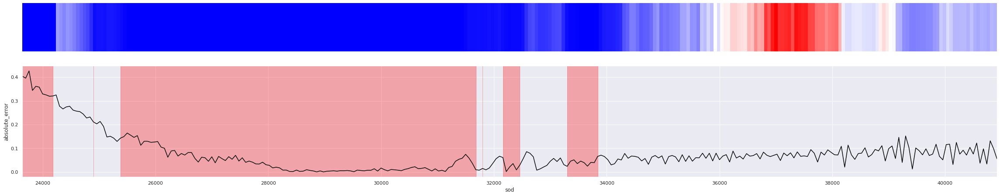

In [181]:
plot_anomaly_scores(
    dataframe=df_analysis
)

#### Non-Parametric Dynamic Thresholding

## Scratch

### Using a Time-based Distancing Approach 

For each observation, get the distances from each of the previous observations from _T_ steps prior (so the difference / distance in absolute errors). Then, log transform these distances to prioritize local anomalies (inspired from approach by Ian Colwell for MSL anomaly detection). 

In [12]:
# number of previous time steps T to consider
DIST_WINDOW = 10

In [13]:
def calc_dist_measure(dataframe: pd.DataFrame, window_size: int = 10, show_dist_plot: bool = False) -> pd.DataFrame:

    """
    Calculates the distance 
    """
    
    # create a dataframe for the errors 
    df_error = dataframe[["sod", "absolute_error_sma_3"]].iloc[window_size:].reset_index().sort_values(by="sod")
    
    # create a dataframe to store distances between absolute errors
    # more specifically, to store the mean distance from an observation 
    # to its previous N neighbors 
    df_error_dist = pd.DataFrame(list(), index=df_error["sod"], columns=df_error["sod"])
    for idx, row in tqdm(df_error.iterrows(), total=df_error.shape[0]):
    
        # get the current absolute error 
        abs_error = row["absolute_error_sma_3"]

        # get the absolute error values for the previous N values
        prev = dataframe.iloc[idx:idx+window_size] # note indexing to account for window size 
        
        # get the distances 
        for idx2, row2 in prev.iterrows():
            
            # TODO: could apply a weighted average here 
            
            dist = spatial.distance.euclidean(abs_error, row2["absolute_error_sma_3"])    
            # note log transformed values here :
            df_error_dist.loc[row["sod"], row2["sod"]] = np.log(dist + 1.)
#             df_error_dist.loc[row["sod"], row2["sod"]] = dist
            df_error_dist.loc[row2["sod"], row["sod"]] = np.log(dist + 1.) 
#             df_error_dist.loc[row2["sod"], row["sod"]] = dist 
            
    # optionally show a plot 
    if show_dist_plot is True:
        plt.figure(figsize=(15, 10))
        ax = sns.heatmap(df_error_dist.sort_index().sort_index(axis=1).fillna(0.))
        plt.show()
        
    # use that distance matrix to get the min/max/mean distance in the last window  
    # we only want to use observations with a full window size 
    counts = df_error_dist.count().reset_index().rename(columns={0: "counts"})
    full_sods = counts[counts["counts"] >= window_size]["sod"]
    
#     df_error_dist_flat = df_error_dist.loc[full_sods].mean(axis=1)
    df_error_dist_flat = df_error_dist.loc[full_sods].min(axis=1)
#     df_error_dist_flat = df_error_dist.loc[full_sods].max(axis=1)
    df_error_dist_flat = df_error_dist_flat.reset_index().rename(columns={0: "dist_measure"})

    return df_error_dist_flat

In [14]:
df_test_dist_calc = calc_dist_measure(
    df_test,
    window_size=DIST_WINDOW,
    show_dist_plot=True
)

NameError: name 'df_test' is not defined

In [ ]:
df_test_dist_calc["dist_measure"].shape

In [ ]:
def get_val(dataframe, row):
    try:
        return dataframe[dataframe["sod"] == row]["dist_measure"].values[0]
    except:
        return 0.

In [ ]:
df_test["dist_measure"] = [0.] * df_test.shape[0]
df_test["dist_measure"] = df_test["sod"].apply(
    lambda x: get_val(df_test_dist_calc, x)
)

# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# df_test["dist_measure_scaled"] = scaler.fit_transform([df_test["dist_measure"].values]).T

# df_test["dist_measure"]

In [ ]:
sns.distplot(df_test["dist_measure"].values, kde=True, rug=True);

In [ ]:
df_test["dist_measure"].describe()

In [ ]:
m_test = loop.LocalOutlierProbability(
    df_test.iloc[BATCH_SIZE:]["absolute_error"].values, 
    extent=3, 
    n_neighbors=30
).fit()
m_test_scores = m_test.local_outlier_probabilities
df_test["loop_scores"] = list([0.] * BATCH_SIZE) + list(m_test_scores)

In [ ]:
VMAX = 0.01

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(40, 10))
grid = plt.GridSpec(4, 8, wspace=0.4, hspace=0.3)

plt.subplot(grid[1:3, 0:8])

# ax1 = plt.figure(figsize=(30, 10))
ax1 = sns.lineplot(x=df_test["sod"], y="absolute_error", data=df_test, color="black")
ax1.margins(x=0)

# add a vertical line to indicate when a full window of distance values is available 
ax1.axvline(df_test.iloc[DIST_WINDOW]["sod"], color="purple", linestyle="--")
ax1.text(df_test.iloc[DIST_WINDOW]["sod"] + 80, np.max(df_assess["absolute_error"].values) / 2, "Window Buffer", rotation=90, verticalalignment='center', color="purple")

plt.subplot(grid[0, 0:8])
ax2 = sns.heatmap(
    [df_test["dist_measure"].values],
    cmap="bwr",
    cbar=False,
    xticklabels=False,
    yticklabels=False,
    vmin=0, 
    vmax=VMAX
)


plt.show()

In [ ]:
df_assess_dist_calc = calc_dist_measure(
    df_assess,
    window_size=DIST_WINDOW,
    show_dist_plot=False
)

In [ ]:
df_assess["dist_measure"] = [0.] * df_assess.shape[0]
df_assess["dist_measure"] = df_assess["sod"].apply(
    lambda x: get_val(df_assess_dist_calc, x)
)

In [ ]:
sns.distplot(df_assess["dist_measure"].values, kde=True, rug=True);

In [ ]:
df_assess["dist_measure"].describe()

In [ ]:
m_assess = loop.LocalOutlierProbability(
    df_assess.iloc[BATCH_SIZE:]["absolute_error"].values, 
    extent=3, 
    n_neighbors=30
).fit()
m_assess_scores = m_assess.local_outlier_probabilities
df_assess["loop_scores"] = list([0.] * BATCH_SIZE) + list(m_assess_scores)

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(40, 10))
grid = plt.GridSpec(4, 8, wspace=0.4, hspace=0.3)

plt.subplot(grid[1:3, 0:8])

# ax1 = plt.figure(figsize=(30, 10))
ax1 = sns.lineplot(x=df_assess["sod"], y="absolute_error", data=df_assess, color="black")
ax1.margins(x=0)

# add a vertical line to indicate the event 
ax1.axvline(sod_annotations[SAT], color="blue", linestyle="--")
ax1.text(sod_annotations[SAT] + 80, np.max(df_assess["absolute_error"].values) / 2, "Start of Event", rotation=90, verticalalignment='center', color="blue")

# add a vertical line to indicate when a full window of distance values is available 
ax1.axvline(df_assess.iloc[DIST_WINDOW]["sod"], color="purple", linestyle="--")
ax1.text(df_assess.iloc[DIST_WINDOW]["sod"] + 80, np.max(df_assess["absolute_error"].values) / 2, "Window Buffer", rotation=90, verticalalignment='center', color="purple")


plt.subplot(grid[0, 0:8])
ax2 = sns.heatmap(
    [df_assess["dist_measure"].values],
    cmap="bwr",
    cbar=False,
    xticklabels=False,
    yticklabels=False,
    vmin=0, 
    vmax=VMAX
)

plt.show()